<a href="https://colab.research.google.com/github/DrMohamedElsherif/Neural-Data-Science2024--UniTuebingen/blob/main/Transcriptomics_and_Electrophysiological_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div style="background-color: yellow; color: black; padding: 2px; border-radius: 5px; font-size: 20px;"><strong>NOTE:</strong></div>
<div style="background-color: red; color: white; padding: 2px; border-radius: 5px;">
    <ol style="font-size: 16px;">
    <li><strong>This Notebook is error-free and takes approximately 90 minutes to rerun completely on a Mac Pro M2!</strong></li>
    <li><strong>The ILIAS submission includes a CSV file named "normalized_counts.csv." The explanation for using this file is provided in Task 2. Please download this file into the data folder of the directory to ensure the Notebook runs for the subsequent Tasks.</strong></li>
    <li><strong>For your convenience, we have also included an identical .html formatted runned copy of this .ipynb notebook.</strong></li>
    </ol>
</div>
<div style="background-color: red; color: yellow; padding: 2px; border-radius: 5px; text-align: center; font-size: 18px;"><strong>Thank You for your Time and Support!</strong></div>

Lecturer: Prof. Dr. Philipp Berens

Tutors: Jonas Beck, Ziwei Huang, Rita González Márquez

Summer term 2024

Names: <div style="color: black; font-size: 20px;"><strong>Mohamed Elsherif, Marco Wolfer</strong></div>

# Neural Data Science Project 03

In [ ]:
%matplotlib notebook

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import string

import scipy as sp
from scipy import sparse
import sklearn

####### add your packages ########
import seaborn as sns
from scipy.stats import (
    median_abs_deviation,
    zscore,
    nbinom,
    ttest_rel,
    norm,
    skew,
    kurtosis,
    pearsonr,
)
from scipy.spatial.distance import pdist, squareform

import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan

!pip install dcor --quiet
import dcor

!pip install conorm --quiet
import conorm

from sklearn.decomposition import PCA
from openTSNE import TSNE
from openTSNE import initialization as tsne_init
from sklearn.manifold import TSNE
from sklearn.model_selection import KFold, GridSearchCV

!pip install anndata --quiet
from anndata import AnnData

!pip install scanpy --quiet
import scanpy as sc
import umap

from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (
    accuracy_score,
    recall_score,
    silhouette_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
)

from scipy.special import gammaln, logsumexp
from mpl_toolkits.axes_grid1 import make_axes_locatable

!pip install tqdm --quiet
from tqdm import tqdm

import warnings

warnings.filterwarnings("ignore")
# warnings.filterwarnings("ignore", category=UserWarning)
# warnings.filterwarnings("ignore", category=RuntimeWarning)
##################################


%matplotlib inline

import time
import pickle
import memory_profiler

%load_ext memory_profiler

from pathlib import Path

In [ ]:
import black
import jupyter_black

jupyter_black.load(line_length=79)

In [ ]:
variables_path = Path("../results/variables")
figures_path = Path("../results/figures")
data_path = Path("../data")

In [ ]:
plt.style.use("../matplotlib_style.txt")

In [ ]:
np.random.seed(42)

# Data

We are going to use the multimodal data from the paper Scala et al. 2021 (https://www.nature.com/articles/s41586-020-2907-3#Sec7). In particular, you will work with transcriptomics and electrophysiological data. From the transcriptomics gene counts, we will only work with the exon counts for simplicity. Some of the electrophysiological features are not high-quality recordings, therefore we will also filter them out for the project.

## Import

### Meta data

In [ ]:
# META DATA

meta = pd.read_csv(data_path / "m1_patchseq_meta_data.csv", sep="\t")

cells = meta["Cell"].values

layers = meta["Targeted layer"].values.astype("str")
cre = meta["Cre"].values
yields = meta["Yield (pg/µl)"].values
yields[yields == "?"] = np.nan
yields = yields.astype("float")
depth = meta["Soma depth (µm)"].values
depth[depth == "Slice Lost"] = np.nan
depth = depth.astype(float)
thickness = meta["Cortical thickness (µm)"].values
thickness[thickness == 0] = np.nan
thickness = thickness.astype(float)
traced = meta["Traced"].values == "y"
exclude = meta["Exclusion reasons"].values.astype(str)
exclude[exclude == "nan"] = ""

mice_names = meta["Mouse"].values
mice_ages = meta["Mouse age"].values
mice_cres = np.array(
    [
        c if c[-1] != "+" and c[-1] != "-" else c[:-1]
        for c in meta["Cre"].values
    ]
)
mice_ages = dict(zip(mice_names, mice_ages))
mice_cres = dict(zip(mice_names, mice_cres))

print("Number of cells with measured depth:    ", np.sum(~np.isnan(depth)))
print("Number of cells with measured thickness:", np.sum(~np.isnan(thickness)))
print("Number of reconstructed cells:          ", np.sum(traced))

sliceids = meta["Slice"].values
a, b = np.unique(sliceids, return_counts=True)
assert np.all(b <= 2)
print("Number of slices with two cells:        ", np.sum(b == 2))

# Some consistency checks
assert np.all(
    [
        np.unique(meta["Date"].values[mice_names == m]).size == 1
        for m in mice_names
    ]
)
assert np.all(
    [
        np.unique(meta["Mouse age"].values[mice_names == m]).size == 1
        for m in mice_names
    ]
)
assert np.all(
    [
        np.unique(meta["Mouse gender"].values[mice_names == m]).size == 1
        for m in mice_names
    ]
)
assert np.all(
    [
        np.unique(meta["Mouse genotype"].values[mice_names == m]).size == 1
        for m in mice_names
    ]
)
assert np.all(
    [
        np.unique(meta["Mouse"].values[sliceids == s]).size == 1
        for s in sliceids
    ]
)

Number of cells with measured depth:     1284
Number of cells with measured thickness: 1284
Number of reconstructed cells:           646
Number of slices with two cells:         69


### Transcriptomic data

In [ ]:
# READ COUNTS

data_exons = pd.read_csv(
    data_path / "m1_patchseq_exon_counts.csv.gz", na_filter=False, index_col=0
)
exonCounts = data_exons.values.transpose()

assert all(cells == data_exons.columns)
genes = np.array(data_exons.index)

print("Count matrix shape (exon):  ", exonCounts.shape)

Count matrix shape (exon):   (1329, 42466)


In [ ]:
data_exons

,20171204_sample_2,20171204_sample_4,20171204_sample_5,20171204_sample_6,20171207_sample_1,20171207_sample_2,20171207_sample_6,20171207_sample_7,20171219_sample_1,20171219_sample_2,...,20191114_sample_9,20200106_sample_1,20200106_sample_4,20200106_sample_5,20200106_sample_6,20200225_sample_2,20200225_sample_5,20200316_sample_1,20200316_sample_2,20200316_sample_3
0610005C13Rik,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
0610006L08Rik,0,0,0,0,0,13,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0610009B22Rik,0,68,1291,0,0,0,227,0,7,10,...,0,271,0,0,0,0,138,0,78,89
0610009E02Rik,0,0,0,0,30,80,205,0,0,14,...,0,0,0,0,0,0,1,0,0,0
0610009L18Rik,0,0,0,0,0,99,0,380,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
n-R5s96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
n-R5s97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
n-R5s98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
n-TSaga9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# GENE LENGTH

data = pd.read_csv(data_path / "gene_lengths.txt")
assert all(data["GeneID"] == genes)
exonLengths = data["exon_bp"].values
intronLengths = data["intron_bp"].values

### Cluster colors

In [ ]:
cluster_colors = np.load(data_path / "cluster_colors.npy")

In [ ]:
cluster_colors.shape

(1329,)

In [ ]:
rna_type = np.load(data_path / "rna_type.npy", allow_pickle=True)

In [ ]:
rna_type.shape

(1329,)

In [ ]:
pickle_in = open(data_path / "dict_rna_type_colors.pkl", "rb")
dict_rna_type_colors = pickle.load(pickle_in)

In [ ]:
len(dict_rna_type_colors)

88

### Electrophysiological features

In [ ]:
# EPHYS DATA

ephysData = pd.read_csv(data_path / "m1_patchseq_ephys_features.csv")
ephysNames = np.array(ephysData.columns[1:]).astype(str)
ephysCells = ephysData["cell id"].values
ephysData = ephysData.values[:, 1:].astype("float")
names2ephys = dict(zip(ephysCells, ephysData))
ephysData = np.array(
    [
        names2ephys[c] if c in names2ephys else ephysData[0] * np.nan
        for c in cells
    ]
)

print("Number of cells with ephys data:", np.sum(np.isin(cells, ephysCells)))

assert np.sum(~np.isin(ephysCells, cells)) == 0

Number of cells with ephys data: 1328


In [ ]:
# Filtering ephys data

features_exclude = [
    "Afterdepolarization (mV)",
    "AP Fano factor",
    "ISI Fano factor",
    "Latency @ +20pA current (ms)",
    "Wildness",
    "Spike frequency adaptation",
    "Sag area (mV*s)",
    "Sag time (s)",
    "Burstiness",
    "AP amplitude average adaptation index",
    "ISI average adaptation index",
    "Rebound number of APs",
]
features_log = [
    "AP coefficient of variation",
    "ISI coefficient of variation",
    "ISI adaptation index",
    "Latency (ms)",
]

X = ephysData
print(X.shape)
for e in features_log:
    X[:, ephysNames == e] = np.log(X[:, ephysNames == e])
X = X[:, ~np.isin(ephysNames, features_exclude)]

keepcells = ~np.isnan(np.sum(X, axis=1))
X = X[keepcells, :]
print(X.shape)

X = X - X.mean(axis=0)
ephysData_filtered = X / X.std(axis=0)

(1329, 29)
(1320, 17)


In [ ]:
np.sum(np.isnan(ephysData_filtered))

0

# Research questions to investigate

**1) Inspect the data computing different statistics.** Keep in mind that the data is read counts, not UMI, so it is not supposed to follow a Poisson distribution.

**2) Normalize and transform the data.** There are several ways of normalizing the data (Raw, CPM, CPMedian, RPKM, see https://www.reneshbedre.com/blog/expression_units.html, https://translational-medicine.biomedcentral.com/articles/10.1186/s12967-021-02936-w). Take into account that there are certain normalizations that only make sense for UMI data. You also explored different transformations in the assignment (none, log, sqrt). Compare how the different transformations change the two-dimensional visualization.

**3) Two-dimensional visualization.** Try different methods (t-SNE, UMAP) / parameters (exagg., perplex.) for visualizations. Compare them using quantitative metrics (e.g., distance correlation, kNN accuracy/recall in high-dim vs. two-dim). Think about also using the electrophysiological features for different visualizations.

**4) Clustering.** Try different clustering methods (leiden, GMM). Implement a negative binomial mixture model. For that you can follow a similar method that what is described in Harris et al. 2018 (https://journals.plos.org/plosbiology/article?id=10.1371/journal.pbio.2006387#abstract0), with fixed r (r=2) and S (set of important genes). Evaluate your clustering results (metrics, compare number of clusters to original labels,...).

**5) Correlation in between electrophysiological features and genes/PCs.** Find correlations and a way of visualizing them.
    

<div style="background-color: blue; color: yellow; padding: 2px; border-radius: 5px; text-align: center; font-size: 24px;"><strong>Project Solutions</strong></div>

## Task 0: Data Preparation

### 1. Define key variables for both Ephys recording and Transcriptomic Data

In [ ]:
# Filter ephys names by excluding specified features
filtered_ephysNames = ephysNames[~np.isin(ephysNames, features_exclude)]

# Create a DataFrame for cell metadata
metadata_df = pd.DataFrame(
    {
        "cell": cells,
        "layer": layers,
        "rna_type": rna_type,
        "rna_family": meta["RNA family"].values,
    }
)

# Filter metadata based on keepcells
filtered_metadata_df = metadata_df[keepcells].reset_index(drop=True)

# Extract filtered layers and families
layers_filtered = filtered_metadata_df["layer"].values
family_filtered = filtered_metadata_df["rna_family"].values

# Filter cluster colors based on keepcells
cluster_colors_filtered = cluster_colors[keepcells]

# Get unique layers and RNA families
unique_layers = np.unique(layers_filtered)
unique_families = np.unique(family_filtered)

# Convert RNA types and families to categorical
filtered_metadata_df["rna_type"] = pd.Categorical(
    filtered_metadata_df["rna_type"]
)
filtered_metadata_df["rna_family"] = pd.Categorical(
    filtered_metadata_df["rna_family"]
)

# Print to Inspect
print("Filtered Ephys Names:", filtered_ephysNames)
print("Filtered Metadata DataFrame:")
print(filtered_metadata_df.head())
print("Unique Layers:", unique_layers)
print("Unique RNA Families:", unique_families)

Filtered Ephys Names: ['AP amplitude (mV)' 'AP amplitude adaptation index'
 'AP coefficient of variation' 'AP threshold (mV)' 'AP width (ms)'
 'Afterhyperpolarization (mV)' 'ISI adaptation index'
 'ISI coefficient of variation' 'Input resistance (MOhm)' 'Latency (ms)'
 'Max number of APs' 'Membrane time constant (ms)' 'Rebound (mV)'
 'Resting membrane potential (mV)' 'Rheobase (pA)' 'Sag ratio'
 'Upstroke-to-downstroke ratio']
Filtered Metadata DataFrame:
                cell layer rna_type rna_family
0  20171204_sample_2     5  L5 ET_1         ET
1  20171204_sample_4     5  L5 IT_2         IT
2  20171204_sample_5     5  L5 IT_1         IT
3  20171204_sample_6     5  L5 ET_4         ET
4  20171207_sample_1     5  L5 ET_1         ET
Unique Layers: ['1' '2/3' '5' '6']
Unique RNA Families: ['CT' 'ET' 'IT' 'Lamp5' 'NP' 'Pvalb' 'Sncg' 'Sst' 'Vip' 'low quality']


## Task 1: Data Inspection and Descriptive Stats

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
We start with inspecting the properties of the Transcriptomics and the Ephys Data.</div>

### 1. Transcriptomics Data

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">First we start our data inspection with exploring the distribution of exon counts and gene lengths in our data. This will reveal data distribution patterns, show variability in gene expression and size and guide further data preprocessing steps.</div>

#### 1.1 Exploring the Distribution of Exon Counts and Gene Lengths

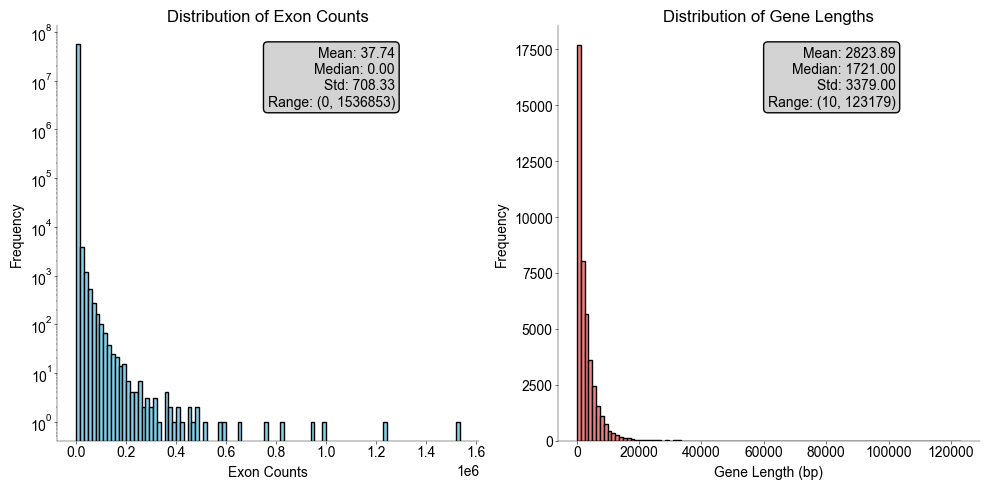

In [ ]:
# Descriptive Statistics for Exon Counts
mean_exon_counts = np.mean(exonCounts)
median_exon_counts = np.median(exonCounts)
std_exon_counts = np.std(exonCounts)
range_exon_counts = (np.min(exonCounts), np.max(exonCounts))

# Descriptive Statistics for Gene Lengths
mean_gene_length = np.mean(exonLengths)
median_gene_length = np.median(exonLengths)
std_gene_length = np.std(exonLengths)
range_gene_length = (np.min(exonLengths), np.max(exonLengths))

# Visualization
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Histogram for Exon Counts
axs[0].hist(
    exonCounts.flatten(),
    bins=100,
    color="skyblue",
    edgecolor="black",
    log=True,
)
axs[0].set_title("Distribution of Exon Counts")
axs[0].set_xlabel("Exon Counts")
axs[0].set_ylabel("Frequency")
axs[0].text(
    0.8,
    0.95,
    f"Mean: {mean_exon_counts:.2f}\nMedian: {median_exon_counts:.2f}\nStd: {std_exon_counts:.2f}\nRange: {range_exon_counts}",
    transform=axs[0].transAxes,
    verticalalignment="top",
    horizontalalignment="right",
    bbox=dict(
        boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey"
    ),
)

# Histogram for Gene Lengths
axs[1].hist(exonLengths, bins=100, color="lightcoral", edgecolor="black")
axs[1].set_title("Distribution of Gene Lengths")
axs[1].set_xlabel("Gene Length (bp)")
axs[1].set_ylabel("Frequency")
axs[1].text(
    0.8,
    0.95,
    f"Mean: {mean_gene_length:.2f}\nMedian: {median_gene_length:.2f}\nStd: {std_gene_length:.2f}\nRange: {range_gene_length}",
    transform=axs[1].transAxes,
    verticalalignment="top",
    horizontalalignment="right",
    bbox=dict(
        boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey"
    ),
)

plt.tight_layout()
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
    <strong>From both plots and stats values we observe:</strong>
    <p><strong>1- Exon Counts Distribution:</strong></p>
    <ul>
        <li>The exon counts are highly skewed.</li>
        <li>Most genes have very low or zero counts, with a few genes showing extremely high counts, indicating that the exon counts are sparse for a large number of genes.</li>
    </ul>
    <p><strong>2- Gene Length Distribution:</strong></p>
    <ul>
        <li>Gene lengths exhibit significant variability and right skeweness (median < mean)</li>
        <li>There is a long tail of very long genes.</li>
    </ul>
<strong>Given these observations, </strong>We conclude that our data appears to not follow normal distribution, contains outliers, and would likely require further preprocessing.  

#### 1.2 Evaluating Sequencing Depth and Gene Expression Distribution of our unnormalized RNA-seq (Transcripts) Count Data

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
Next, we proceed to evaluate the quality and consistency of RNA sequencing. We start with visualizing the distribution of sequencing depths and counts of detected genes using histograms and boxplots, marked key statistics (mean, median, standard deviation), and identify outliers with Z-scores and Modified Z-scores. This approach ensures reliable and accurate data, and helps us chose the appropriate normalization technique <i>(required in the next task)</i> for downstream analyses.</div>

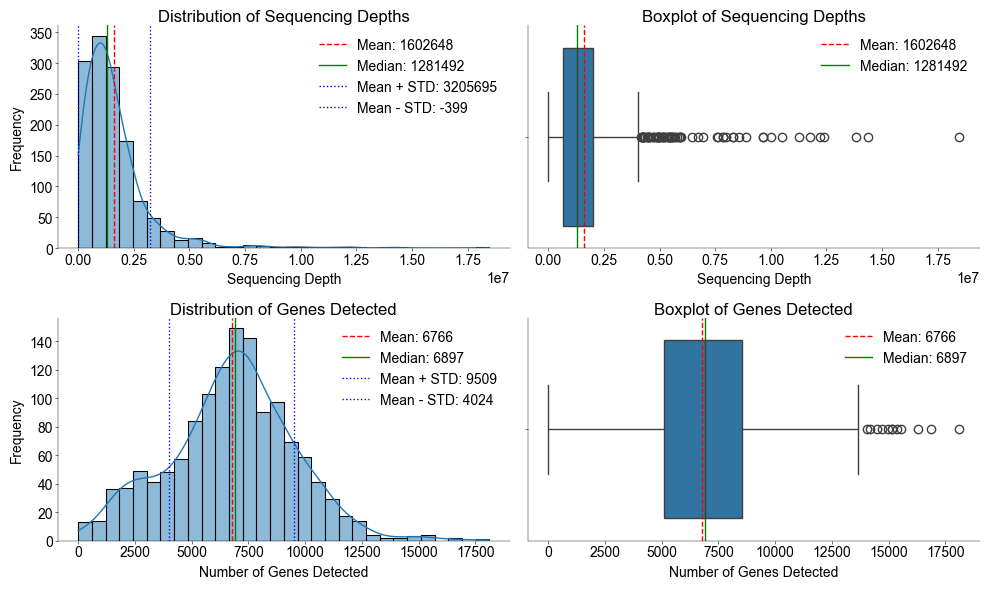

Number of outliers in sequencing depth (Z-score): 23
Number of outliers in sequencing depth (Modified Z-score): 54


In [ ]:
sequencing_depths = exonCounts.sum(axis=1)
genesdetected = np.array(np.sum(exonCounts > 0, axis=1))

# Calculating statistics
mean_depth = np.mean(sequencing_depths)
median_depth = np.median(sequencing_depths)
std_depth = np.std(sequencing_depths)

mean_genes = np.mean(genesdetected)
median_genes = np.median(genesdetected)
std_genes = np.std(genesdetected)

# Plotting histograms and boxplots
fig, axs = plt.subplots(2, 2, figsize=(10, 6))

# Histogram for sequencing_depths
sns.histplot(sequencing_depths, bins=30, kde=True, ax=axs[0, 0])
axs[0, 0].set_title("Distribution of Sequencing Depths")
axs[0, 0].set_xlabel("Sequencing Depth")
axs[0, 0].set_ylabel("Frequency")
# Adding markers
axs[0, 0].axvline(
    mean_depth, color="r", linestyle="--", label=f"Mean: {mean_depth:.0f}"
)
axs[0, 0].axvline(
    median_depth, color="g", linestyle="-", label=f"Median: {median_depth:.0f}"
)
axs[0, 0].axvline(
    mean_depth + std_depth,
    color="b",
    linestyle=":",
    label=f"Mean + STD: {mean_depth + std_depth:.0f}",
)
axs[0, 0].axvline(
    mean_depth - std_depth,
    color="b",
    linestyle=":",
    label=f"Mean - STD: {mean_depth - std_depth:.0f}",
)
axs[0, 0].legend()

# Boxplot for sequencing_depths
sns.boxplot(x=sequencing_depths, ax=axs[0, 1])
axs[0, 1].set_title("Boxplot of Sequencing Depths")
axs[0, 1].set_xlabel("Sequencing Depth")
# Adding markers
axs[0, 1].axvline(
    mean_depth, color="r", linestyle="--", label=f"Mean: {mean_depth:.0f}"
)
axs[0, 1].axvline(
    median_depth, color="g", linestyle="-", label=f"Median: {median_depth:.0f}"
)
axs[0, 1].legend()

# Histogram for genesdetected
sns.histplot(genesdetected, bins=30, kde=True, ax=axs[1, 0])
axs[1, 0].set_title("Distribution of Genes Detected")
axs[1, 0].set_xlabel("Number of Genes Detected")
axs[1, 0].set_ylabel("Frequency")
# Adding markers
axs[1, 0].axvline(
    mean_genes, color="r", linestyle="--", label=f"Mean: {mean_genes:.0f}"
)
axs[1, 0].axvline(
    median_genes, color="g", linestyle="-", label=f"Median: {median_genes:.0f}"
)
axs[1, 0].axvline(
    mean_genes + std_genes,
    color="b",
    linestyle=":",
    label=f"Mean + STD: {mean_genes + std_genes:.0f}",
)
axs[1, 0].axvline(
    mean_genes - std_genes,
    color="b",
    linestyle=":",
    label=f"Mean - STD: {mean_genes - std_genes:.0f}",
)
axs[1, 0].legend()

# Boxplot for genesdetected
sns.boxplot(x=genesdetected, ax=axs[1, 1])
axs[1, 1].set_title("Boxplot of Genes Detected")
axs[1, 1].set_xlabel("Number of Genes Detected")
# Adding markers
axs[1, 1].axvline(
    mean_genes, color="r", linestyle="--", label=f"Mean: {mean_genes:.0f}"
)
axs[1, 1].axvline(
    median_genes, color="g", linestyle="-", label=f"Median: {median_genes:.0f}"
)
axs[1, 1].legend()

plt.tight_layout()
plt.show()

# Z-Score and Modified Z-Score for sequencing depth
z_scores_depth = zscore(sequencing_depths)
outliers_z_depth = np.abs(z_scores_depth) > 3
print(
    "Number of outliers in sequencing depth (Z-score):",
    np.sum(outliers_z_depth),
)

modified_z_scores_depth = (
    0.6745
    * (sequencing_depths - np.median(sequencing_depths))
    / median_abs_deviation(sequencing_depths)
)
outliers_mz_depth = np.abs(modified_z_scores_depth) > 3.5
print(
    "Number of outliers in sequencing depth (Modified Z-score):",
    np.sum(outliers_mz_depth),
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
    <strong>From the above plots we observe that:</strong>
    <ul>
        <li>a low number of counts is associated with a large proportion of genes</li>
        <li>a long right tail is observed probably due to the lack of any upper limit for expression</li>
        <li>large dynamic range is present</li>
    <ul></div><div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
    <strong> We also observe that:</strong><ul> The distribution of genes detected shows a <strong>mean of 6,766</strong> and a <strong>median of 6,897</strong>, indicating that most samples detect a similar number of genes. With mean plus one standard deviation at 9,509 and mean minus one standard deviation at 4,024, the range of detected genes spans a reasonable range, suggesting variability but no extreme outliers.<ul></div><div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
    <strong> We also observe that:</strong><ul>The sequencing depths have a <strong>mean of 1,602,648</strong> and a <strong>median of 1,281,492</strong>, indicating a generally high coverage across samples. The <strong>mean minus one standard deviation (-399) and detected outliers</strong> probably suggest the possible presence of either artifacts, some techinical errors or batch effect in our data. <strong>Importantly,</strong> the RNA-seq count (i.e. the sequencing depth) is not normally distributed, which is mostly the case for all RNA-seq data. Moreover, the underlying data, as is integer counts rather than continuous measurements, which affects the choice of what statistical model to use, which we now leads us to the next step.</strong><ul></div>

#### 1.3 Modeling our unnormalized Count Data

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
To further assess the properties of the Transcriptomics data we are working with, we compute a vector of mean values, then compute a vector of variance values. We then plot these values against each other to evaluate the relationship between them.
</div>

#### 1.3.1 Average and Variance expression for each Gene and Variance-Mean ratio

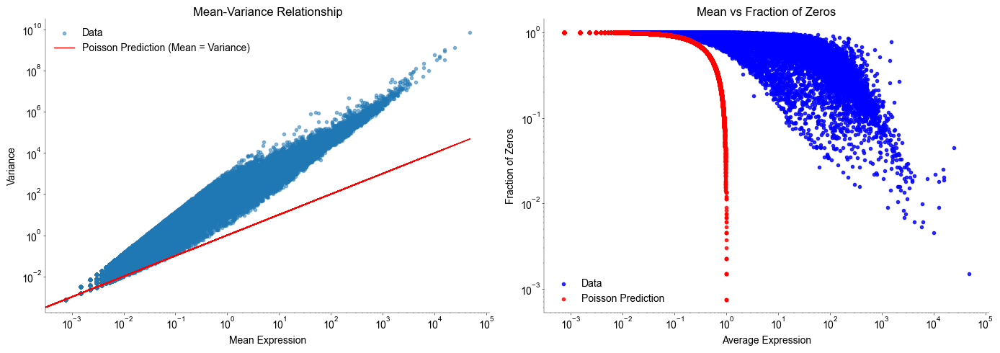

Gene 1: Mean = 0.90, Variance = 30.64, Variance/Mean Ratio = 33.91
Gene 2: Mean = 0.01, Variance = 0.13, Variance/Mean Ratio = 12.13
Gene 3: Mean = 41.82, Variance = 15780.53, Variance/Mean Ratio = 377.33
Gene 4: Mean = 1.86, Variance = 101.73, Variance/Mean Ratio = 54.74
Gene 5: Mean = 4.85, Variance = 622.11, Variance/Mean Ratio = 128.34
Gene 6: Mean = 137.35, Variance = 83495.03, Variance/Mean Ratio = 607.91
Gene 7: Mean = 0.05, Variance = 0.62, Variance/Mean Ratio = 13.58
Gene 8: Mean = 91.10, Variance = 32378.27, Variance/Mean Ratio = 355.40
Gene 9: Mean = 0.03, Variance = 0.28, Variance/Mean Ratio = 8.97
Gene 10: Mean = 24.46, Variance = 9079.02, Variance/Mean Ratio = 371.19


In [ ]:
# Compute mean expression for each gene
average_expression = np.mean(exonCounts, axis=0)

# Compute the variance of the expression counts of each gene
expression_variance = np.var(exonCounts, axis=0)


# Compute the fraction of zeros for each gene
def get_zero_fraction(counts):
    zero_count = np.sum(counts == 0, axis=0)
    zero_fractions = zero_count / counts.shape[0]
    return zero_fractions


zero_fractions = get_zero_fraction(exonCounts)

# Compute the Poisson prediction for zero fractions
expected_zeros = genes.shape[0] - (average_expression * genes.shape[0])
expected_zero_fractions = expected_zeros / genes.shape[0]

# Create a figure with 2 subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

# --------------------------------------------------
# Plot Mean vs Variance
# --------------------------------------------------
axs[0].scatter(
    average_expression, expression_variance, label="Data", alpha=0.5
)
axs[0].plot(
    average_expression,
    average_expression,
    color="red",
    label="Poisson Prediction (Mean = Variance)",
)
axs[0].set_xlabel("Mean Expression")
axs[0].set_ylabel("Variance")
axs[0].set_title("Mean-Variance Relationship")
axs[0].set_xscale("log")
axs[0].set_yscale("log")
axs[0].legend()
axs[0].grid(False)

# --------------------------------------------------
# Plot Mean vs Fraction of Zeros
# --------------------------------------------------
axs[1].scatter(
    average_expression, zero_fractions, color="blue", label="Data", alpha=0.8
)
axs[1].scatter(
    average_expression,
    expected_zero_fractions,
    color="red",
    label="Poisson Prediction",
    alpha=0.8,
)
axs[1].set_xlabel("Average Expression")
axs[1].set_ylabel("Fraction of Zeros")
axs[1].set_title("Mean vs Fraction of Zeros")
axs[1].set_xscale("log")
axs[1].set_yscale("log")
axs[1].legend()
axs[1].grid(False)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

# Compute the ratio of variance to mean for each gene
variance_to_mean_ratio = expression_variance / average_expression

# Print the mean, variance, and the ratio for first 10 genes
for i in range(min(10, len(average_expression))):
    print(
        f"Gene {i+1}: Mean = {average_expression[i]:.2f}, Variance = {expression_variance[i]:.2f}, Variance/Mean Ratio = {variance_to_mean_ratio[i]:.2f}"
    )

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
<strong>From the plots above, We notice that:</strong>
    <ol>
        <li>The mean is not equal (less than) to the variance (the scatter of data points does not fall on the diagonal).</li>
        <li>For the genes with high mean expression, the variance across replicates tends to be greater than the mean (scatter is above the red line).</li>
        <li>For the genes with low mean expression we see quite a bit of scatter and high Lagrange multiplier statistic and f-value <i>(see appendix 1.3.1A for the proof)</i>, referred to as "heteroscedasticity". That is, for a given expression level in the low range we observe a lot of variability in the variance values.</li>
    </ol>
<strong>Therefore, Our Transcriptomic data fails to satisfy the criteria for Poisson distribution, and the Negative Binomial is a good approximation for our data where the mean < variance which we visualize by fitting both the Standard and the Harris 2018 Negative Binomial distribution to our data <i>(See plots below)</i>. </strong>
</div>

#### 1.3.2 Fitting a Standard and Harris et al 2018 Negative Binomial Models to our Data

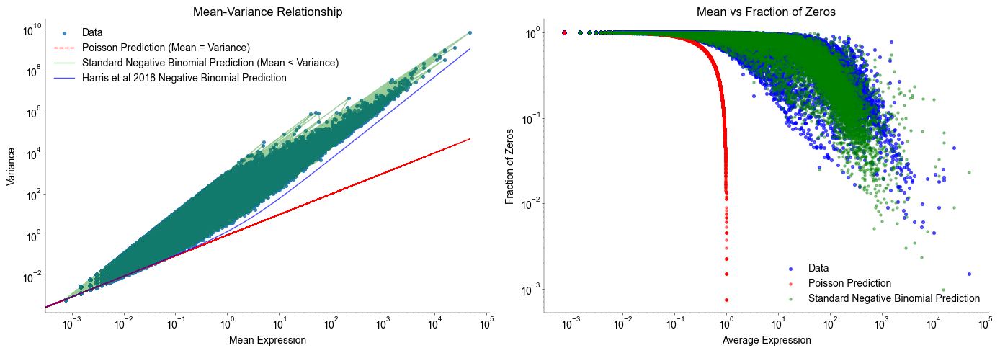

In [ ]:
# For each gene, fit a Negative Binomial distribution to its data
def fit_negative_binomial(mean_expression, variance_expression):
    # The variance of the Negative Binomial distribution is mean + mean^2 / k
    # We can estimate k from variance and mean as follows:
    k = (mean_expression**2) / (variance_expression - mean_expression)
    return k


# Compute k for each gene
k_values = [
    fit_negative_binomial(mean, var)
    for mean, var in zip(average_expression, expression_variance)
]


# Compute the expected variance and zero fraction for Negative Binomial
def negative_binomial_predictions(mean_expression, k):
    variance_nb = mean_expression + (mean_expression**2) / k
    zero_fraction_nb = nbinom.pmf(0, k, k / (k + mean_expression))
    return variance_nb, zero_fraction_nb


# Compute the variance using the Harris (2018) method
def harris_variance(mean_expression):
    return mean_expression**2 / 2 + mean_expression


predicted_variances_nb = []
predicted_variances_harris = []
predicted_zero_fractions = []

for mean, k in zip(average_expression, k_values):
    variance_nb, zero_fraction_nb = negative_binomial_predictions(mean, k)
    variance_harris = harris_variance(mean)
    predicted_variances_nb.append(variance_nb)
    predicted_variances_harris.append(variance_harris)
    predicted_zero_fractions.append(zero_fraction_nb)

predicted_variances_nb = np.array(predicted_variances_nb)
predicted_variances_harris = np.array(predicted_variances_harris)
predicted_zero_fractions = np.array(predicted_zero_fractions)

# Sort values for smoother plotting
sorted_indices = np.argsort(average_expression)
sorted_average_expression = average_expression[sorted_indices]
sorted_predicted_variances_harris = predicted_variances_harris[sorted_indices]

# Create a figure with 2 subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

# -------------------------
# Plot Mean vs Variance
# -------------------------
axs[0].scatter(
    average_expression, expression_variance, label="Data", alpha=0.8, s=30
)
axs[0].plot(
    average_expression,
    average_expression,
    color="red",
    label="Poisson Prediction (Mean = Variance)",
    linestyle="--",
)
axs[0].plot(
    average_expression,
    predicted_variances_nb,
    color="green",
    label="Standard Negative Binomial Prediction (Mean < Variance)",
    linestyle="-",
    alpha=0.4,
)
axs[0].plot(
    sorted_average_expression,
    sorted_predicted_variances_harris,
    color="blue",
    label="Harris et al 2018 Negative Binomial Prediction",
    linestyle="-",
    alpha=0.7,
)

axs[0].set_xlabel("Mean Expression")
axs[0].set_ylabel("Variance")
axs[0].set_title("Mean-Variance Relationship")
axs[0].set_xscale("log")
axs[0].set_yscale("log")
axs[0].legend()
axs[0].grid(False)

# -----------------------------------
# Plot Mean vs Fraction of Zeros
# -----------------------------------
axs[1].scatter(
    average_expression,
    zero_fractions,
    color="blue",
    label="Data",
    alpha=0.6,
    s=30,
)
axs[1].scatter(
    average_expression,
    expected_zero_fractions,
    color="red",
    label="Poisson Prediction",
    alpha=0.5,
    s=20,
)
axs[1].scatter(
    average_expression,
    predicted_zero_fractions,
    color="green",
    label="Standard Negative Binomial Prediction",
    alpha=0.4,
    s=20,
)
axs[1].set_xlabel("Average Expression")
axs[1].set_ylabel("Fraction of Zeros")
axs[1].set_title("Mean vs Fraction of Zeros")
axs[1].set_xscale("log")
axs[1].set_yscale("log")
axs[1].legend()
axs[1].grid(False)

plt.tight_layout()
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Inspecting the plots above, we confirm that our read count data follow a Negative Binomial Distribution.</div>

### 2. Electrophysiological Data

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Now, that we explored the properties of out Trabscriptomic Data. We now explore the properties of the Electrophysiological recordings of the RNA-sequenced cells.</div>

#### 2.1 Exploring the Characteristics of the standardized Ephy Recordings

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
<strong>To gain a comprehensive understanding of electrophysiological recordings,</strong> we analyzed the distribution and skewness of our ephys data. This approach allows us to understand the physiological diversity of the recorded cells and indicate whether the cells are mostly homogeneous or if there are distinct subpopulations with different physiological properties.This way we reveal critical insights into their functional properties and variability.</div>

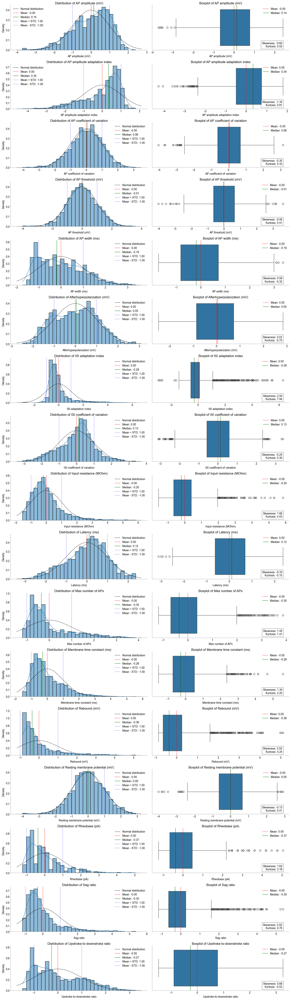

In [ ]:
def plot_distributions_and_boxplots(data, feature_names):
    num_features = len(feature_names)
    fig, axs = plt.subplots(num_features, 2, figsize=(15, num_features * 3))

    for i, feature in enumerate(feature_names):
        feature_data = data[:, i]

        # Calculate statistics
        mean_val = np.mean(feature_data)
        std_val = np.std(feature_data)
        median_val = np.median(feature_data)
        skew_val = skew(feature_data)
        kurtosis_val = kurtosis(feature_data)

        # Plot histogram with KDE
        sns.histplot(
            feature_data,
            bins=30,
            kde=True,
            ax=axs[i, 0],
            stat="density",
            edgecolor="black",
            # color="skyblue",
        )

        # Plot normal distribution
        xmin, xmax = axs[i, 0].get_xlim()
        x = np.linspace(xmin, xmax, 100)
        p = norm.pdf(x, mean_val, std_val)
        axs[i, 0].plot(x, p, "k--", label="Normal distribution")

        axs[i, 0].set_title(f"Distribution of {feature}")
        axs[i, 0].set_xlabel(feature)
        axs[i, 0].set_ylabel("Density")

        # Adding markers to histogram
        axs[i, 0].axvline(
            mean_val, color="r", linestyle="--", label=f"Mean: {mean_val:.2f}"
        )
        axs[i, 0].axvline(
            median_val,
            color="g",
            linestyle="-",
            label=f"Median: {median_val:.2f}",
        )
        axs[i, 0].axvline(
            mean_val + std_val,
            color="b",
            linestyle=":",
            label=f"Mean + STD: {mean_val + std_val:.2f}",
        )
        axs[i, 0].axvline(
            mean_val - std_val,
            color="b",
            linestyle=":",
            label=f"Mean - STD: {mean_val - std_val:.2f}",
        )
        axs[i, 0].legend()

        # Plot boxplot
        sns.boxplot(x=feature_data, ax=axs[i, 1])
        axs[i, 1].set_title(f"Boxplot of {feature}")
        axs[i, 1].set_xlabel(feature)

        # Adding markers to boxplot
        axs[i, 1].axvline(
            mean_val, color="r", linestyle="--", label=f"Mean: {mean_val:.2f}"
        )
        axs[i, 1].axvline(
            median_val,
            color="g",
            linestyle="-",
            label=f"Median: {median_val:.2f}",
        )
        axs[i, 1].legend()

        # Adding skewness and kurtosis annotations to boxplot
        axs[i, 1].text(
            0.95,
            0.05,
            f"Skewness: {skew_val:.2f}\nKurtosis: {kurtosis_val:.2f}",
            verticalalignment="bottom",
            horizontalalignment="right",
            transform=axs[i, 1].transAxes,
            fontsize=10,
            bbox=dict(facecolor="white", alpha=0.5),
        )

    plt.tight_layout()
    plt.show()


plot_distributions_and_boxplots(ephysData_filtered, filtered_ephysNames)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
<strong>By careful inspection of the plotted histograms and box plots</strong>, we observe that features such as <strong>AP amplitude</strong> and <strong>Resting membrane potential</strong> exhibit near-normal distributions with slight skewness, indicating relatively uniform physiological properties among cells suggesting that the majority of the recorded cells have robust action potential generation. In contrast, <strong>ISI adaptation index</strong>, <strong>Rebound (mV)</strong>, and <strong>Sag ratio</strong> show high right-skewness and leptokurtic distributions (i.e. Positive Kurtosis), suggesting significant variability and the presence of outliers, which is evident in the corresponding boxplot and might reflect diverse cell types or distinct physiological states. Features like <strong>Input resistance</strong>, <strong>Rheobase</strong>, and <strong>Membrane time constant</strong> also display moderate right-skewness and leptokurtic tendencies, highlighting heterogeneity in cell excitability and passive properties.
</div>

#### 2.3 Correlation between Electrophysiological Features of Sequenced cells

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">We also sought to explore the correlation between those different features which can also help in identifying different cell types or subpopulations within your dataset. For example, cells with similar action potential characteristics might belong to the same cell type. Correlation can also help us understanding how changes in one physiological property might affect others.</div>

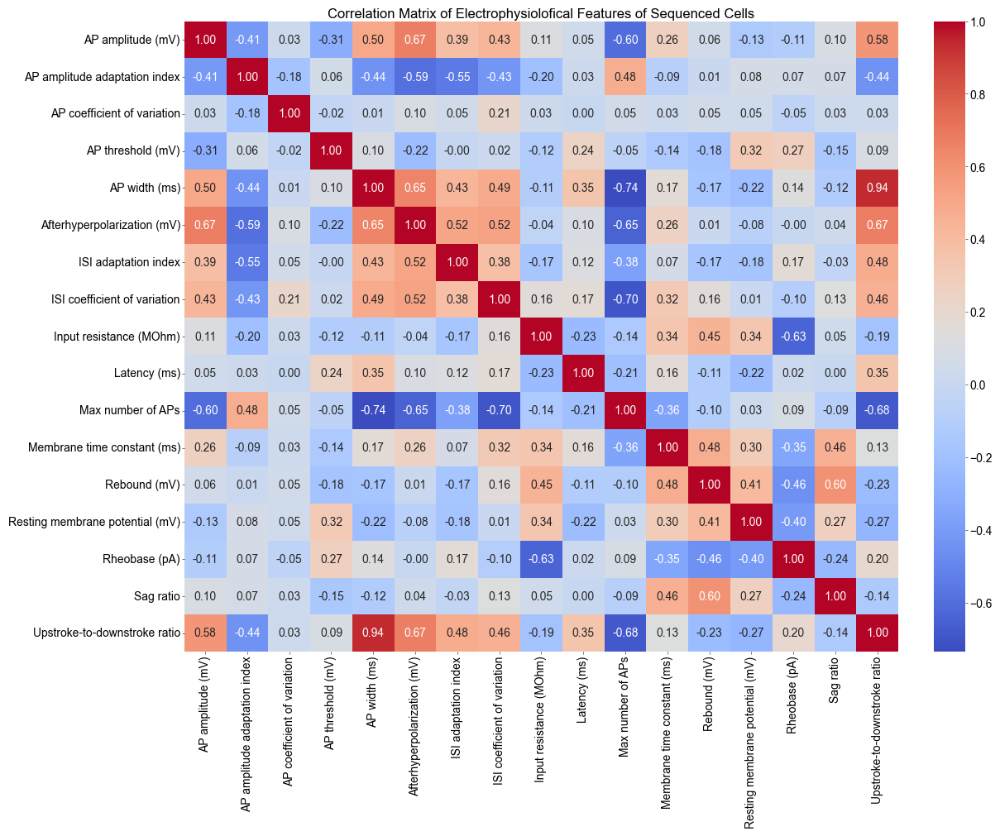

In [ ]:
def plot_correlation_matrix(data, feature_names):
    correlation_matrix = pd.DataFrame(data, columns=feature_names).corr()
    plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title(
        "Correlation Matrix of Electrophysiolofical Features of Sequenced Cells"
    )
    plt.show()


plot_correlation_matrix(ephysData_filtered, filtered_ephysNames)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;"><strong>From the Heatmap we observe that:</strong> AP width and the upstroke-to-downstroke ratio are strongly positively correlated (r = 0.94), indicating that wider APs are associated with higher ratios. Rebound potential and sag ratio also show a strong positive correlation (r = 0.60). Conversely, the max number of APs is strongly negatively correlated with both AP width (r = -0.74) and ISI coefficient of variation (r = -0.70), suggesting that larger AP widths and greater ISI variability are associated with fewer action potentials. Other correlations, such as the moderate positive relationship between membrane time constant and sag ratio (r = 0.46), shows that certain features may be interconnected.</div>

## Task 2: Data Normalization and Transformation

### 2.1 Normalization

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
<strong>Given our Transcriptomic data exploration and statistical analysis in Task 1, </strong>which indicated slight variability in sequencing depths across samples and detected outliers, we have chosen to use <strong>Trimmed Mean of M-values (TMM) normalization</strong>. TMM normalization is specifically designed to account for differences in library sizes and is robust against outliers and variations in sequencing depth because it trims off the most highly variable genes. We applied TMM normalization using the edgeR package in R and then imported the saved normalized counts into our Jupyter Notebook for subsequent analysis.

<strong>Note:</strong> Although the Python-based package "conorm" also performs TMM normalization, we found its implementation to be less accurate compared to the edgeR package, as corroborated by the conorm documentation and our own observations.
</div>

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
Nonetheless, we decided to perform the simple CPM normalization and the more appropriate TMM normalization method and compare between both before we proceed forward to clustering.</div>

<p style="background-color: #FFFF99; padding: 10px; border-radius: 5px;"><strong>R code used to perform TMM normalization on the Transcriptomics data "m1_patchseq_exon_counts.csv.gz" can be found at my Github repository using this direct link</strong> <a href="https://github.com/DrMohamedElsherif/Neural-Data-Science-2024/blob/main/TMM_Normalization.R">TMM Normalization</a>.<strong>  In short, TMM works by normalizing the library sizes to produce effective library sizes (i.e. Normalization factors), then cpm is applied to produce counts normalized by the effective library sizes to yield TMM normalized counts.Running the R code will reproduce the TMM normalization and save the TMM-normalized counts as a csv file named "normalized_counts.csv". We already handed in the "normalized_counts.csv" with our assignment in ILIAS so you do not need to run the R code yourself to obtain the .csv file.</strong></p>

#### 2.1.1 Normalize counts by Trimmed Mean of M-values (TMM) normalization

In [ ]:
# Perform TMM normalization using "conorm" Python package
# df_tmm = conorm.tmm(data_exons)    ## Only for display and compare and not to use.

# Load normalized count matrix generated from the TMM "edgeR" R package then transpose it
TMM_counts = pd.read_csv(f"{data_path}/normalized_counts.csv", index_col=0)
TMM_counts = TMM_counts.values.transpose()

#### 2.1.2 Normalize counts by CPM for later comparison

In [ ]:
# Normalization (CPM)
total_counts = exonCounts.sum(axis=1, keepdims=True)
CPM_counts = (exonCounts / total_counts) * 1e6

#### 2.1.3 Mean and Variance of the Expression for the Normalized Counts

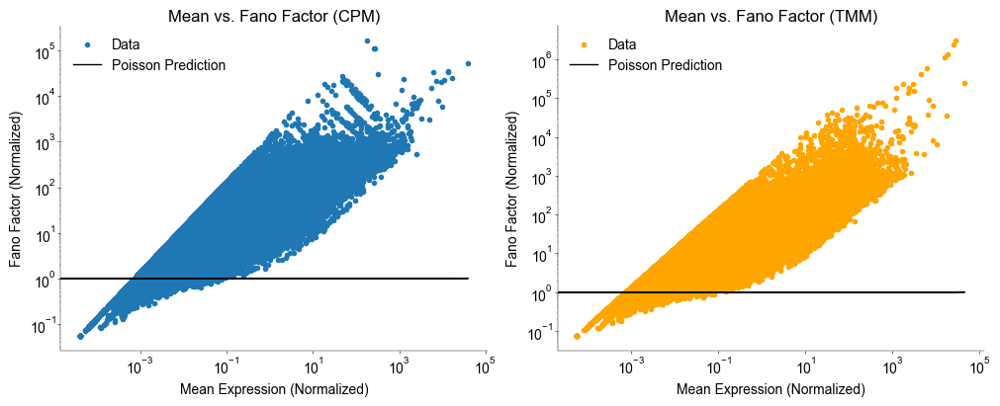

In [ ]:
def calculate_mean_variance_fano(normalized_counts):
    # Compute the mean and variance of the expression counts for each gene
    average_expression = np.mean(normalized_counts, axis=0)
    variance = np.var(normalized_counts, axis=0)

    # Compute the Fano factor for each gene
    fano_factor = variance / average_expression
    return (average_expression, variance, fano_factor)


def mean_and_fano_plotter(
    average_expression1,
    fano_factor1,
    title1,
    average_expression2,
    fano_factor2,
    title2,
    figsize=(10, 4),
):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    # Plot the first subplot
    ax1.scatter(average_expression1, fano_factor1, label="Data")
    ax1.plot(
        average_expression1,
        np.ones_like(average_expression1),
        c="k",
        label="Poisson Prediction",
    )
    ax1.set_xscale("log")
    ax1.set_yscale("log")
    ax1.set_xlabel("Mean Expression (Normalized)")
    ax1.set_ylabel("Fano Factor (Normalized)")
    ax1.set_title(title1)
    ax1.legend()

    # Plot the second subplot
    ax2.scatter(
        average_expression2, fano_factor2, color="orange", label="Data"
    )
    ax2.plot(
        average_expression2,
        np.ones_like(average_expression2),
        c="k",
        label="Poisson Prediction",
    )
    ax2.set_xscale("log")
    ax2.set_yscale("log")
    ax2.set_xlabel("Mean Expression (Normalized)")
    ax2.set_ylabel("Fano Factor (Normalized)")
    ax2.set_title(title2)
    ax2.legend()

    plt.show()


# Usage with CPM normalized counts
average_expression_cpm, _, CPM_fano = calculate_mean_variance_fano(CPM_counts)
# Usage with TMM normalized counts
average_expression_tmm, _, TMM_fano = calculate_mean_variance_fano(TMM_counts)
mean_and_fano_plotter(
    average_expression_cpm,
    CPM_fano,
    "Mean vs. Fano Factor (CPM)",
    average_expression_tmm,
    TMM_fano,
    "Mean vs. Fano Factor (TMM)",
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
Applying both CPM (Counts Per Million) and TMM (Trimmed Mean of M-values) normalization methods to our data revealed just subtle visual differences between the resulting plots. At first glance, this suggests that both normalization methods have a almost similar impact on the overall data distribution. However, it was crucial to us to examine whether this subtle difference between both normalization approaches could still introduce significant variations in our data, which might affect our downstream analyses in next tasks. Therefore we plotted the top 10 genes with highest fano factor normalized by CPM and TMM, and additional top genes with highest fano factor normalized by CPM and TMM sorted by the cortical layers. </div>


#### 2.1.4 Top-10 genes with the Highest CPM and TMM Normalized Fano Factors

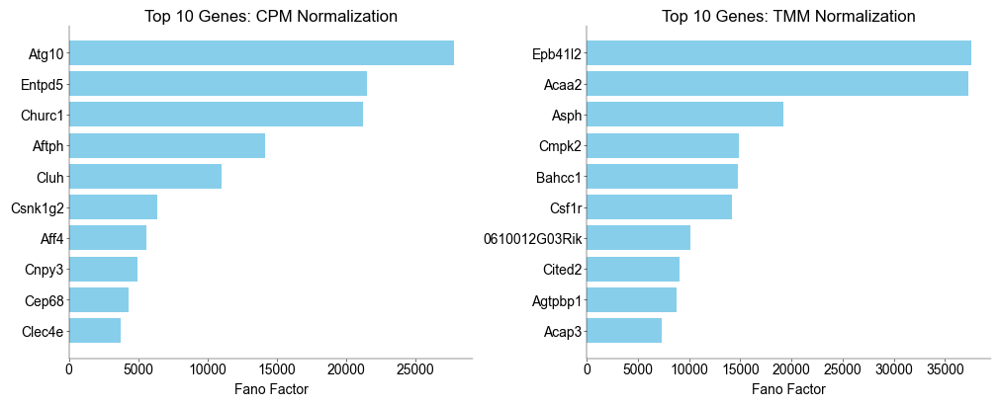

In [ ]:
def plot_top_genes_fano(genes, fano_factors, title, ax):
    # Create a dictionary of gene names and Fano factors
    gene_fano_dict = dict(zip(genes, fano_factors))

    # Sort the genes based on their Fano factors (descending order)
    sorted_genes = sorted(
        gene_fano_dict.items(), key=lambda x: x[1], reverse=True
    )

    # Get the top 10 genes and their Fano factors
    top_genes = sorted_genes[:10]
    gene_names, top_fano_factors = zip(*top_genes)

    # Plot the top 10 genes
    ax.barh(gene_names, top_fano_factors, color="skyblue")
    ax.set_xlabel("Fano Factor")
    ax.set_title(title)
    ax.invert_yaxis()  # Invert y-axis to show the highest Fano factor on top


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

plot_top_genes_fano(genes, CPM_fano, "Top 10 Genes: CPM Normalization", ax1)
plot_top_genes_fano(genes, TMM_fano, "Top 10 Genes: TMM Normalization", ax2)
# plt.tight_layout()
plt.show()

#### 2.1.5 Top 5-10 genes with the Highest CPM and TMM  Normalized Fano Factor in each Cortical Layer

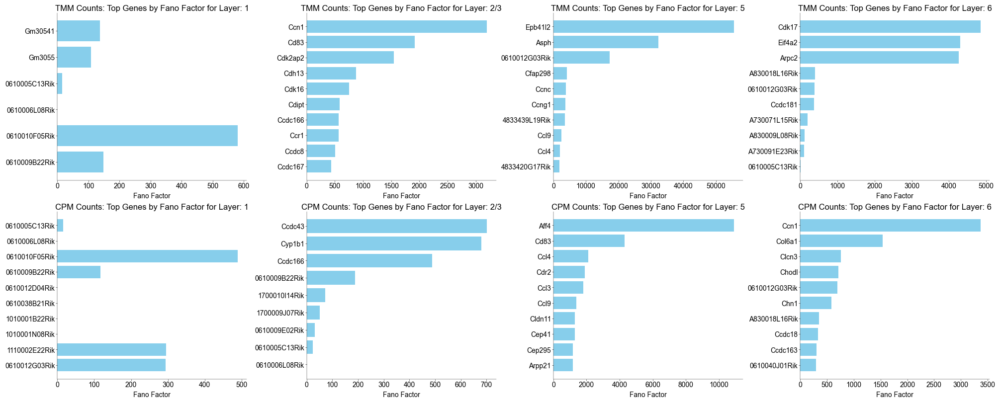

In [ ]:
# Function to calculate Fano factors
def calculate_layer_fano_factors(expression_df, layer):
    layer_data = expression_df[expression_df["layer"] == layer]
    pivoted = (
        layer_data.pivot_table(
            index="cell", columns="gene", values="expression", aggfunc="mean"
        )
        .fillna(0)
        .values
    )
    _, _, fano_factors = calculate_mean_variance_fano(pivoted)
    return fano_factors


# Create DataFrames for expression data
expression_df_TMM = pd.DataFrame(TMM_counts, index=cells, columns=genes)
expression_df_CPM = pd.DataFrame(CPM_counts, index=cells, columns=genes)

# Filter the expression DataFrames to keep only the cells in keepcells
expression_df_TMM = expression_df_TMM.loc[keepcells]
expression_df_CPM = expression_df_CPM.loc[keepcells]

# Add metadata for layers
metadata_df = pd.DataFrame({"cell": cells, "layer": layers})

# Melt and merge the expression DataFrames with metadata
expression_df_TMM = expression_df_TMM.reset_index().melt(
    id_vars="index", var_name="gene", value_name="expression"
)
expression_df_TMM = expression_df_TMM.rename(columns={"index": "cell"})
expression_df_TMM = expression_df_TMM.merge(metadata_df, on="cell")

expression_df_CPM = expression_df_CPM.reset_index().melt(
    id_vars="index", var_name="gene", value_name="expression"
)
expression_df_CPM = expression_df_CPM.rename(columns={"index": "cell"})
expression_df_CPM = expression_df_CPM.merge(metadata_df, on="cell")

# Create subplots for both TMM and CPM counts
fig, axes = plt.subplots(
    nrows=2, ncols=len(unique_layers), figsize=(20, 8), sharey=False
)

# Plot Fano factors for each layer using TMM_counts
for ax, layer in zip(axes[0], unique_layers):
    layer_fano_factors = calculate_layer_fano_factors(expression_df_TMM, layer)
    plot_top_genes_fano(
        genes,
        layer_fano_factors,
        f"TMM Counts: Top Genes by Fano Factor for Layer: {layer}",
        ax,
    )

# Plot Fano factors for each layer using CPM_counts
for ax, layer in zip(axes[1], unique_layers):
    layer_fano_factors = calculate_layer_fano_factors(expression_df_CPM, layer)
    plot_top_genes_fano(
        genes,
        layer_fano_factors,
        f"CPM Counts: Top Genes by Fano Factor for Layer: {layer}",
        ax,
    )

# plt.tight_layout()
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
<strong>From above plots in 2.1.4 and 2.1.5, We notice here that Top genes by Fano factor are different between the CPM and TMM normalization methods!</strong> This may partly explain the previously observed subtle difference in the Fano factor plots between both normalization methods. We believe that this difference likely arise from their distinct approaches to normalization. <strong>CPM normalization</strong> may not adequately account for variations in sequencing depth, which can skew Fano factor calculations, especially given that our read counts follow a negative binomial distribution indicative of overdispersion. This overdispersion leading to skewed Fano factors results in different gene rankings. In contrast, <strong>TMM normalization</strong> adjusts for compositional biases and library size more effectivel, that is it corrects for sequencing depth, providing a more robust correction for sequencing depth variations and outliers that we observed above in Task 1 in our sequencing depths. Consequently, TMM offers a more stable and accurate representation of gene expression and Fano factors, leading to a different set of top-ranking genes compared to CPM.

<p style="background-color: #FFFF99; padding: 10px; border-radius: 5px;"><strong>Given this observation,</strong> we are now more confident to continue our analysis using TMM as the most robust normalization method for our data and based on this we can now proceed forward with second half of Task 2: the Transformation and visualization.</p></div>

### 2.2 Transformations and visualization

#### 2.2.1 Transicptomics Data Transformation and visulization (PCA with and without Transformation)

genes left: 2710 out of 42466
ratio: 0.064


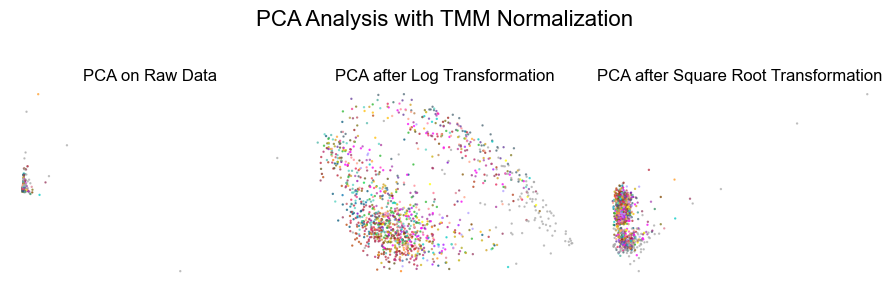

In [ ]:
def get_PCA_clusters(
    counts, fano, n_PCs=50, threshold=1e3, filtered=False, main_title=""
):
    top_genes_indices = np.where(fano > threshold)
    top_genes = counts[:, top_genes_indices].reshape(counts.shape[0], -1)
    print(
        f"genes left: {top_genes.shape[1]} out of {counts.shape[1]}\nratio: {np.round(top_genes.shape[1]/counts.shape[1], 3)}"
    )

    # Perform PCA on raw data, log-transformed data, and square root-transformed data
    pca = PCA(n_components=n_PCs)
    pc = pca.fit_transform(top_genes)

    data_log = np.log2(top_genes + 1)
    pca_log = PCA(n_components=n_PCs)
    pc_log = pca_log.fit_transform(data_log)

    data_sqrt = np.sqrt(top_genes)
    pca_sqrt = PCA(n_components=n_PCs)
    pc_sqrt = pca_sqrt.fit_transform(data_sqrt)

    fig, axs = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle(main_title, fontsize=16)  # Add main title

    # Plot first 2 PCs for the original dataset
    if not filtered:
        axs[0].scatter(pc[:, 0], pc[:, 1], c=cluster_colors, alpha=0.7, s=2)
        axs[0].set_title("PCA on Raw Data")
        axs[0].axis("off")

        # Plot first 2 PCs for the log-transformed dataset
        axs[1].scatter(
            pc_log[:, 0], pc_log[:, 1], c=cluster_colors, alpha=0.7, s=2
        )
        axs[1].set_title("PCA after Log Transformation")
        axs[1].axis("off")

        # Plot first 2 PCs for the square root-transformed dataset
        axs[2].scatter(
            pc_sqrt[:, 0], pc_sqrt[:, 1], c=cluster_colors, alpha=0.7, s=2
        )
        axs[2].set_title("PCA after Square Root Transformation")
        axs[2].axis("off")
    else:
        if "keepcells" not in locals():
            raise ValueError(
                "The variable 'keepcells' is not defined for filtered plots."
            )

        axs[0].scatter(
            pc[:, 0], pc[:, 1], c=cluster_colors[keepcells], alpha=0.7, s=2
        )
        axs[0].set_title("PCA on Raw Data")
        axs[0].axis("off")

        axs[1].scatter(
            pc_log[:, 0],
            pc_log[:, 1],
            c=cluster_colors[keepcells],
            alpha=0.7,
            s=2,
        )
        axs[1].set_title("PCA after Log Transformation")
        axs[1].axis("off")

        axs[2].scatter(
            pc_sqrt[:, 0],
            pc_sqrt[:, 1],
            c=cluster_colors[keepcells],
            alpha=0.7,
            s=2,
        )
        axs[2].set_title("PCA after Square Root Transformation")
        axs[2].axis("off")

    # Set common labels
    for ax in axs:
        ax.set_xlabel("PC1")
        ax.set_ylabel("PC2")

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    return pc_log


# Call the function with the appropriate titles for CPM and TMM
PC_TMM_log = get_PCA_clusters(
    TMM_counts,
    TMM_fano,  #### -----------------------------------------------------------------------------------------------------------------------
    threshold=400,  #### NOTE: Please see Appendix 2.2.1A at the bottom of this Notebook that explains why and how we chose 400 as our threshold ###
    #### -----------------------------------------------------------------------------------------------------------------------
    main_title="PCA Analysis with TMM Normalization",
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Examination of the PCA plots reveals that raw data PCA tends to be dense and obscures potential clustering patterns due to high variance and the presence of outliers. In contrast, log transformation significantly improves the distances/clustering for visualization probably by stabilizing variance and mitigating the influence of extreme values. Although square root transformation also enhances cluster visibility and pattern detection, it is generally less effective than log transformation in addressing skewed data. Therefore, to determine the most appropriate transformation to use, we compared PCA plots of TMM normalization with those of CPM normalization. This comparative analysis will guide our decision on the robust transformation method for our data that is robust and consistent.</div>

genes left: 1864 out of 42466
ratio: 0.044


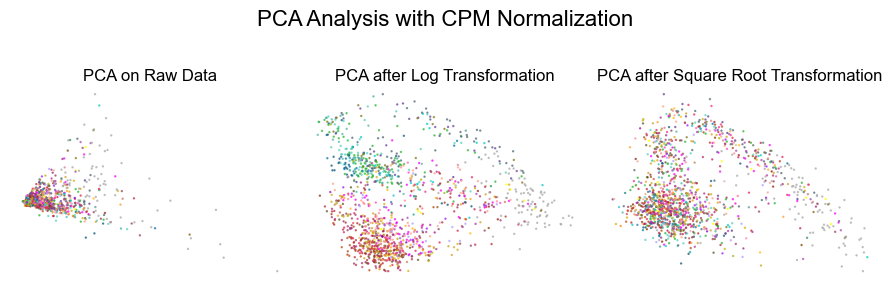

In [ ]:
PC_CPM_log = get_PCA_clusters(
    CPM_counts,
    CPM_fano,
    threshold=400,  ## please see Appendix 2.1A for how we decided on how and why we chose 400 as our threshold.
    main_title="PCA Analysis with CPM Normalization",
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Comparing both plots, we see that log transformation plots are most similar between CPM and TMM normalization methods, making them the most reliable robust choice for our subsequent visualization and clustering analysis. Therefore, <p style="background-color: #FFFF99; padding: 10px; border-radius: 5px;"><strong>Given this observation</strong>, we decided to utilize log-tranformation of our TMM-normalized data for our subsequent visualization and clustering.</p></div>

## Task 3: 2-D Visulatization

### 3.1 Trascriptomics Data t-SNE and UMAP

Genes left: 2710 out of 42466
Ratio: 0.064


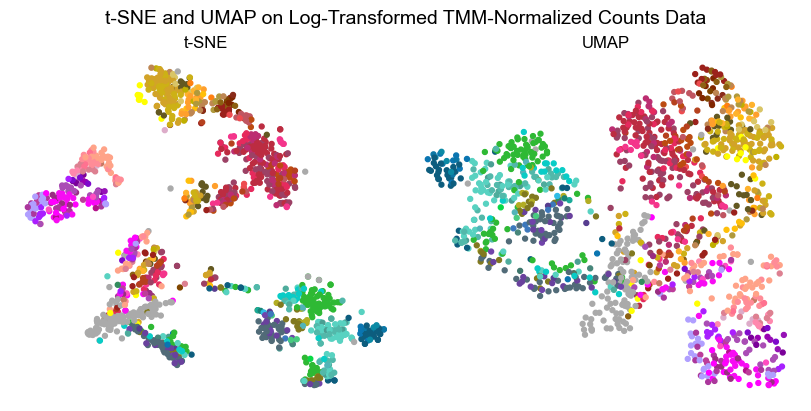

In [ ]:
def get_log_transform(counts, fano, threshold=1e3, main_title=""):
    # Identify indices of top genes based on the Fano factor threshold
    top_genes_indices = np.where(fano > threshold)
    # Extract data for top genes
    top_genes = counts[:, top_genes_indices].reshape(counts.shape[0], -1)
    # Print the number of genes left after filtering
    print(
        f"Genes left: {top_genes.shape[1]} out of {counts.shape[1]}\n"
        f"Ratio: {np.round(top_genes.shape[1] / counts.shape[1], 3)}"
    )
    # Perform log transformation
    log_transformed_data = np.log2(top_genes + 1)
    return log_transformed_data


def tsne_umap_visualization(
    adata,
    cluster_colors,
    title,
    n_pca_components=50,
    tsne_perplexity=30,
    tsne_exaggeration=12,
    umap_neighbors=15,
    umap_min_dist=1.0,
):
    # Perform PCA to reduce the data to n_pca_components dimensions
    sc.tl.pca(adata, n_comps=n_pca_components)

    # Perform t-SNE using Scanpy on the PCA-reduced data
    sc.tl.tsne(
        adata,
        perplexity=tsne_perplexity,  # The default Nr of iterations for t-SNE in Scanpy (which uses the openTSNE implementation) is typically 1000.
        early_exaggeration=tsne_exaggeration,
        use_rep="X_pca",
    )
    tsne_results = adata.obsm["X_tsne"]

    # Perform UMAP using Scanpy on the PCA-reduced data
    sc.pp.neighbors(adata, n_neighbors=umap_neighbors, use_rep="X_pca")
    sc.tl.umap(adata, min_dist=umap_min_dist)
    umap_results = adata.obsm["X_umap"]

    # Create subplots
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))

    # Set the main title for the figure
    fig.suptitle(title, fontsize=14)

    # t-SNE plot
    scatter1 = axs[0].scatter(
        tsne_results[:, 0],
        tsne_results[:, 1],
        c=cluster_colors,
        s=50,
        cmap="viridis",
    )
    axs[0].set_title("t-SNE")
    axs[0].axis("off")

    # UMAP plot
    scatter2 = axs[1].scatter(
        umap_results[:, 0],
        umap_results[:, 1],
        c=cluster_colors,
        s=50,
        cmap="viridis",
    )
    axs[1].set_title("UMAP")
    axs[1].axis("off")
    plt.show()


##############
TMM_log = get_log_transform(TMM_counts, TMM_fano, threshold=400)

np.random.seed(42)
# Create an AnnData object from your log-transformed data
adata = sc.AnnData(TMM_log)

# Ensure cluster_colors is a categorical array and matches the shape of adata.obs
adata.obs["clusters"] = cluster_colors

# Perform the visualization
tsne_umap_visualization(
    adata,  # AnnData object
    adata.obs["clusters"],
    "t-SNE and UMAP on Log-Transformed TMM-Normalized Counts Data",
    n_pca_components=50,  # Number of PCA components
    tsne_perplexity=30,
    tsne_exaggeration=12,
    umap_neighbors=15,
    umap_min_dist=1.0,
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
    Upon plotting and comparing both t-SNE and UMAP visualizations, using commonly adopted starting values for perplexity (30) and n_neighbors (15), we observe that t-SNE clusters are more condensed and distinctly separated, whereas UMAP clusters are more dispersed, less condensed, and exhibit less distinctive separation between clusters.
</div>

#### 3.1.1 t-SNE plots to visualize RNA types clusters using different perplexities and exaggeration

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Given this observation, we then sought to investigate the impact of various combinations of perplexity and exaggeration values for tsne plots. We selected the most commonly used values in practice, as shown in the corresponding plots below.</div>

Genes left: 2710 out of 42466
Ratio: 0.064


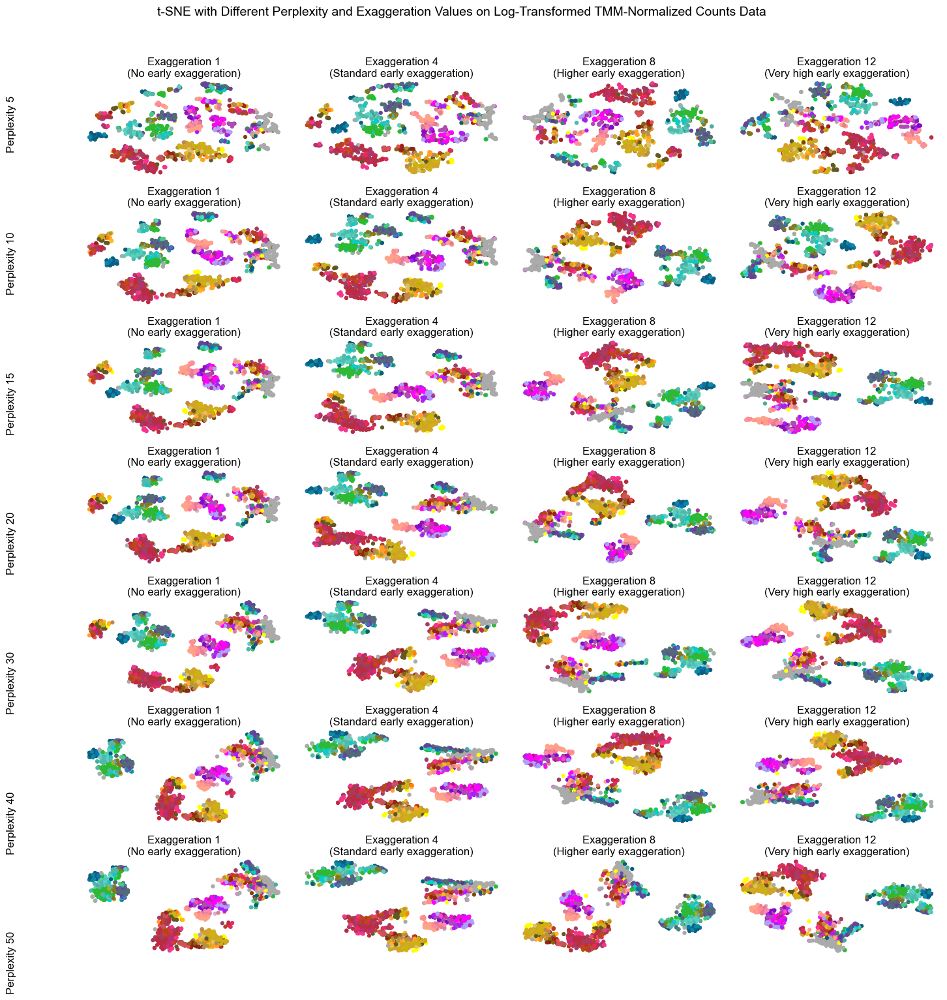

In [ ]:
def get_log_transform(counts, fano, threshold=1e3, main_title=""):
    # Identify indices of top genes based on the Fano factor threshold
    top_genes_indices = np.where(fano > threshold)
    # Extract data for top genes
    top_genes = counts[:, top_genes_indices].reshape(counts.shape[0], -1)
    # Print the number of genes left after filtering
    print(
        f"Genes left: {top_genes.shape[1]} out of {counts.shape[1]}\n"
        f"Ratio: {np.round(top_genes.shape[1] / counts.shape[1], 3)}"
    )
    # Perform log transformation
    log_transformed_data = np.log2(top_genes + 1)
    return log_transformed_data


# Function for t-SNE visualization
def tsne_visualization(
    adata,
    cluster_colors,
    perplexities,
    exaggerations,
    exagg_legend,
    n_pca_components=50,
    title="",
):
    tsne_dict = {}

    # Perform PCA to reduce the data to n_pca_components dimensions
    sc.tl.pca(adata, n_comps=n_pca_components)

    # Create subplots for t-SNE visualizations
    fig, axs = plt.subplots(
        len(perplexities), len(exaggerations), figsize=(15, 15)
    )

    for i, perplexity in enumerate(perplexities):
        # Set the vertical subtitle for each row on the left side
        fig.text(
            0.04,
            0.86 - i * (1 / len(perplexities)),
            f"Perplexity {perplexity}",
            ha="center",
            va="center",
            rotation="vertical",
            fontsize=12,
        )

        for j, exaggeration in enumerate(exaggerations):
            # Perform t-SNE using Scanpy on the PCA-reduced data
            sc.tl.tsne(
                adata,
                perplexity=perplexity,
                early_exaggeration=exaggeration,
                use_rep="X_pca",
            )
            tsne_results = adata.obsm["X_tsne"]
            tsne_dict[f"{perplexity},{exaggeration}"] = tsne_results

            # t-SNE plot
            scatter = axs[i, j].scatter(
                tsne_results[:, 0],
                tsne_results[:, 1],
                c=cluster_colors,
                s=50,
                cmap="viridis",
            )
            axs[i, j].set_title(
                f"Exaggeration {exaggeration}\n({exagg_legend[exaggeration]})"
            )
            axs[i, j].axis("off")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0.1, 0, 1, 0.96])
    plt.show()

    return tsne_dict


# Define the t-SNE parameters
perplexities = [5, 10, 15, 20, 30, 40, 50]
exaggerations = [1, 4, 8, 12]
exagg_legend = {
    1: "No early exaggeration",
    4: "Standard early exaggeration",
    8: "Higher early exaggeration",
    12: "Very high early exaggeration",
}

# Example usage with TMM_counts and TMM_fano
TMM_log = get_log_transform(TMM_counts, TMM_fano, threshold=400)

np.random.seed(42)
# Create an AnnData object from your log-transformed data
adata = sc.AnnData(TMM_log)

# Ensure cluster_colors is a categorical array and matches the shape of adata.obs
adata.obs["clusters"] = cluster_colors

# Perform the visualization
tsne_dict = tsne_visualization(
    adata,  # AnnData object
    adata.obs["clusters"],
    perplexities,
    exaggerations,
    exagg_legend,
    n_pca_components=50,  # Number of PCA components
    title="t-SNE with Different Perplexity and Exaggeration Values on Log-Transformed TMM-Normalized Counts Data",
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">We observe that as perplexity increases in t-SNE, points from different clusters tend to converge, leading to a fusion of clusters and reducing the distinction between them. Conversely, increasing exaggeration initially very subtly spreads out points within similar clusters <i>(evident in the bluish colored group of points at Exaggeration 4 of all perplexities)</i>, making clusters alittle more distinct. However, larger exaggeration eventually causes points within the same cluster to become tightly fused, emphasizing intra-cluster similarity. In general. it is challenging to visually discern which parameter configuration best preserves the High dimentional structure of the data</div>


#### 3.1.2 UMAP plots to visulaize RNA types clusters using different Number Neighbors and Distances

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Similarly, we also sought to investigate the impact of various combinations of Number of Neighbors and Minimum Distances for UMAP plots, we selected the most commonly used values in practice, as also defined in the plots below.</div>

Genes left: 2710 out of 42466
Ratio: 0.064


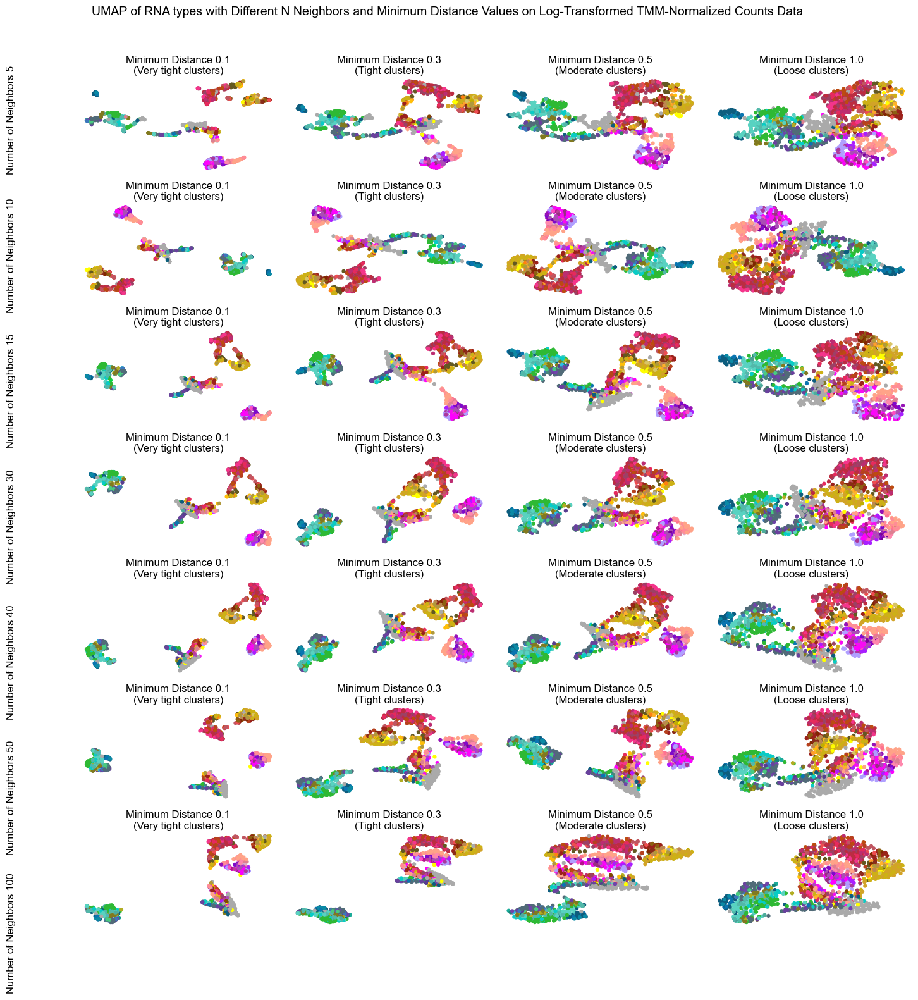

In [ ]:
# Function for UMAP visualization
def umap_visualization(
    adata,
    cluster_colors,
    n_neighbors,
    min_distances,
    min_dist_legend,
    n_pca_components=50,
    title="",
):
    umap_dict = {}

    # Perform PCA to reduce the data to n_pca_components dimensions
    sc.tl.pca(adata, n_comps=n_pca_components)

    # Create subplots for UMAP visualizations
    fig, axs = plt.subplots(
        len(n_neighbors), len(min_distances), figsize=(15, 15)
    )

    for i, n_neighbor in enumerate(n_neighbors):
        # Set the vertical subtitle for each row on the left side
        fig.text(
            0.04,
            0.86 - i * (1 / len(n_neighbors)),
            f"Number of Neighbors {n_neighbor}",
            ha="center",
            va="center",
            rotation="vertical",
            fontsize=12,
        )

        for j, min_dist in enumerate(min_distances):
            # Perform UMAP using Scanpy on the PCA-reduced data
            sc.pp.neighbors(adata, n_neighbors=n_neighbor, use_rep="X_pca")
            sc.tl.umap(adata, min_dist=min_dist)
            umap_results = adata.obsm["X_umap"]
            umap_dict[f"{n_neighbor},{min_dist}"] = umap_results

            # UMAP plot
            scatter = axs[i, j].scatter(
                umap_results[:, 0],
                umap_results[:, 1],
                c=cluster_colors,
                s=50,
                cmap="viridis",
            )
            axs[i, j].set_title(
                f"Minimum Distance {min_dist}\n({min_dist_legend[min_dist]})"
            )
            axs[i, j].axis("off")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0.1, 0, 1, 0.96])
    plt.show()

    return umap_dict


# Define the parameters
n_neighbors = [5, 10, 15, 30, 40, 50, 100]
min_distances = [0.1, 0.3, 0.5, 1.0]
min_dist_legend = {
    0.1: "Very tight clusters",
    0.3: "Tight clusters",
    0.5: "Moderate clusters",
    1.0: "Loose clusters",
}

# Example usage with TMM_counts and TMM_fano
TMM_log = get_log_transform(TMM_counts, TMM_fano, threshold=400)

np.random.seed(42)
# Create an AnnData object from your log-transformed data
adata = sc.AnnData(TMM_log)

# Ensure cluster_colors is a categorical array and matches the shape of adata.obs
adata.obs["clusters"] = cluster_colors

# Perform the visualization
umap_dict = umap_visualization(
    adata,
    adata.obs["clusters"],
    n_neighbors,
    min_distances,
    min_dist_legend,
    n_pca_components=50,
    title="UMAP of RNA types with Different N Neighbors and Minimum Distance Values on Log-Transformed TMM-Normalized Counts Data",
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">By visual inspection, we observe that as the number of neighbors increases, smaller clusters tend to merge into larger ones. Conversely, as the minimum distance parameter increases, the clusters become less compact and more spread out, thereby highlighting the separation and overall structure of the data. Again here, it is challenging to visually discern which parameter configuration best preserves the High dimentional structure of the data</div>

#### 3.1.3 Performance Evaluation between t-SNE and UMAP using Distance Correlations.

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Given the differences in how t-SNE and UMAP visulaize and represent clustering and density, we aimed to compare t-SNE and UMAP across various parameter settings to see how similarly they represent high-dimensional data. To achieve this, we performed a distance correlation analysis between each combination of t-SNE parameters and each combination of UMAP parameters. This approach allowed us to identify parameter configurations that effectively leverage/balance the strengths of both t-SNE and UMAP, <i>i.e., optimizing the preservation of local structures with t-SNE while capturing broader, global patterns with UMAP.</i></div>

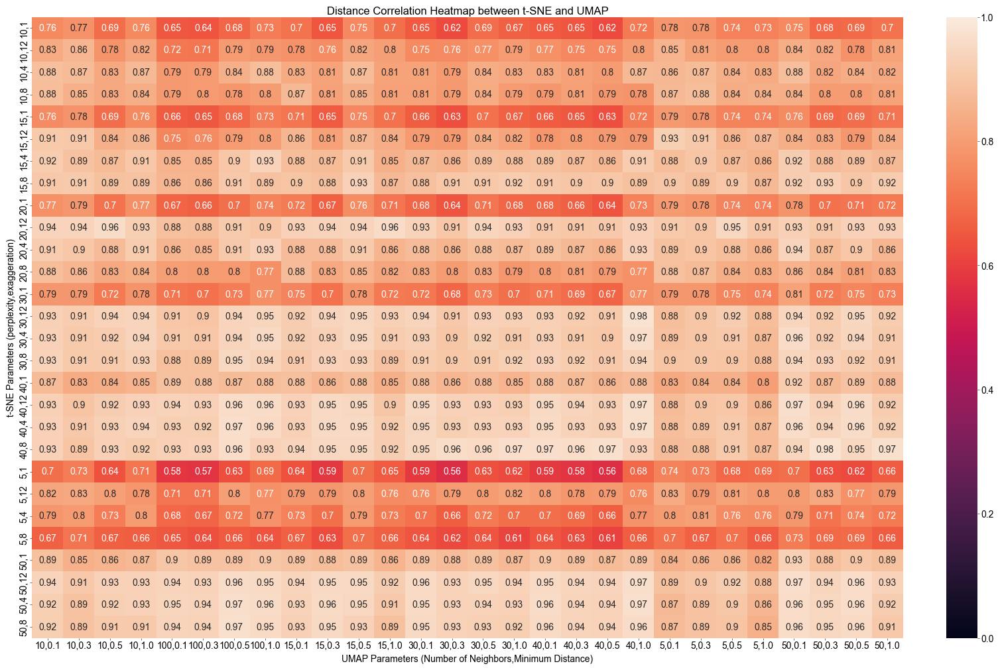

In [ ]:
def compute_distance_correlation_matrix(tsne_dict, umap_dict):
    # Create a dictionary to hold distance correlation values
    dist_corr_dict = {}

    # Iterate through all configurations of t-SNE and UMAP
    for tsne_key, tsne_embed in tsne_dict.items():
        for umap_key, umap_embed in umap_dict.items():
            # Compute distance matrices
            dist_tsne = squareform(pdist(tsne_embed))
            dist_umap = squareform(pdist(umap_embed))

            # Compute distance correlation
            dist_corr = dcor.distance_correlation(dist_tsne, dist_umap)

            # Store the result in the dictionary
            dist_corr_dict[(tsne_key, umap_key)] = dist_corr

    return dist_corr_dict


dist_corr_dict = compute_distance_correlation_matrix(tsne_dict, umap_dict)

# Convert the dictionary to a DataFrame for heatmap plotting
dist_corr_df = pd.DataFrame(
    list(dist_corr_dict.items()),
    columns=["Config Pair", "Distance Correlation"],
)

# Split 'Config Pair' into separate columns
dist_corr_df[
    [
        "t-SNE Parameters (perplexity,exaggeration)",
        "UMAP Parameters (Number of Neighbors,Minimum Distance)",
    ]
] = pd.DataFrame(
    dist_corr_df["Config Pair"].tolist(), index=dist_corr_df.index
)
dist_corr_df = dist_corr_df.drop(columns=["Config Pair"])

# Pivot the DataFrame for heatmap plotting
dist_corr_matrix = dist_corr_df.pivot(
    index="t-SNE Parameters (perplexity,exaggeration)",
    columns="UMAP Parameters (Number of Neighbors,Minimum Distance)",
    values="Distance Correlation",
)

# Plot heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(dist_corr_matrix, annot=True, vmin=0, vmax=1)
plt.title("Distance Correlation Heatmap between t-SNE and UMAP")
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">The plotted heatmap shows how similar the distance structures are between t-SNE and UMAP embeddings for various parameter settings. <strong>We observe that</strong> the highest correlation (0.98) is found when t-SNE uses Perplexity/Exaggeration values of 30/12 and UMAP uses N-Neighbors/Min Distance values of 40/1. This indicates that these parameter settings produce very similar representations of the data, meaning they capture the underlying data structure in a comparable way. The high correlation suggests that these settings effectively combine/balance t-SNE's strength in preserving local structures with UMAP's ability to capture both local and global structures. However, this does not directly show which parameters best preserve the high-dimensional structure of the data in a low-dimensional space for each of t-SNE and UMAP. To address this, we computed and visualized the correlations between the high-dimensional data and their low-dimensional embeddings from t-SNE and UMAP for various parameter combinations.</div>

#### 3.1.4 Determining the Faithful t-SNE and UMAP Representation Parameters and Performance comparison using Distance Correlation

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">So to quantitatively assess which parameter configuration best preserves the structure of our high-dimensional data in a low-dimensional space, we conducted another distance correlation analysis. This time, our analysis involved evaluating the correlation between high-dimensional distances and their low-dimensional representations for various t-SNE and UMAP parameters. To achieve this, we plotted heatmaps for both t-SNE and UMAP. For t-SNE, Perplexity was plotted on the x-axis and Exaggeration on the y-axis, while for UMAP, N-Neighbors was plotted on the x-axis and Min Distance on the y-axis. Each cell in the heatmaps represents a specific parameter combination and its associated distance correlation value. This approach allowed for a comprehensive quantitative evaluation of how different parameter settings affect the preservation of high-dimensional data structure in low-dimensional embeddings, which is more accurate than our above visual inspection. By identifying the parameter combinations with the highest correlation values, we compared the effectiveness/faithfullness of t-SNE and UMAP in maintaining the data’s structural integrity in reduced dimensions.</div>

t-SNE Distance Correlation Values:
[[0.76879984 0.79180391 0.78657447 0.80165816 0.83386241 0.78230977
  0.77814621]
 [0.73522486 0.74008726 0.72543293 0.7105348  0.6903669  0.64073659
  0.63641921]
 [0.71309956 0.70799628 0.65389984 0.69356207 0.64220521 0.61695544
  0.62959809]
 [0.6042774  0.67623366 0.57283009 0.60053177 0.63395116 0.64164705
  0.66815056]]
UMAP Distance Correlation Values:
[[0.5727235  0.59841776 0.55568047 0.55187699 0.56807085 0.65590913
  0.54921455]
 [0.55614431 0.59270858 0.53645565 0.54947963 0.55170427 0.57180719
  0.53075385]
 [0.58038418 0.56495506 0.60023092 0.58119313 0.55129686 0.61391588
  0.56104305]
 [0.59476568 0.57656596 0.56628373 0.57555668 0.60566777 0.60495983
  0.61157394]]


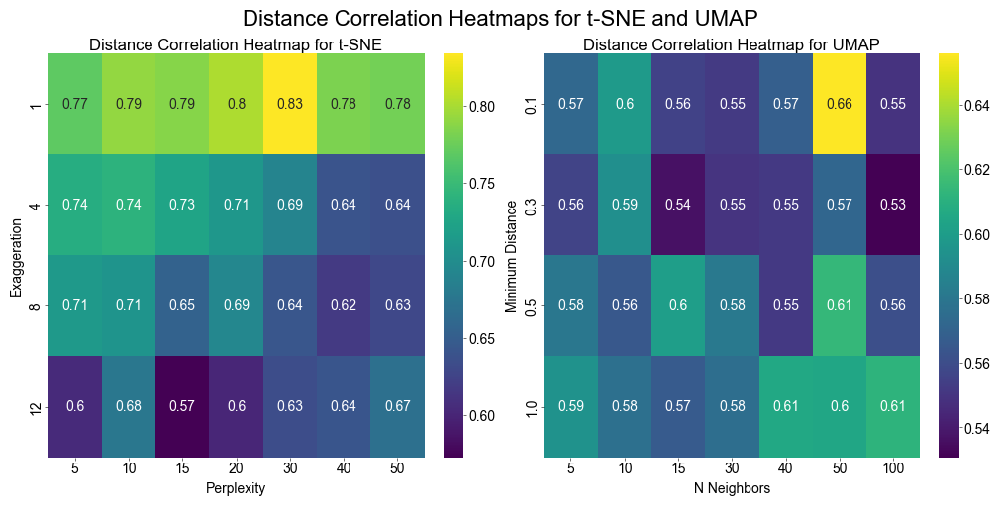

In [ ]:
# Function to compute distance correlation using dcor library
def compute_distance_correlation(high_dim_data, low_dim_data):
    # Compute pairwise distance matrices
    high_dim_dist = squareform(pdist(high_dim_data))
    low_dim_dist = squareform(pdist(low_dim_data))

    return dcor.distance_correlation(high_dim_dist, low_dim_dist)


# Function to plot heatmap of distance correlations
def plot_heatmap(
    ax,
    distance_correlations,
    method_name,
    x_labels,
    y_labels,
    x_label,
    y_label,
):
    sns.heatmap(
        distance_correlations,
        annot=True,
        xticklabels=x_labels,
        yticklabels=y_labels,
        cmap="viridis",
        cbar=True,
        ax=ax,
    )
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(f"Distance Correlation Heatmap for {method_name}")


# Compute distance correlation for t-SNE embeddings
tsne_distance_correlations = {}
for key, embedding in tsne_dict.items():
    tsne_distance_correlations[key] = compute_distance_correlation(
        adata.X, embedding
    )

# Compute distance correlation for UMAP embeddings
umap_distance_correlations = {}
for key, embedding in umap_dict.items():
    umap_distance_correlations[key] = compute_distance_correlation(
        adata.X, embedding
    )

# Prepare labels for heatmaps
perplexities = [5, 10, 15, 20, 30, 40, 50]
exaggerations = [1, 4, 8, 12]
n_neighbors = [5, 10, 15, 30, 40, 50, 100]
min_distances = [0.1, 0.3, 0.5, 1.0]

# Plot heatmaps for t-SNE
tsne_corr_values = np.zeros((len(exaggerations), len(perplexities)))
for i, exagg in enumerate(exaggerations):
    for j, perp in enumerate(perplexities):
        key = f"{perp},{exagg}"
        tsne_corr_values[i, j] = tsne_distance_correlations[key]

# Print t-SNE correlation values
print("t-SNE Distance Correlation Values:")
print(tsne_corr_values)

# Plot heatmaps for UMAP
umap_corr_values = np.zeros((len(min_distances), len(n_neighbors)))
for i, distance in enumerate(min_distances):
    for j, nn in enumerate(n_neighbors):
        key = f"{nn},{distance}"
        umap_corr_values[i, j] = umap_distance_correlations[key]

# Print UMAP correlation values
print("UMAP Distance Correlation Values:")
print(umap_corr_values)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot heatmap for t-SNE
plot_heatmap(
    axs[0],
    tsne_corr_values,
    "t-SNE",
    perplexities,
    exaggerations,
    "Perplexity",
    "Exaggeration",
)

# Plot heatmap for UMAP
plot_heatmap(
    axs[1],
    umap_corr_values,
    "UMAP",
    n_neighbors,
    min_distances,
    "N Neighbors",
    "Minimum Distance",
)

# Adjust layout manually
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4)

fig.suptitle("Distance Correlation Heatmaps for t-SNE and UMAP", fontsize=16)
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
    <strong>From both Heatmaps we observe that:</strong>
    <ul>
        <li>The highest distance correlation value for t-SNE is 0.83 which corresponds to exaggeration = 1 and perplexity = 30.</li>
        <li>The highest distance correlation value for UMAP is 0.66 which corresponds to min_distance = 0.1 and n_neighbors = 50.
        </li>
    </ul>
    These parameter settings best preserves the pairwise distances between points in the original high-dimensional space, which suggests that these configurations for t-SNE and UMAP provide the most faithful/accurate representation of the data's intrinsic structure in the lower-dimensional embedding. <strong>Importantly,</strong> the higher distance correlation value for the optimal parameters of t-SNE (0.83) compared to optimal paramters for UMAP (0.66) suggests that, for this particular Transcriptomics dataset, t-SNE with the optimal parameters is better at maintaining the high-dimensional structure in its low-dimensional embedding. <p style="background-color: #FFFF99; padding: 10px; border-radius: 5px;"><strong>Given this observation,</strong> we will primarily use t-SNE with a perplexity of 30 and an early exaggeration of 1 as the best surrogate representative of ground truth for comparison with clustering results obtained in Task 4.</p>
</div>

#### 3.1.5 UMAP of RNA Families with Different N Neighbors and Minimum Distance Values

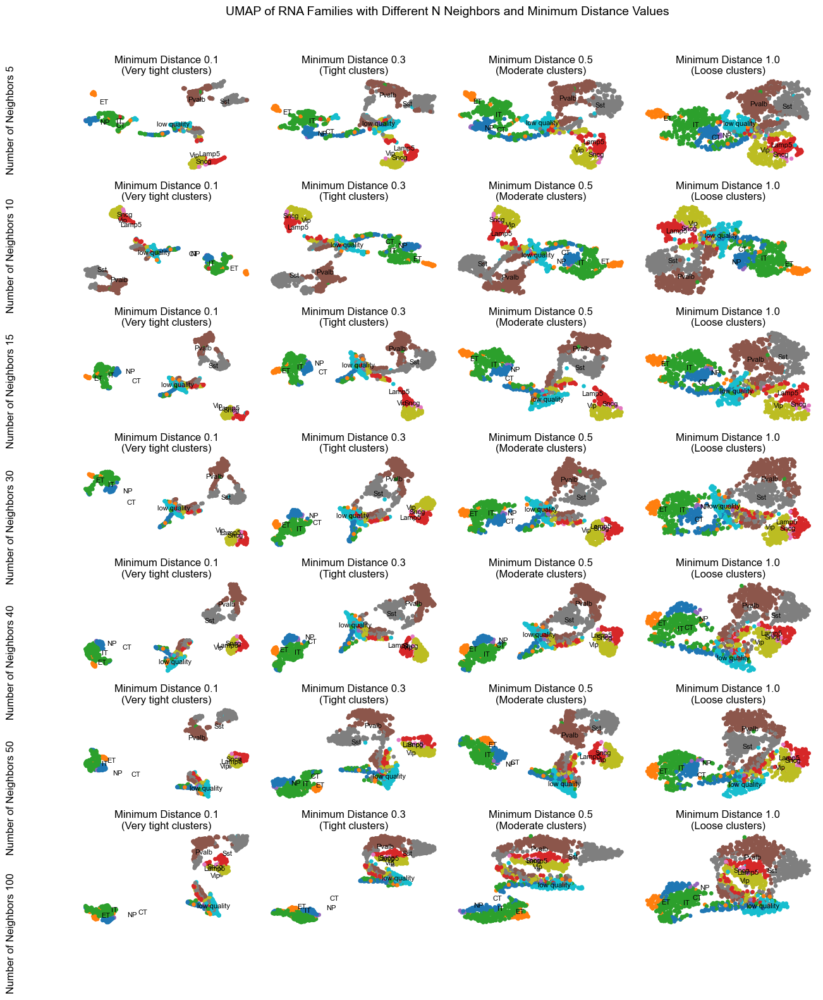

In [ ]:
# Function for UMAP visualization
def umap_visualization_RNAfamily(
    adata,
    n_neighbors,
    min_distances,
    min_dist_legend,
    n_pca_components=50,
    title="",
):
    umap_dict = {}

    # Perform PCA to reduce the data to n_pca_components dimensions
    sc.tl.pca(adata, n_comps=n_pca_components)

    # Create subplots for UMAP visualizations
    fig, axs = plt.subplots(
        len(n_neighbors), len(min_distances), figsize=(15, 15)
    )

    for i, n_neighbor in enumerate(n_neighbors):
        # Set the vertical subtitle for each row on the left side
        fig.text(
            0.04,
            0.86 - i * (1 / len(n_neighbors)),
            f"Number of Neighbors {n_neighbor}",
            ha="center",
            va="center",
            rotation="vertical",
            fontsize=12,
        )

        for j, min_dist in enumerate(min_distances):
            # Perform UMAP using Scanpy on the PCA-reduced data
            sc.pp.neighbors(adata, n_neighbors=n_neighbor, use_rep="X_pca")
            sc.tl.umap(adata, min_dist=min_dist)
            umap_results = adata.obsm["X_umap"]
            umap_dict[f"{n_neighbor},{min_dist}"] = umap_results

            # UMAP plot using Scanpy's plotting function, without the legend
            sc.pl.umap(
                adata,
                color="rna_family",
                ax=axs[i, j],
                show=False,
                legend_loc=None,  # Disable legend in individual subplots
                cmap="viridis",  # Use the same colormap
            )
            axs[i, j].set_title(
                f"Minimum Distance {min_dist}\n({min_dist_legend[min_dist]})"
            )
            axs[i, j].axis("off")

            # Add annotations for each RNA family
            for family in adata.obs["rna_family"].cat.categories:
                # Find coordinates of the current RNA family
                family_indices = adata.obs["rna_family"] == family
                family_coords = adata.obsm["X_umap"][family_indices]

                # Compute the centroid of the RNA family points
                centroid = family_coords.mean(axis=0)

                # Annotate the centroid with the family name
                axs[i, j].text(
                    centroid[0],
                    centroid[1],
                    family,
                    color="black",
                    fontsize=8,
                    ha="center",
                    va="center",
                )

    fig.suptitle(title, fontsize=14)
    plt.tight_layout(
        rect=[0.1, 0, 0.9, 0.96]
    )  # Adjust layout to make space for the title
    plt.show()

    return umap_dict


# Define the parameters
n_neighbors = [5, 10, 15, 30, 40, 50, 100]
min_distances = [0.1, 0.3, 0.5, 1.0]
min_dist_legend = {
    0.1: "Very tight clusters",
    0.3: "Tight clusters",
    0.5: "Moderate clusters",
    1.0: "Loose clusters",
}

adata = sc.AnnData(TMM_log)

# Add RNA family information
adata.obs["rna_family"] = pd.Categorical(meta["RNA family"])

# Perform the visualization
umap_dict = umap_visualization_RNAfamily(
    adata,  # AnnData object
    n_neighbors,
    min_distances,
    min_dist_legend,
    n_pca_components=50,  # Number of PCA components
    title="UMAP of RNA Families with Different N Neighbors and Minimum Distance Values",
)

UMAP Distance Correlation Values:
[[0.5727235  0.59841776 0.55568047 0.55187699 0.56807085 0.65590913
  0.54921455]
 [0.55614431 0.59270858 0.53645565 0.54947963 0.55170427 0.57180719
  0.53075385]
 [0.58038418 0.56495506 0.60023092 0.58119313 0.55129686 0.61391588
  0.56104305]
 [0.59476568 0.57656596 0.56628373 0.57555668 0.60566777 0.60495983
  0.61157394]]


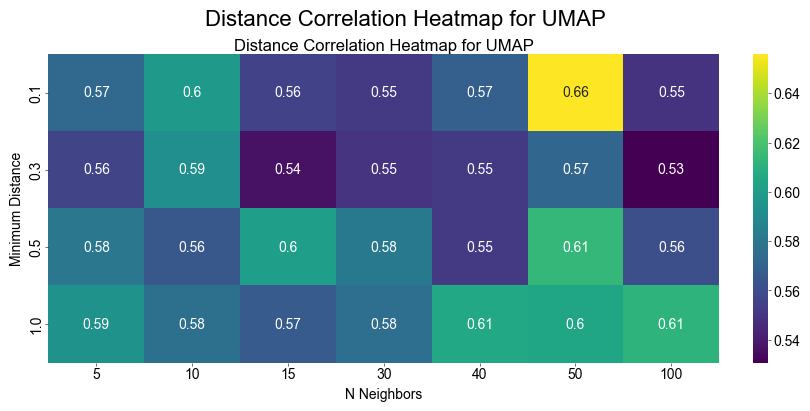

In [ ]:
# Compute distance correlation for UMAP embeddings
umap_distance_correlations = {}
for key, embedding in umap_dict.items():
    umap_distance_correlations[key] = compute_distance_correlation(
        adata.X, embedding
    )

# Prepare labels for heatmaps
n_neighbors = [5, 10, 15, 30, 40, 50, 100]
min_distances = [0.1, 0.3, 0.5, 1.0]

# Plot heatmaps for UMAP
umap_corr_values = np.zeros((len(min_distances), len(n_neighbors)))
for i, distance in enumerate(min_distances):
    for j, nn in enumerate(n_neighbors):
        key = f"{nn},{distance}"
        if key in umap_distance_correlations:
            umap_corr_values[i, j] = umap_distance_correlations[key]
        else:
            umap_corr_values[i, j] = np.nan  # Handle missing keys gracefully

# Print UMAP correlation values
print("UMAP Distance Correlation Values:")
print(umap_corr_values)

# Create subplots
fig, axs = plt.subplots(1, 1, figsize=(8, 4))

# Plot heatmap for UMAP
plot_heatmap(
    axs,
    umap_corr_values,
    "UMAP",
    n_neighbors,
    min_distances,
    "N Neighbors",
    "Minimum Distance",
)

fig.suptitle("Distance Correlation Heatmap for UMAP", fontsize=16)
plt.show()

#### 3.1.6 Performance Evaluation between t-SNE and UMAP using kNN Accuracy/Recall

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">To confirm the superiority of t-SNE over UMAP in preserving High dimentional structure for our datset in low dimentional space, we sought to conduct a kNN Accuracy/Recall as another quantitative metric as suggested in Task 3 description.</div>

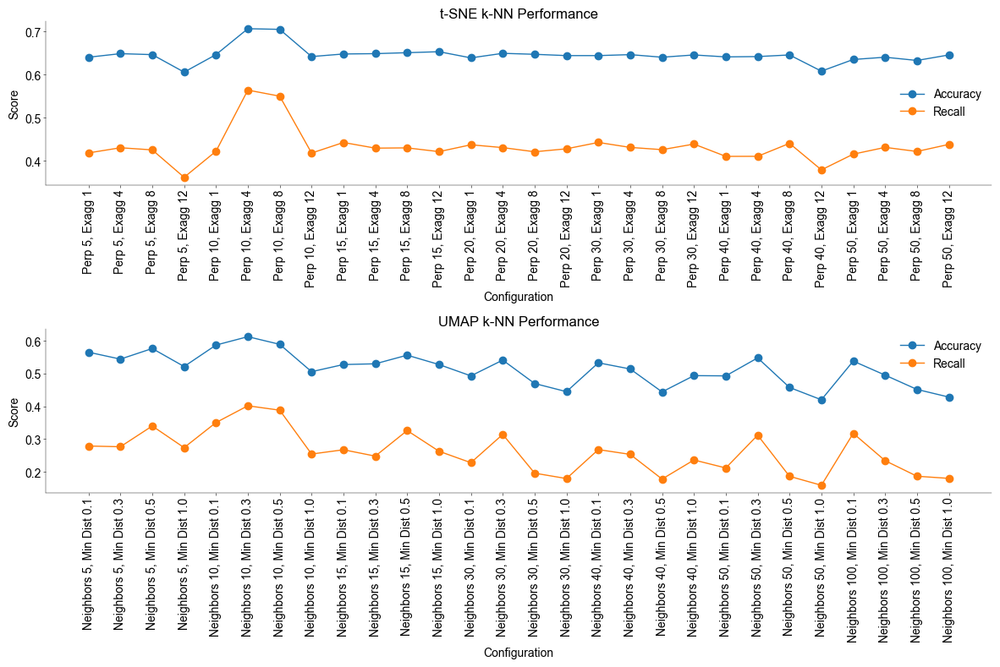

In [ ]:
def knn_classification_performance(high_dim_data, low_dim_data, labels, k=5):
    # High-dimensional k-NN
    knn_high = KNeighborsClassifier(n_neighbors=k)
    knn_high.fit(high_dim_data, labels)
    high_dim_predictions = knn_high.predict(high_dim_data)

    high_dim_accuracy = accuracy_score(labels, high_dim_predictions)
    high_dim_recall = recall_score(
        labels, high_dim_predictions, average="macro"
    )

    # Low-dimensional k-NN
    knn_low = KNeighborsClassifier(n_neighbors=k)
    knn_low.fit(low_dim_data, labels)
    low_dim_predictions = knn_low.predict(low_dim_data)

    low_dim_accuracy = accuracy_score(labels, low_dim_predictions)
    low_dim_recall = recall_score(labels, low_dim_predictions, average="macro")

    return {
        "high_dim_accuracy": high_dim_accuracy,
        "high_dim_recall": high_dim_recall,
        "low_dim_accuracy": low_dim_accuracy,
        "low_dim_recall": low_dim_recall,
    }


def tune_knn_classifier(high_dim_data, low_dim_data, labels, param_grid):
    # High-dimensional k-NN tuning
    knn_high = KNeighborsClassifier()
    grid_search_high = GridSearchCV(knn_high, param_grid, cv=5)
    grid_search_high.fit(high_dim_data, labels)
    best_k_high = grid_search_high.best_params_["n_neighbors"]

    # Low-dimensional k-NN tuning
    knn_low = KNeighborsClassifier()
    grid_search_low = GridSearchCV(knn_low, param_grid, cv=5)
    grid_search_low.fit(low_dim_data, labels)
    best_k_low = grid_search_low.best_params_["n_neighbors"]

    return best_k_high, best_k_low


# Define parameter grid for k-NN tuning using a range of values
param_grid = {"n_neighbors": list(range(3, 51, 2))}

adata.obs["clusters"] = cluster_colors

# Compute k-NN performance for t-SNE
tsne_performance = {}
for key, embedding in tsne_dict.items():
    best_k_high, best_k_low = tune_knn_classifier(
        adata.X, embedding, adata.obs["clusters"], param_grid
    )
    tsne_performance[key] = knn_classification_performance(
        adata.X, embedding, adata.obs["clusters"], k=best_k_low
    )

# Compute k-NN performance for UMAP
umap_performance = {}
for key, embedding in umap_dict.items():
    best_k_high, best_k_low = tune_knn_classifier(
        adata.X, embedding, adata.obs["clusters"], param_grid
    )
    umap_performance[key] = knn_classification_performance(
        adata.X, embedding, adata.obs["clusters"], k=best_k_low
    )

# Define configuration labels
tsne_config_labels = {
    f"{perplexity},{exaggeration}": f"Perp {perplexity}, Exagg {exaggeration}"
    for perplexity in perplexities
    for exaggeration in exaggerations
}
umap_config_labels = {
    f"{n_neighbor},{min_dist}": f"Neighbors {n_neighbor}, Min Dist {min_dist}"
    for n_neighbor in n_neighbors
    for min_dist in min_distances
}


def create_performance_dataframe(performance_dict, config_labels):
    accuracies = []
    recalls = []
    configs = []

    for config, perf in performance_dict.items():
        accuracies.append(perf["low_dim_accuracy"])
        recalls.append(perf["low_dim_recall"])
        configs.append(
            config_labels.get(config, config)
        )  # Use config if label is not found

    return pd.DataFrame(
        {"Configuration": configs, "Accuracy": accuracies, "Recall": recalls}
    )


# Create DataFrames
tsne_df = create_performance_dataframe(tsne_performance, tsne_config_labels)
umap_df = create_performance_dataframe(umap_performance, umap_config_labels)

fig, axs = plt.subplots(2, 1, figsize=(12, 8))

# t-SNE Performance
axs[0].plot(
    tsne_df["Configuration"], tsne_df["Accuracy"], label="Accuracy", marker="o"
)
axs[0].plot(
    tsne_df["Configuration"], tsne_df["Recall"], label="Recall", marker="o"
)
axs[0].set_title("t-SNE k-NN Performance")
axs[0].set_xlabel("Configuration")
axs[0].set_ylabel("Score")
axs[0].legend()
axs[0].tick_params(
    axis="x", rotation=90
)  # Rotate x-axis labels for better readability

# UMAP Performance
axs[1].plot(
    umap_df["Configuration"], umap_df["Accuracy"], label="Accuracy", marker="o"
)
axs[1].plot(
    umap_df["Configuration"], umap_df["Recall"], label="Recall", marker="o"
)
axs[1].set_title("UMAP k-NN Performance")
axs[1].set_xlabel("Configuration")
axs[1].set_ylabel("Score")
axs[1].legend()
axs[1].tick_params(axis="x", rotation=90)  # Rotate x-axis labels
plt.tight_layout()
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
We observe fluctuating performance of UMAP with respect to accuracy and recall. For UMAP, both metrics show synchronous apparent improvement as the minimum distance parameter increases up to 0.1 or 0.3, but decline as the minimum distance continues to increase. In contrast, the performance of t-SNE remains stable for perplexity values greater than 10.
We also notice a discrepancy between the optimal parameters for t-SNE and UMAP obtained from k-NN accuracy/recall and those obtained from distance correlation analysis performed in point 3.1.4. of Task 3. A plausible explanation could be because k-NN assesses classification performance based on the nearest neighbors in the low-dimensional space, focusing on the local neighborhood structure and how well clusters or classes are separated. In contrast, distance correlation evaluates how well the overall structure of the data is maintained in reduced dimentions.

Notably, t-SNE generally exhibits higher accuracy and recall than UMAP when representing our high-dimensional data in a low-dimensional space. This confirms our observation on the superiority of t-SNE over UMAP.

 <p style="background-color: #FFFF99; padding: 10px; border-radius: 5px;"><strong>Given these observations,</strong> therefore we decided to test for statistical significance of this difference in performance between t-SNE aand UMAP using a paired t-test.</p>
</div>

##### 3.1.6.1 Tesing the Statistical Significance of the observed Difference in Performance between t-SNE and UMAP

Accuracy p-value: 2.202264002041e-15
Recall p-value: 1.6995106299964598e-15
t-SNE Average Performance:
Accuracy    0.645974
Recall      0.432463
dtype: float64

UMAP Average Performance:
Accuracy    0.514458
Recall      0.260921
dtype: float64


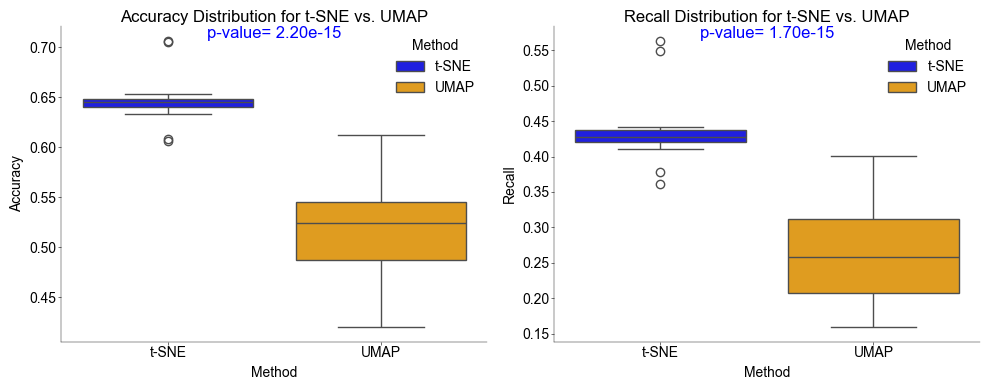

In [ ]:
# Extract accuracy and recall values for t-SNE and UMAP
tsne_accuracies = tsne_df["Accuracy"].values
umap_accuracies = umap_df["Accuracy"].values

tsne_recalls = tsne_df["Recall"].values
umap_recalls = umap_df["Recall"].values

# Perform paired t-tests
accuracy_p_value = ttest_rel(tsne_accuracies, umap_accuracies).pvalue
recall_p_value = ttest_rel(tsne_recalls, umap_recalls).pvalue

print(f"Accuracy p-value: {accuracy_p_value}")
print(f"Recall p-value: {recall_p_value}")

# Combine t-SNE and UMAP performance data for plotting
performance_data = pd.DataFrame(
    {
        "Configuration": pd.concat(
            [tsne_df["Configuration"], umap_df["Configuration"]]
        ),
        "Accuracy": np.concatenate(
            [tsne_df["Accuracy"].values, umap_df["Accuracy"].values]
        ),
        "Recall": np.concatenate(
            [tsne_df["Recall"].values, umap_df["Recall"].values]
        ),
        "Method": ["t-SNE"] * len(tsne_df) + ["UMAP"] * len(umap_df),
    }
)


# Calculate average accuracy and recall for t-SNE and UMAP
def aggregate_performance(df):
    return df[["Accuracy", "Recall"]].mean()


# Aggregate performance metrics
tsne_avg_performance = aggregate_performance(tsne_df)
umap_avg_performance = aggregate_performance(umap_df)

print("t-SNE Average Performance:")
print(tsne_avg_performance)
print("\nUMAP Average Performance:")
print(umap_avg_performance)

# Define a color palette for the methods
palette = {"t-SNE": "blue", "UMAP": "orange"}

# Create subplots with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot Accuracy distribution
sns.boxplot(
    x="Method",
    y="Accuracy",
    data=performance_data,
    ax=axs[0],
    hue="Method",
    palette=palette,
    legend=True,
)
axs[0].set_title("Accuracy Distribution for t-SNE vs. UMAP")
axs[0].set_xlabel("Method")
axs[0].set_ylabel("Accuracy")
axs[0].text(
    0.5,
    max(performance_data["Accuracy"]),
    f"p-value= {accuracy_p_value:.2e}",
    ha="center",
    va="bottom",
    color="blue",
    fontsize=12,
)

# Plot Recall distribution
sns.boxplot(
    x="Method",
    y="Recall",
    data=performance_data,
    ax=axs[1],
    hue="Method",
    palette=palette,
    legend=True,
)
axs[1].set_title("Recall Distribution for t-SNE vs. UMAP")
axs[1].set_xlabel("Method")
axs[1].set_ylabel("Recall")
axs[1].text(
    0.5,
    max(performance_data["Recall"]),
    f"p-value= {recall_p_value:.2e}",
    ha="center",
    va="bottom",
    color="blue",
    fontsize=12,
)

plt.tight_layout()
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;"><strong>Our further analysis </strong> shows a statistically significant difference in performance between t-SNE and UMAP <i>(p-values: as printed and shown in plots)</i> respectively.the superiority of t-SNE  over UMAP in preserving the High dimentional structure of the Transcriptomic dataset at both accuracy and recall levels. Such difference in performance is statistically significant <i>(p-values: as printed and shown in plots) </i> respectively.

Given that distance correlation measures how well the overall structure of the data is preserved, we will still use the optimal t-SNE parameters identified through distance correlation analysis as our reference as we indicated in point 3.1.4. This choice is based on t-SNE's higher correlation values compared to UMAP. These parameters will serve as the benchmark for comparing the results of clustering algorithms in the subsequent analysis in Task 4. </div>

### 3.2 Electrophysiological Data visualization

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;"> Next we shift attention to our electrophysiology (Ephy) data.</div>

#### 3.2.1 Determining the Faithful t-SNE and UMAP Representation Parameters for Optimal Ephys Layers Visualization

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;"> To effectively visualize our Ephy data, we will compute the distance correlation between the high-dimensional and low-dimensional representations for both t-SNE and UMAP. This analysis will help us identify which visualization technique best preserves the high-dimensional structure in the low-dimensional space. And Instead of manually plotting various combinations of perplexity/exaggeration and N neighbors/Min. distance as we did in the Transcriptomics data, we will select the technique and parameter that show the highest distance correlation. This approach will streamline our analysis and avoid unnecessarily extending the length of our Jupyter notebook.</div>

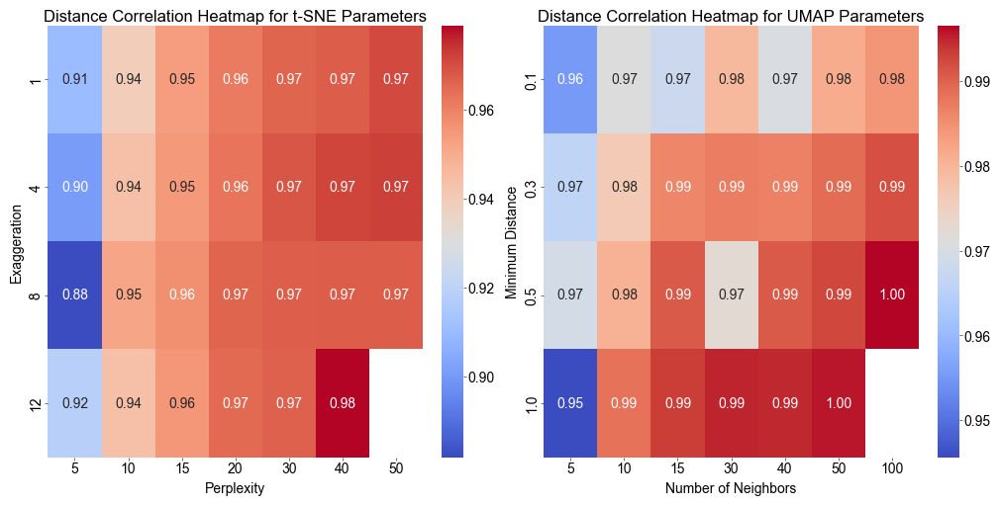

In [ ]:
# Define the function to compute distance correlation
def compute_distance_correlation(high_dim_data, low_dim_data):
    # Compute pairwise distance matrices
    high_dim_dist = squareform(pdist(high_dim_data))
    low_dim_dist = squareform(pdist(low_dim_data))
    return dcor.distance_correlation(high_dim_dist, low_dim_dist)


# Define the parameters for t-SNE and UMAP
perplexities = [5, 10, 15, 20, 30, 40, 50]
exaggerations = [1, 4, 8, 12]

# Added UMAP parameters
n_neighbors = [5, 10, 15, 30, 40, 50, 100]
min_distances = [0.1, 0.3, 0.5, 1.0]

# Create empty DataFrames to store distance correlations
tsne_distance_correlation_df = pd.DataFrame(
    index=exaggerations, columns=perplexities
)

# Added DataFrame for UMAP
umap_distance_correlation_df = pd.DataFrame(
    index=min_distances, columns=n_neighbors
)

# Create AnnData object
adata = sc.AnnData(ephysData_filtered)

# Add metadata to AnnData
adata.obs["layers"] = layers[keepcells]
adata.obs["rna_type"] = meta["RNA type"][keepcells]
adata.obs["cluster_colors"] = cluster_colors[keepcells]

# Store t-SNE embeddings
tsne_embeddings = {}

# Iterate over t-SNE parameters
for exagg in exaggerations:
    for perp in perplexities:
        # Perform t-SNE with current parameters
        sc.tl.tsne(adata, perplexity=perp, early_exaggeration=exagg)

        # Get the t-SNE coordinates
        tsne_coords = adata.obsm["X_tsne"]

        # Store the embeddings
        tsne_embeddings[(exagg, perp)] = tsne_coords

# Compute distance correlations for t-SNE
for (exagg1, perp1), tsne_coords1 in tsne_embeddings.items():
    for (exagg2, perp2), tsne_coords2 in tsne_embeddings.items():
        if (exagg1, perp1) < (exagg2, perp2):
            # Compute distance correlation between embeddings
            dist_corr = compute_distance_correlation(
                tsne_coords1, tsne_coords2
            )
            tsne_distance_correlation_df.at[exagg1, perp1] = dist_corr

# Store UMAP embeddings
umap_embeddings = {}

# Iterate over UMAP parameters
for n_neigh in n_neighbors:
    for min_dist in min_distances:
        # Perform UMAP with current parameters
        sc.pp.neighbors(adata, n_neighbors=n_neigh)
        sc.tl.umap(adata, min_dist=min_dist)

        # Get the UMAP coordinates
        umap_coords = adata.obsm["X_umap"]

        # Store the embeddings
        umap_embeddings[(n_neigh, min_dist)] = umap_coords

# Compute distance correlations for UMAP
for (n_neigh1, min_dist1), umap_coords1 in umap_embeddings.items():
    for (n_neigh2, min_dist2), umap_coords2 in umap_embeddings.items():
        if (n_neigh1, min_dist1) < (n_neigh2, min_dist2):
            # Compute distance correlation between embeddings
            dist_corr = compute_distance_correlation(
                umap_coords1, umap_coords2
            )
            umap_distance_correlation_df.at[min_dist1, n_neigh1] = dist_corr

# Create subplots for the heatmaps
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot distance correlation heatmap for t-SNE
sns.heatmap(
    tsne_distance_correlation_df.astype(float),
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    ax=axs[0],
)
axs[0].set_title("Distance Correlation Heatmap for t-SNE Parameters")
axs[0].set_xlabel("Perplexity")
axs[0].set_ylabel("Exaggeration")

# Plot distance correlation heatmap for UMAP
sns.heatmap(
    umap_distance_correlation_df.astype(float),
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    ax=axs[1],
)
axs[1].set_title("Distance Correlation Heatmap for UMAP Parameters")
axs[1].set_xlabel("Number of Neighbors")
axs[1].set_ylabel("Minimum Distance")

# Adjust layout manually to make room for titles and ensure proper alignment
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4)
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
    <strong>From both Heatmaps we observe that:</strong>
    <ul>
        <li>The highest distance correlation value for t-SNE is 0.98 which corresponds to exaggeration = 12 and perplexity = 40.</li>
        <li>The highest distance correlation value for UMAP is 1 which corresponds to Min Distance = 0.5 and N neighbors = 100.
        </li>
    </ul>
    These parameter settings best preserves the pairwise distances between points in the original high-dimensional space, which suggests that these configurations for t-SNE and UMAP provide the most faithful/accurate representation of the Ephys data's intrinsic structure in the lower-dimensional embedding. <strong>Importantly,</strong> the higher distance correlation value for the optimal parameters of UMAP (1) compared to optimal paramters for t-SNE (0.98) suggests that, for this particular Ephys dataset, UMAP with the optimal parameters is very slightly better (yet likely non-significant) at maintaining the high-dimensional structure in its low-dimensional embedding.

<p style="background-color: #FFFF99; padding: 10px; border-radius: 5px;"><strong>Given this observation,</strong> we will visualize the Ephy layers using those optimum parameters for t-SNE and UMAP.</p>
</div>

#### 3.2.2 Visualization of Ephys Cortical Layers Clusters using Optimal t-SNE and UMAP Parameters

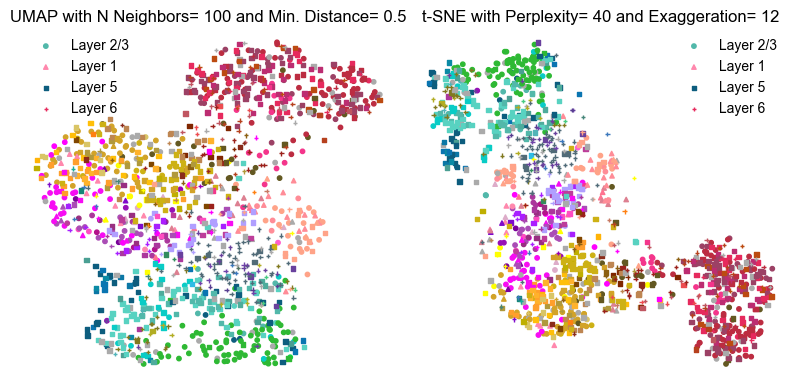

In [ ]:
# Define the best UMAP parameters
best_n_neighbors = 100
best_min_dist = 0.5

# Perform UMAP with the best parameters
sc.pp.neighbors(adata, n_neighbors=best_n_neighbors)
sc.tl.umap(adata, min_dist=best_min_dist)

# Define the best t-SNE parameters
best_perp = 40
best_exagg = 12

# Perform t-SNE with the best parameters
sc.tl.tsne(adata, perplexity=best_perp, early_exaggeration=best_exagg)

# Get unique layers
unique_layers = set(adata.obs["layers"])

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

# Define marker styles
shapes = {"1": "^", "2/3": "o", "5": "s", "6": "+"}

# Plot UMAP
for l in unique_layers:
    indices_mask = adata.obs["layers"] == l
    axs[0].scatter(
        adata.obsm["X_umap"][indices_mask, 0],
        adata.obsm["X_umap"][indices_mask, 1],
        s=10,
        label=f"Layer {l}",
        c=adata.obs["cluster_colors"][indices_mask],
        marker=shapes.get(l, "o"),
    )
axs[0].axis("off")
axs[0].legend()
axs[0].set_title(
    f"UMAP with N Neighbors= {best_n_neighbors} and Min. Distance= {best_min_dist}"
)
axs[0].set_xlabel("UMAP Component 1")
axs[0].set_ylabel("UMAP Component 2")

# Plot t-SNE
for l in unique_layers:
    indices_mask = adata.obs["layers"] == l
    axs[1].scatter(
        adata.obsm["X_tsne"][indices_mask, 0],
        adata.obsm["X_tsne"][indices_mask, 1],
        s=10,
        label=f"Layer {l}",
        c=adata.obs["cluster_colors"][indices_mask],
        marker=shapes.get(l, "o"),
    )
axs[1].axis("off")
axs[1].legend()
axs[1].set_title(
    f"t-SNE with Perplexity= {best_perp} and Exaggeration= {best_exagg}"
)
axs[1].set_xlabel("t-SNE Component 1")
axs[1].set_ylabel("t-SNE Component 2")

plt.tight_layout()
plt.show()

#### 3.2.3 t-SNE and UMAP Visualization of RNA Families per Layer

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">We also were interested to investigate whether different RNA families exhibit distinct gene expression profiles across various cortical layers. To achieve this, we employed the optimal t-SNE and UMAP parameters for the electrophysiology (Ephys) data obtained above, allowing us to best discern the clustering of each RNA family and which RNA families are present or absent in each cortical layer, which potentially reflects underlying diverse neuronal functions.</div>

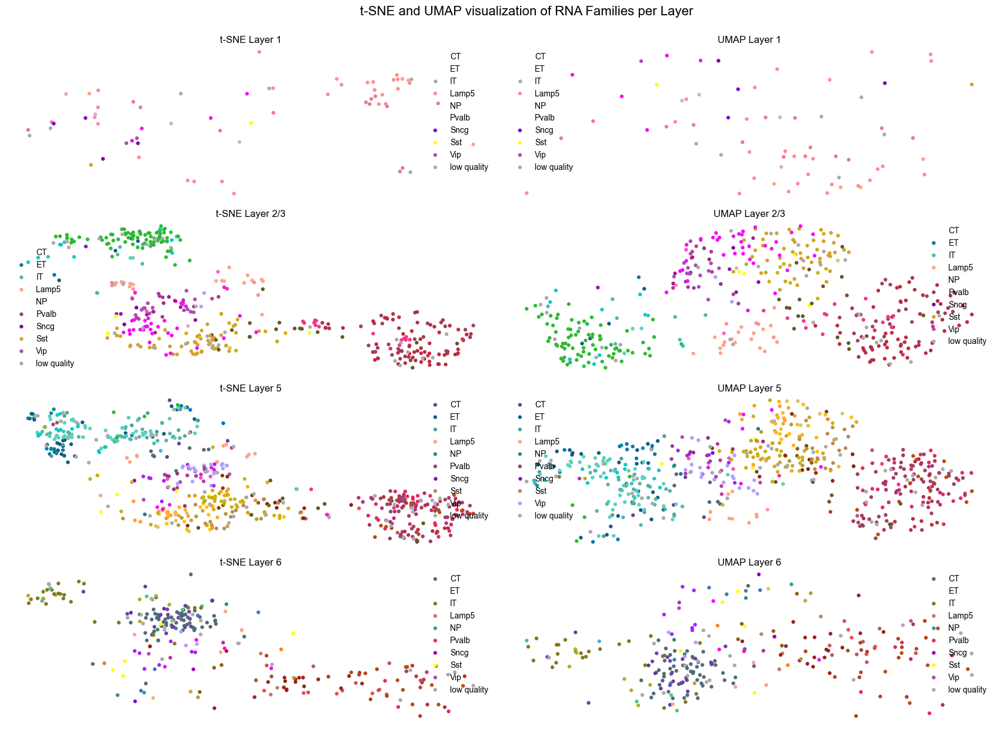

RNA Families Absent in Each Layer:

Layer 1: ET, Pvalb, CT, NP
Layer 2/3: CT, NP
Layer 5: All RNA families are Expressed
Layer 6: ET


In [ ]:
# Define the best parameters
best_perp = 40
best_exagg = 12
best_n_neighbors = 50
best_min_dist = 1

# Perform t-SNE and UMAP with the best parameters
sc.tl.tsne(adata, perplexity=best_perp, early_exaggeration=best_exagg)
sc.pp.neighbors(adata, n_neighbors=best_n_neighbors)
sc.tl.umap(adata, min_dist=best_min_dist)

# Use filtered data for plotting
layers_filtered = adata.obs["layers"].values
family_filtered = meta["RNA family"][keepcells].values
cluster_colors_filtered = cluster_colors[keepcells]

# Unique values for layers and families
unique_layers = np.unique(layers_filtered)
unique_families = np.unique(family_filtered)

# Create a 4x2 grid for plotting
fig, axs = plt.subplots(len(unique_layers), 2, figsize=(18, 12))

# Plot t-SNE in the left column
for i, l in enumerate(unique_layers):
    # Filter data for the current layer
    indices_mask_layers = layers_filtered == l
    for f in unique_families:
        indices_mask_families = family_filtered == f
        indices_mask = indices_mask_layers & indices_mask_families

        # Scatter plot
        axs[i, 0].scatter(
            adata.obsm["X_tsne"][indices_mask, 0],
            adata.obsm["X_tsne"][indices_mask, 1],
            s=50,
            label=f"{f}",
            c=cluster_colors_filtered[indices_mask],
        )
    axs[i, 0].set_title(f"t-SNE Layer {l}")
    axs[i, 0].legend()
    axs[i, 0].axis("off")

# Plot UMAP in the right column
for i, l in enumerate(unique_layers):
    # Filter data for the current layer
    indices_mask_layers = layers_filtered == l
    for f in unique_families:
        indices_mask_families = family_filtered == f
        indices_mask = indices_mask_layers & indices_mask_families

        # Scatter plot
        axs[i, 1].scatter(
            adata.obsm["X_umap"][indices_mask, 0],
            adata.obsm["X_umap"][indices_mask, 1],
            s=50,
            label=f"{f}",
            c=cluster_colors_filtered[indices_mask],
        )
    axs[i, 1].set_title(f"UMAP Layer {l}")
    axs[i, 1].legend()
    axs[i, 1].axis("off")

# Adjust layout
plt.tight_layout(
    rect=[0, 0, 0.9, 1]
)  # Adjust the right margin for the suptitle
# Adjust layout and title
fig.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust margins for the title
fig.suptitle(
    "t-SNE and UMAP visualization of RNA Families per Layer",
    fontsize=16,  # Adjust font size
    horizontalalignment="center",  # Center the title
    verticalalignment="top",  # Place title above the plots
    y=1.03,  # Adjust vertical position
)
plt.show()

# Create a dictionary to store the families present in each layer
families_per_layer = {l: set() for l in unique_layers}

# Populate the dictionary with RNA families present in each layer
for l in unique_layers:
    indices_mask_layers = layers_filtered == l
    families_present = np.unique(family_filtered[indices_mask_layers])
    families_per_layer[l].update(families_present)

# Print the RNA families absent in each layer
print("RNA Families Absent in Each Layer:\n")
for l in unique_layers:
    absent_families = set(unique_families) - families_per_layer[l]
    if absent_families:
        print(f"Layer {l}: {', '.join(absent_families)}")
    else:
        print(f"Layer {l}: All RNA families are Expressed")

#### 3.2.4 t-SNE and UMAP Clusterings per RNA Family

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">To enhance visual clarity, we plotted each RNA family separately to identify the expression patterns of RNA families across each layers.</div>

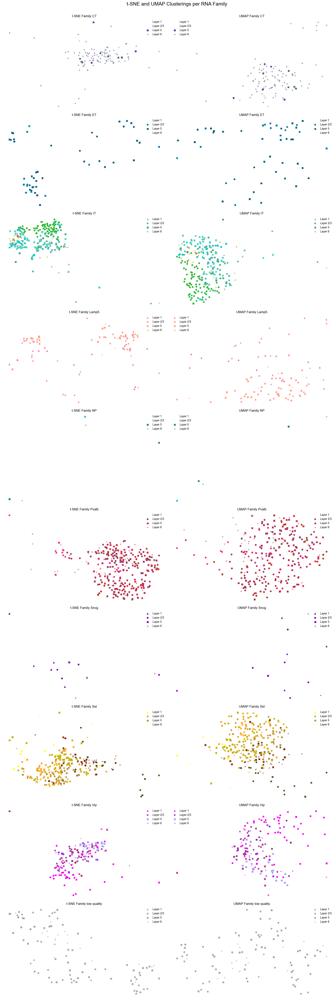

In [ ]:
# Define the best parameters
best_perp = 40
best_exagg = 12
best_n_neighbors = 50
best_min_dist = 1

# Perform t-SNE and UMAP with the best parameters
sc.tl.tsne(adata, perplexity=best_perp, early_exaggeration=best_exagg)
sc.pp.neighbors(adata, n_neighbors=best_n_neighbors)
sc.tl.umap(adata, min_dist=best_min_dist)

# Use filtered data for plotting
layers_filtered = adata.obs["layers"].values
family_filtered = meta["RNA family"][keepcells].values
cluster_colors_filtered = cluster_colors[keepcells]

# Unique values for layers and families
unique_layers = np.unique(layers_filtered)
unique_families = np.unique(family_filtered)

# Define marker styles
shapes = {"1": "^", "2/3": "o", "5": "s", "6": "+"}

# Create subplots: num_families rows, 2 columns (for t-SNE and UMAP)
fig, axs = plt.subplots(
    len(unique_families), 2, figsize=(18, 5 * len(unique_families))
)

# Plot t-SNE and UMAP for each RNA family
for i, f in enumerate(unique_families):
    indices_mask_families = family_filtered == f
    for l in unique_layers:
        indices_mask_layers = layers_filtered == l
        indices_mask = indices_mask_layers & indices_mask_families

        # Plot t-SNE
        axs[i, 0].scatter(
            adata.obsm["X_tsne"][indices_mask, 0],
            adata.obsm["X_tsne"][indices_mask, 1],
            s=30,
            c=cluster_colors_filtered[indices_mask],
            marker=shapes.get(l, "o"),
            label=f"Layer {l}",
        )
        axs[i, 0].set_title(f"t-SNE Family {f}")
        axs[i, 0].legend()
        axs[i, 0].axis("off")

        # Plot UMAP
        axs[i, 1].scatter(
            adata.obsm["X_umap"][indices_mask, 0],
            adata.obsm["X_umap"][indices_mask, 1],
            s=30,
            c=cluster_colors_filtered[indices_mask],
            marker=shapes.get(l, "o"),
            label=f"Layer {l}",
        )
        axs[i, 1].set_title(f"UMAP Family {f}")
        axs[i, 1].legend()
        axs[i, 1].axis("off")

# Adjust layout and title
fig.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust margins for the title
fig.suptitle(
    "t-SNE and UMAP Clusterings per RNA Family",
    fontsize=18,  # Adjust font size
    horizontalalignment="center",  # Center the title
    verticalalignment="top",  # Place title above the plots
    y=1.01,  # Adjust vertical position
)
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;"><strong>From the clustering above</strong> the IT Family is of particular interest, as the individual RNA types (indicated by color) and their respective layers (indicated by shape) appear to form distinct subclusters within this family.</div>

## Task 4: Clustering Algorithms

### 4.1 Clustering relying on Transcriptomic Data only

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Next we wanted to evaluate different clustering methods on the processed dataset. For this, we will use the ground truth labels (RNA family/RNA type) to assess the results using extrinsic evaluation metrics. We have chosen the Adjusted Rand Index (ARI) as it is a standard metric for evaluating clusterings and accounts for some randomness in label assignment. Additionally, we will use Normalized Mutual Information (NMI) to measure how much information is shared between the labels assigned by the clustering algorithm and the ground truth class labels. In real-world scenarios, where ground truth labels are typically unavailable, we will use the silhouette score as an intrinsic metric to select the cluster parameters for Leiden clustering.</div>

#### 4.1.1 Clustering of RNA Famlilies

#### 4.1.1.1 Leiden Clustering of RNA Famlies

Parameters based on Best ARI:
n_neighbors         40.000000
resolution           1.000000
silhouette_score     0.464693
ari                  0.554517
nmi                  0.664196
Name: 21, dtype: float64
Parameters based on Worst ARI:
n_neighbors         10.000000
resolution           2.000000
silhouette_score     0.378174
ari                  0.335637
nmi                  0.623098
Name: 5, dtype: float64
Parameters based on Best NMI:
n_neighbors         40.000000
resolution           1.000000
silhouette_score     0.464693
ari                  0.554517
nmi                  0.664196
Name: 21, dtype: float64
Parameters based on Worst NMI:
n_neighbors         30.000000
resolution           0.100000
silhouette_score     0.402438
ari                  0.413158
nmi                  0.538855
Name: 12, dtype: float64
Parameters based on Best silhouette:
n_neighbors         30.000000
resolution           0.500000
silhouette_score     0.484599
ari                  0.494314
nmi                  0

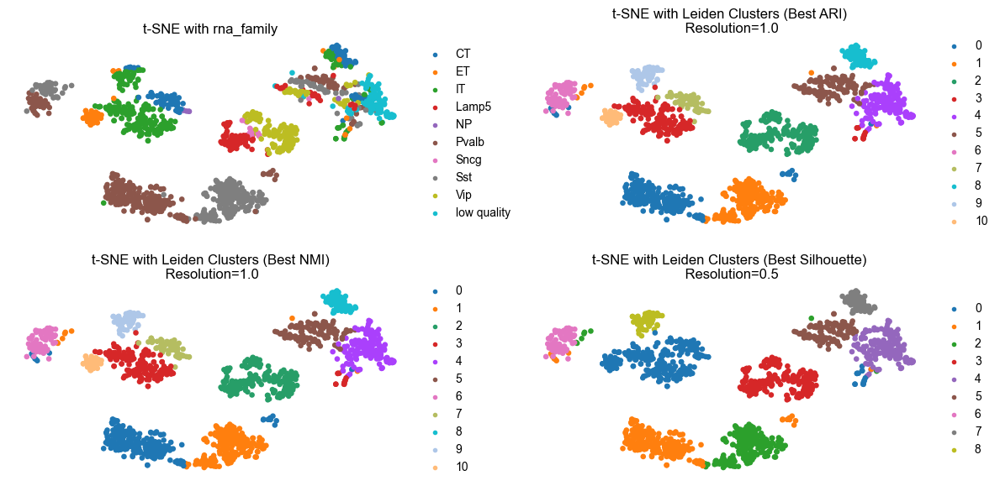

In [ ]:
########### MARCO VERSION #########

# Define parameter ranges
n_neighbors_list = [10, 20, 30, 40, 50]
resolution_list = [0.1, 0.3, 0.5, 1.0, 1.5, 2.0]

# Data preparation
adata = sc.AnnData(TMM_log)
adata.obs["rna_type"] = pd.Categorical(rna_type)
adata.obs["rna_family"] = pd.Categorical(meta["RNA family"])

# Store results
results = []

for n_neighbors in n_neighbors_list:
    for resolution in resolution_list:
        # Perform PCA
        sc.tl.pca(adata, n_comps=50)

        # Compute neighborhood graph
        sc.pp.neighbors(adata, n_neighbors=int(n_neighbors), n_pcs=50)

        # Perform Leiden clustering
        sc.tl.leiden(adata, resolution=resolution)

        # Compute t-SNE for visualization
        sc.tl.tsne(adata, perplexity=30, early_exaggeration=1)

        # Compute silhouette score
        silhouette_avg = silhouette_score(
            adata.obsm["X_tsne"], adata.obs["leiden"].astype(int)
        )

        # Compute ARI and NMI
        ari = adjusted_rand_score(
            adata.obs["rna_family"].cat.codes, adata.obs["leiden"].astype(int)
        )
        nmi = normalized_mutual_info_score(
            adata.obs["rna_family"].cat.codes, adata.obs["leiden"].astype(int)
        )

        # Store results
        results.append(
            {
                "n_neighbors": int(n_neighbors),  # Ensure it's an integer
                "resolution": resolution,
                "silhouette_score": silhouette_avg,
                "ari": ari,
                "nmi": nmi,
            }
        )

# Convert results to DataFrame for easy analysis
results_df = pd.DataFrame(results)

# Find the best and worst parameters based on each metric
best_params_ari = results_df.loc[results_df["ari"].idxmax()]
worst_params_ari = results_df.loc[results_df["ari"].idxmin()]

best_params_silhouette = results_df.loc[
    results_df["silhouette_score"].idxmax()
]
worst_params_silhouette = results_df.loc[
    results_df["silhouette_score"].idxmin()
]

best_params_nmi = results_df.loc[results_df["nmi"].idxmax()]
worst_params_nmi = results_df.loc[results_df["nmi"].idxmin()]

print("Parameters based on Best ARI:")
print(best_params_ari)

print("Parameters based on Worst ARI:")
print(worst_params_ari)

print("Parameters based on Best NMI:")
print(best_params_nmi)

print("Parameters based on Worst NMI:")
print(worst_params_nmi)

print("Parameters based on Best silhouette:")
print(best_params_silhouette)

print("Parameters based on Worst silhouette:")
print(worst_params_silhouette)


def plot_tsne_comparison(
    adata,
    params_best_ari,
    params_worst_ari,
    params_best_silhouette,
    params_worst_silhouette,
    params_best_nmi,
    params_worst_nmi,
    GT_key="rna_family",
    show_legend=True,
):
    # Extract the best parameters based on ARI
    n_neighbors_best_ari, resolution_best_ari = params_best_ari
    n_neighbors_worst_ari, resolution_worst_ari = params_worst_ari

    # Extract the best parameters based on Silhouette Score
    n_neighbors_best_silhouette, resolution_best_silhouette = (
        params_best_silhouette
    )
    n_neighbors_worst_silhouette, resolution_worst_silhouette = (
        params_worst_silhouette
    )

    # Extract the best parameters based on NMI
    n_neighbors_best_nmi, resolution_best_nmi = params_best_nmi
    n_neighbors_worst_nmi, resolution_worst_nmi = params_worst_nmi

    # Perform PCA
    sc.tl.pca(adata, n_comps=50)

    # Best ARI parameters
    sc.pp.neighbors(adata, n_neighbors=int(n_neighbors_best_ari), n_pcs=50)
    sc.tl.leiden(adata, resolution=resolution_best_ari)
    sc.tl.tsne(adata, perplexity=30, early_exaggeration=1)
    adata.obs["leiden_best_ari"] = adata.obs["leiden"]

    # Worst ARI parameters
    sc.pp.neighbors(adata, n_neighbors=int(n_neighbors_worst_ari), n_pcs=50)
    sc.tl.leiden(adata, resolution=resolution_worst_ari)
    sc.tl.tsne(adata, perplexity=30, early_exaggeration=1)
    adata.obs["leiden_worst_ari"] = adata.obs["leiden"]

    # Best Silhouette parameters
    sc.pp.neighbors(
        adata, n_neighbors=int(n_neighbors_best_silhouette), n_pcs=50
    )
    sc.tl.leiden(adata, resolution=resolution_best_silhouette)
    sc.tl.tsne(adata, perplexity=30, early_exaggeration=1)
    adata.obs["leiden_best_silhouette"] = adata.obs["leiden"]

    # Worst Silhouette parameters
    sc.pp.neighbors(
        adata, n_neighbors=int(n_neighbors_worst_silhouette), n_pcs=50
    )

    # Best NMI parameters
    sc.pp.neighbors(adata, n_neighbors=int(n_neighbors_best_nmi), n_pcs=50)
    sc.tl.leiden(adata, resolution=resolution_best_nmi)
    sc.tl.tsne(adata, perplexity=30, early_exaggeration=1)
    adata.obs["leiden_best_nmi"] = adata.obs["leiden"]

    # Worst NMI parameters
    sc.pp.neighbors(adata, n_neighbors=int(n_neighbors_worst_nmi), n_pcs=50)

    # Create a figure with four subplots
    fig, axes = plt.subplots(2, 2, figsize=(12, 6))

    # Plot t-SNE with RNA family
    sc.pl.tsne(
        adata,
        color=[GT_key],
        title=f"t-SNE with {GT_key}",
        ax=axes[0, 0],
        show=False,
    )
    axes[0, 0].axis("off")
    if show_legend == False:
        axes[0, 0].get_legend().remove()

    # Plot t-SNE with best ARI Leiden clusters
    sc.pl.tsne(
        adata,
        color=["leiden_best_ari"],
        title=f"t-SNE with Leiden Clusters (Best ARI)\n Resolution={resolution_best_ari}",
        ax=axes[0, 1],
        show=False,
    )
    axes[0, 1].axis("off")
    if show_legend == False:
        axes[0, 1].get_legend().remove()

    # Plot t-SNE with worst ARI Leiden clusters
    sc.pl.tsne(
        adata,
        color=["leiden_best_nmi"],
        title=f"t-SNE with Leiden Clusters (Best NMI)\n Resolution={resolution_best_nmi}",
        ax=axes[1, 0],
        show=False,
    )
    axes[1, 0].axis("off")
    if show_legend == False:
        axes[1, 0].get_legend().remove()

    # Plot t-SNE with best Silhouette Leiden clusters
    sc.pl.tsne(
        adata,
        color=["leiden_best_silhouette"],
        title=f"t-SNE with Leiden Clusters (Best Silhouette)\n Resolution={resolution_best_silhouette}",
        ax=axes[1, 1],
        show=False,
    )
    axes[1, 1].axis("off")
    if show_legend == False:
        axes[1, 1].get_legend().remove()

    # Adjust layout to make room for titles
    plt.tight_layout()
    plt.show()


# Plot the t-SNE visualizations for the best and worst parameter settings based on ARI and Silhouette Score
plot_tsne_comparison(
    adata,
    (best_params_ari["n_neighbors"], best_params_ari["resolution"]),
    (worst_params_ari["n_neighbors"], worst_params_ari["resolution"]),
    (
        best_params_silhouette["n_neighbors"],
        best_params_silhouette["resolution"],
    ),
    (
        worst_params_silhouette["n_neighbors"],
        worst_params_silhouette["resolution"],
    ),
    (best_params_nmi["n_neighbors"], best_params_nmi["resolution"]),
    (worst_params_nmi["n_neighbors"], worst_params_nmi["resolution"]),
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Based on the highest Adjusted Rand Index (ARI) of 0.554517 and Normalized Mutual Information (NMI) of 0.664196, Leiden Clustering predicts 11 clusters of RNA families. We also observe that both ARI and NMI are in agreement regarding the clustering, as opposed to the Silhouette score, which suggests 9 clusters.</div>

#### 4.1.1.2 GMM Clustering of RNA Famlies

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
In the subsequent analysis, we continue to employ ARI and NMI as extrinsic metrics. However, for intrinsic evaluation, we now utilize the Bayesian Information Criterion (BIC) instead of the silhouette score for model selection, in accordance with standard practices in the literature. While BIC is the most common metric in Gaussian Mixture Models (GMM), in clustering tasks where the goal is to match known labels as closely as possible, ARI and NMI are typically more relevant. Therefore, we fine-tuned our GMM model based on ARI and NMI, but also explored the lowest BIC for comparison.
</div>

Parameters based on Best BIC:
n_components         4.000000
bic             482525.658700
ari                  0.249846
nmi                  0.355232
Name: 2, dtype: float64
Parameters based on Best ARI:
n_components         6.000000
bic             490482.847841
ari                  0.438147
nmi                  0.532315
Name: 4, dtype: float64
Parameters based on Best NMI:
n_components         6.000000
bic             490482.847841
ari                  0.438147
nmi                  0.532315
Name: 4, dtype: float64


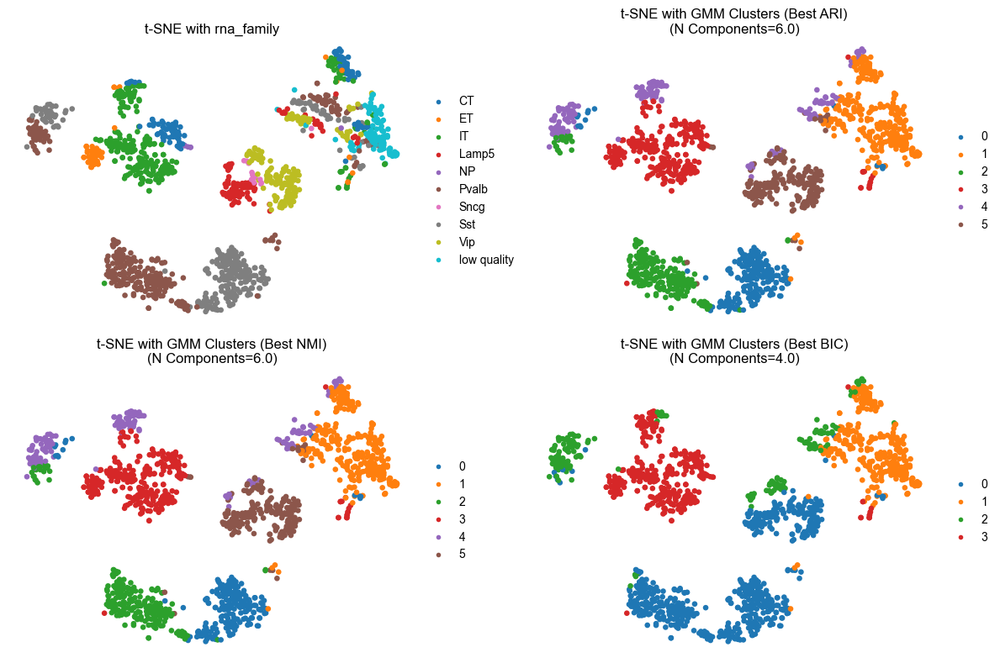

In [ ]:
# Define the range of components to test
n_components_list = range(2, 11)  # Since we have 10 RNA families

# Data preparation
adata = sc.AnnData(TMM_log)
adata.obs["rna_type"] = pd.Categorical(rna_type)
adata.obs["rna_family"] = pd.Categorical(meta["RNA family"])

# Perform PCA for GMM input
sc.tl.pca(adata, n_comps=50)
pca_data = adata.obsm["X_pca"]

# Store results
gmm_results = []

for n_components in n_components_list:
    # Fit GMM
    gmm = GaussianMixture(n_components=int(n_components), random_state=0)
    gmm.fit(pca_data)

    # Compute BIC
    bic = gmm.bic(pca_data)

    # Predict labels
    gmm_labels = gmm.predict(pca_data)

    # Compute ARI and NMI
    ari = adjusted_rand_score(adata.obs["rna_family"].cat.codes, gmm_labels)
    nmi = normalized_mutual_info_score(
        adata.obs["rna_family"].cat.codes, gmm_labels
    )

    # Store results
    gmm_results.append(
        {"n_components": int(n_components), "bic": bic, "ari": ari, "nmi": nmi}
    )

# Convert results to DataFrame for easy analysis
gmm_results_df = pd.DataFrame(gmm_results)

# Find the best parameters based on BIC, ARI, and NMI
best_gmm_bic = gmm_results_df.loc[gmm_results_df["bic"].idxmin()]
best_gmm_ari = gmm_results_df.loc[gmm_results_df["ari"].idxmax()]
best_gmm_nmi = gmm_results_df.loc[gmm_results_df["nmi"].idxmax()]

print("Parameters based on Best BIC:")
print(best_gmm_bic)

print("Parameters based on Best ARI:")
print(best_gmm_ari)

print("Parameters based on Best NMI:")
print(best_gmm_nmi)

# Fit GMM with the best number of components based on ARI
best_n_components_ari = int(best_gmm_ari["n_components"])
gmm_best_ari = GaussianMixture(
    n_components=best_n_components_ari, random_state=0
)
gmm_best_ari_labels = gmm_best_ari.fit_predict(pca_data)

# Add GMM clustering results to the adata object
adata.obs["Best ARI"] = pd.Categorical(gmm_best_ari_labels)

# Fit GMM with the best number of components based on NMI
best_n_components_nmi = int(best_gmm_nmi["n_components"])
gmm_best_nmi = GaussianMixture(
    n_components=best_n_components_nmi, random_state=0
)
gmm_best_nmi_labels = gmm_best_nmi.fit_predict(pca_data)

# Add GMM clustering results to the adata object
adata.obs["Best NMI"] = pd.Categorical(gmm_best_nmi_labels)

# Fit GMM with the best number of components based on BIC
best_n_components_bic = int(best_gmm_bic["n_components"])
gmm_best_bic = GaussianMixture(
    n_components=best_n_components_bic, random_state=0
)
gmm_best_bic_labels = gmm_best_bic.fit_predict(pca_data)

# Add GMM clustering results to the adata object
adata.obs["Best BIC"] = pd.Categorical(gmm_best_bic_labels)


# Visualize the t-SNE results with the best GMM clustering based on ARI, NMI, and BIC
def plot_tsne_comparison_gmm_all(
    adata,
    best_params_ari,
    best_params_nmi,
    best_params_bic,
    GT_key="rna_family",
    plot_legend=False,
):
    # Perform t-SNE
    sc.pp.neighbors(adata, use_rep="X_pca", n_neighbors=15)
    sc.tl.tsne(adata, perplexity=30, early_exaggeration=1)

    # Create a figure with two subplots
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))

    # Plot t-SNE with RNA family
    sc.pl.tsne(
        adata,
        color=[GT_key],
        title=f"t-SNE with {GT_key}",
        ax=axes[0, 0],
        show=False,
    )
    axes[0, 0].axis("off")

    if plot_legend == False:
        axes[0, 0].get_legend().remove()

    # Plot t-SNE with best GMM clusters based on ARI
    sc.pl.tsne(
        adata,
        color=["Best ARI"],
        title=f"t-SNE with GMM Clusters (Best ARI)\n(N Components={best_params_ari['n_components']})",
        ax=axes[0, 1],
        show=False,
    )
    axes[0, 1].axis("off")

    if plot_legend == False:
        axes[0, 1].get_legend().remove()

    sc.pl.tsne(
        adata,
        color=["Best NMI"],
        title=f"t-SNE with GMM Clusters (Best NMI)\n(N Components={best_params_nmi['n_components']})",
        ax=axes[1, 0],
        show=False,
    )
    axes[1, 0].axis("off")

    if plot_legend == False:
        axes[1, 0].get_legend().remove()

    sc.pl.tsne(
        adata,
        color=["Best BIC"],
        title=f"t-SNE with GMM Clusters (Best BIC)\n(N Components={best_params_bic['n_components']})",
        ax=axes[1, 1],
        show=False,
    )
    axes[1, 1].axis("off")

    if plot_legend == False:
        axes[1, 1].get_legend().remove()

    plt.tight_layout()
    plt.show()


# Plot the t-SNE visualizations for the best GMM clustering based on ARI, NMI, and BIC
plot_tsne_comparison_gmm_all(
    adata,
    best_gmm_ari,
    best_gmm_nmi,
    best_gmm_bic,
    GT_key="rna_family",
    plot_legend=True,
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Comparing the Adjusted Rand Index (ARI) and Normalized Mutual Information (NMI) for the Leiden and Gaussian Mixture Model (GMM) clustering algorithms reveals that GMM performs worse. The ARI and NMI values for GMM are 0.438147 and 0.532315, respectively, whereas the ARI and NMI values for Leiden are 0.554517 and 0.664196. This suggests that the Leiden algorithm is more effective in accurately identifying cluster structures in our dataset.</div>

#### 4.1.2 Subclustering of RNA Families by RNA Types

#### 4.1.2.1 Leiden subclustering of RNA Families

Best parameters based on ARI:
unique_clusters    40.000000
n_neighbors        10.000000
resolution          4.000000
silhouette          0.309783
ari                 0.272774
nmi                 0.598695
Name: 15, dtype: float64
Worst parameters based on ARI:
unique_clusters    81.000000
n_neighbors        10.000000
resolution         12.000000
silhouette          0.264841
ari                 0.182684
nmi                 0.611268
Name: 55, dtype: float64
Best parameters based on NMI:
unique_clusters    73.000000
n_neighbors        10.000000
resolution         10.000000
silhouette          0.266875
ari                 0.197926
nmi                 0.614896
Name: 45, dtype: float64
Worst parameters based on NMI:
unique_clusters    10.000000
n_neighbors        50.000000
resolution          1.000000
silhouette          0.477019
ari                 0.198779
nmi                 0.469533
Name: 4, dtype: float64
Best parameters based on silhouette:
unique_clusters    10.000000
n_neighbors      

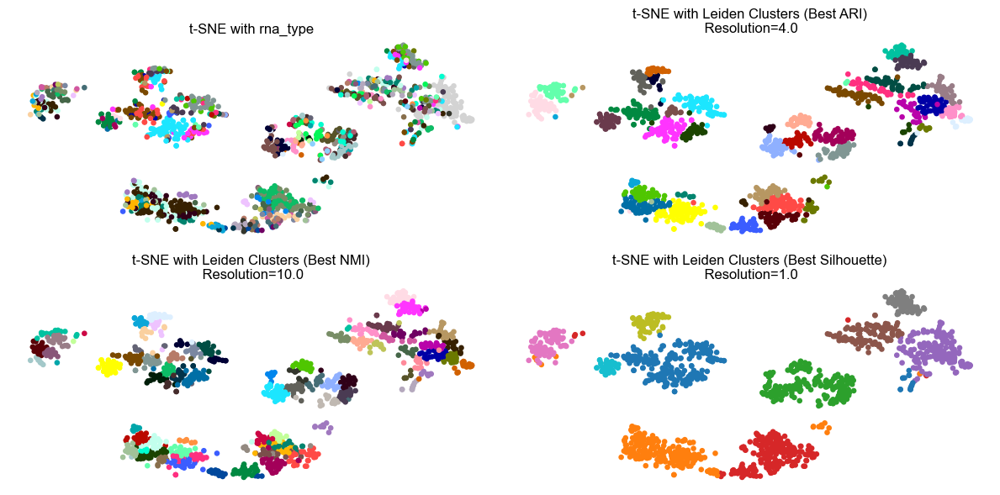

In [ ]:
adata = sc.AnnData(TMM_log)
adata.obs["rna_type"] = pd.Categorical(rna_type)
adata.obs["rna_family"] = pd.Categorical(meta["RNA family"])

# Here we chose the resolution list such that we would get a number of clusters algined to the number of rna types (88)
# therefore we pruned the resolutions list such that we dont get more that 88 clusters for any combination of resultion
# and number of neighbors
resolution_list = np.arange(1.0, 13.0)  # Our prunned resolution list
n_neighbors_list = [10, 20, 30, 40, 50]
leiden_results = []


for resolution in resolution_list:
    for nn in n_neighbors_list:
        # print(resolution)
        # Perform PCA
        sc.tl.pca(adata, n_comps=50)

        # Compute neighborhood graph
        sc.pp.neighbors(adata, n_neighbors=int(nn), n_pcs=50)

        # Perform Leiden clustering
        sc.tl.leiden(adata, resolution=resolution)

        # Compute t-SNE for visualization
        sc.tl.tsne(adata, perplexity=30, early_exaggeration=1)

        # Compute silhouette score
        silhouette_avg = silhouette_score(
            adata.obsm["X_tsne"], adata.obs["leiden"].astype(int)
        )

        # Compute ARI and NMI
        ari = adjusted_rand_score(
            adata.obs["rna_type"].cat.codes, adata.obs["leiden"].astype(int)
        )
        nmi = normalized_mutual_info_score(
            adata.obs["rna_type"].cat.codes, adata.obs["leiden"].astype(int)
        )

        leiden_results.append(
            {
                "unique_clusters": len(
                    np.unique(adata.obs["leiden"].astype(int))
                ),
                "n_neighbors": nn,
                "resolution": int(resolution),
                "silhouette": silhouette_avg,
                "ari": ari,
                "nmi": nmi,
            }
        )

# Convert results to DataFrame for easy analysis
leiden_results_df = pd.DataFrame(leiden_results)

# Find the best parameters based on BIC, ARI, and NMI
best_params_ari = leiden_results_df.loc[leiden_results_df["ari"].idxmax()]
worst_params_ari = leiden_results_df.loc[leiden_results_df["ari"].idxmin()]

best_params_silhouette = leiden_results_df.loc[
    leiden_results_df["silhouette"].idxmax()
]
worst_params_silhouette = leiden_results_df.loc[
    leiden_results_df["silhouette"].idxmin()
]

best_params_nmi = leiden_results_df.loc[leiden_results_df["nmi"].idxmax()]
worst_params_nmi = leiden_results_df.loc[leiden_results_df["nmi"].idxmin()]

print("Best parameters based on ARI:")
print(best_params_ari)

print("Worst parameters based on ARI:")
print(worst_params_ari)

print("Best parameters based on NMI:")
print(best_params_nmi)

print("Worst parameters based on NMI:")
print(worst_params_nmi)

print("Best parameters based on silhouette:")
print(best_params_silhouette)

print("Worst parameters based on silhouette:")
print(worst_params_silhouette)

plot_tsne_comparison(
    adata,
    (best_params_ari["n_neighbors"], best_params_ari["resolution"]),
    (worst_params_ari["n_neighbors"], worst_params_ari["resolution"]),
    (
        best_params_silhouette["n_neighbors"],
        best_params_silhouette["resolution"],
    ),
    (
        worst_params_silhouette["n_neighbors"],
        worst_params_silhouette["resolution"],
    ),
    (best_params_nmi["n_neighbors"], best_params_nmi["resolution"]),
    (worst_params_nmi["n_neighbors"], worst_params_nmi["resolution"]),
    GT_key="rna_type",
    show_legend=False,
)

#### 4.1.2.2 GMM subclustering of RNA Families

Parameters based on Best BIC:
n_components        60.000000
bic             416285.277028
ari                  0.140117
nmi                  0.528550
Name: 58, dtype: float64
Parameters based on Best ARI:
n_components         6.000000
bic             490482.847841
ari                  0.438147
nmi                  0.532315
Name: 4, dtype: float64
Parameters based on Best NMI:
n_components        30.000000
bic             506743.906221
ari                  0.273573
nmi                  0.567682
Name: 28, dtype: float64


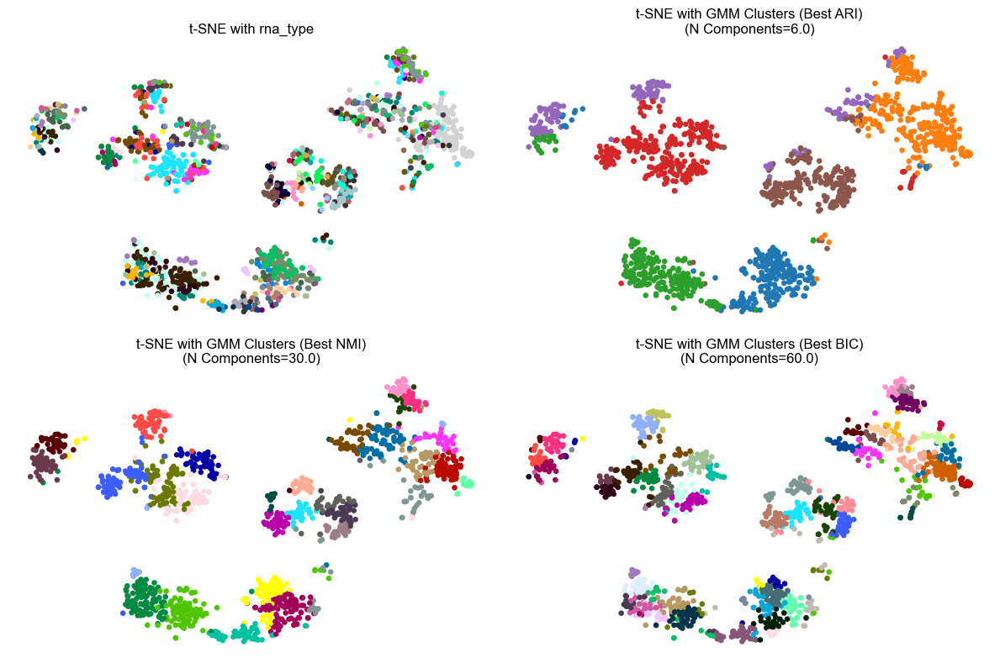

In [ ]:
n_components_list = range(2, 89)  # Since we have 88 RNA Types

# Data preparation
adata = sc.AnnData(TMM_log)
adata.obs["rna_type"] = pd.Categorical(rna_type)
adata.obs["rna_family"] = pd.Categorical(meta["RNA family"])

# Perform PCA for GMM input
sc.tl.pca(adata, n_comps=50)
pca_data = adata.obsm["X_pca"]

# Store results
gmm_results = []

for n_components in n_components_list:
    # Fit GMM
    gmm = GaussianMixture(n_components=int(n_components), random_state=0)
    gmm.fit(pca_data)

    # Compute BIC
    bic = gmm.bic(pca_data)

    # Predict labels
    gmm_labels = gmm.predict(pca_data)

    # Compute ARI and NMI
    ari = adjusted_rand_score(adata.obs["rna_family"].cat.codes, gmm_labels)
    nmi = normalized_mutual_info_score(
        adata.obs["rna_family"].cat.codes, gmm_labels
    )

    # Store results
    gmm_results.append(
        {"n_components": int(n_components), "bic": bic, "ari": ari, "nmi": nmi}
    )

# Convert results to DataFrame for easy analysis
gmm_results_df = pd.DataFrame(gmm_results)

# Find the best parameters based on BIC, ARI, and NMI
best_gmm_bic = gmm_results_df.loc[gmm_results_df["bic"].idxmin()]
best_gmm_ari = gmm_results_df.loc[gmm_results_df["ari"].idxmax()]
best_gmm_nmi = gmm_results_df.loc[gmm_results_df["nmi"].idxmax()]

print("Parameters based on Best BIC:")
print(best_gmm_bic)

print("Parameters based on Best ARI:")
print(best_gmm_ari)

print("Parameters based on Best NMI:")
print(best_gmm_nmi)


# Add clustering results for the best ARI, NMI, and BIC parameters to the adata object
# Best ARI
best_n_components_ari = int(best_gmm_ari["n_components"])
gmm_best_ari = GaussianMixture(
    n_components=best_n_components_ari, random_state=0
)
gmm_best_ari_labels = gmm_best_ari.fit_predict(pca_data)
adata.obs["Best ARI"] = pd.Categorical(gmm_best_ari_labels)

# Best NMI
best_n_components_nmi = int(best_gmm_nmi["n_components"])
gmm_best_nmi = GaussianMixture(
    n_components=best_n_components_nmi, random_state=0
)
gmm_best_nmi_labels = gmm_best_nmi.fit_predict(pca_data)
adata.obs["Best NMI"] = pd.Categorical(gmm_best_nmi_labels)

# Best BIC
best_n_components_bic = int(best_gmm_bic["n_components"])
gmm_best_bic = GaussianMixture(
    n_components=best_n_components_bic, random_state=0
)
gmm_best_bic_labels = gmm_best_bic.fit_predict(pca_data)
adata.obs["Best BIC"] = pd.Categorical(gmm_best_bic_labels)

plot_tsne_comparison_gmm_all(
    adata,
    best_gmm_ari,
    best_gmm_nmi,
    best_gmm_bic,
    GT_key="rna_type",
    plot_legend=False,
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
<strong>Here we note that, </strong>When selecting models based on the Bayesian Information Criterion (BIC), we observe a low Adjusted Rand Index (ARI) score but a relatively higher Normalized Mutual Information (NMI) score. This indicates that the number of clusters (n_components) chosen using BIC maintains the overall structure of the clustering by RNA type fairly well, as a significant amount of mutual information is shared between the ground truth labels and the labels inferred by the Gaussian Mixture Model (GMM). However, the low ARI score suggests that the exact pairwise labelings of the samples are often incorrect. We hypothesize that excluding the the low quality cluster of RNA types could improve the results.</div>

#### 4.1.3 Negative Binomial Model

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
In the following, we implement a Negative Binomial Mixture Model, with code adapted from Harris et al. (2018). Unlike the hard assignments proposed by Harris et al., our implementation utilizes a soft class assignment approach. This modification addresses the need to account for uncertainty and ambiguity in cluster membership, enabling a more nuanced representation of data points that may belong to multiple clusters with varying probabilities. Our algorithm was executed <strong>twice</strong>, once with K-means initialization and once with hierarchical clustering initialization.</div>

#### 4.1.3.1 Algorithm Design

In [ ]:
###### K-MEANS CLUSTERING AS INITIALIZATION STRATEGY #####
def upper_bound_prob(p):
    p_new = np.zeros_like(p, dtype=float)
    for k, cluster in enumerate(p):
        for g, prob in enumerate(cluster):
            p_new[k, g] = min(1.0, prob)
    return p_new


def E_step(data, p, n_clusters, pis, r=2):
    m_L = np.ones((n_clusters, data.shape[0]))
    epsilon = 1e-9

    log_p = np.log(upper_bound_prob(p + epsilon))
    log_one_minus_p = np.log(1 - upper_bound_prob(p) + epsilon)

    for nc in range(n_clusters):
        log_p_dp = data @ log_p[nc]
        log_one_minus_p_sum = np.nansum(r * log_one_minus_p[nc])

        log_pis = np.log(pis[nc] + epsilon)
        m_L[nc] = log_p_dp + log_one_minus_p_sum + log_pis

    # normalize likelihoods
    m_L = m_L - logsumexp(m_L, axis=0)
    # compute soft cluster assignments for each data point
    responsibilities = np.exp(m_L)
    return responsibilities


def M_step(data, resps, n_clusters, r=2):

    cluster_counts = resps.sum(axis=1)

    mu = np.zeros((len(cluster_counts), data.shape[1]))
    A = 1e-4 * np.ones(data.shape[1])
    B = 1

    for i in range(len(cluster_counts)):
        # get MLE of mean
        mu[i] = ((data.T @ resps[i] + 1)) / (cluster_counts[i] + 1)
    # use MLE of mean to compute new parameters for Negative binomial likelihood
    p = mu / (r + mu)
    np.clip(p, 0.0, 1.0, out=p)

    pis = cluster_counts / data.shape[0]
    cluster_assignment = np.argmax(resps, axis=0)

    return p, pis, cluster_assignment


def NB_mixture_model(data, n_iters, n_clusters, r=2, random_seed=42):
    # k-means init
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_seed)
    kmeans.fit(data)
    mu = kmeans.cluster_centers_

    # compute first MLE of parameter to be inferred
    p = mu / (r + mu)
    np.clip(p, 0.0, 1.0, out=p)

    pis = np.array([1 / n_clusters] * n_clusters)

    # Using tqdm to show progress
    for step in tqdm(range(n_iters), desc="Iterations", ascii=True):
        cluster_assignment = E_step(data, p, n_clusters, pis)
        p, pis, cluster_assignment = M_step(
            data, cluster_assignment, n_clusters, r
        )

    return cluster_assignment

In [ ]:
###### HEIRARCHIAL CLUSTERING AS ALTERNATIVE INITIALIZATION STRATEGY #####
def upper_bound_prob(p):
    p_new = np.zeros_like(p, dtype=float)
    for k, cluster in enumerate(p):
        for g, prob in enumerate(cluster):
            p_new[k, g] = min(1.0, prob)
    return p_new


def E_step(data, p, n_clusters, pis, r=2):
    m_L = np.ones((n_clusters, data.shape[0]))
    epsilon = 1e-9

    log_p = np.log(upper_bound_prob(p + epsilon))
    log_one_minus_p = np.log(1 - upper_bound_prob(p) + epsilon)

    for nc in range(n_clusters):
        log_p_dp = data @ log_p[nc]
        log_one_minus_p_sum = np.nansum(r * log_one_minus_p[nc])

        log_pis = np.log(pis[nc] + epsilon)
        m_L[nc] = log_p_dp + log_one_minus_p_sum + log_pis

    # normalize likelihoods
    m_L = m_L - logsumexp(m_L, axis=0)
    # compute soft cluster assignments for each data point
    responsibilities = np.exp(m_L)
    return responsibilities


def M_step(data, resps, n_clusters, r=2):
    cluster_counts = resps.sum(axis=1)

    mu = np.zeros((len(cluster_counts), data.shape[1]))
    for i in range(len(cluster_counts)):
        # get MLE of mean
        mu[i] = ((data.T @ resps[i] + 1)) / (cluster_counts[i] + 1)
    # use MLE of mean to compute new parameters for Negative binomial likelihood
    p = mu / (r + mu)
    np.clip(p, 0.0, 1.0, out=p)

    pis = cluster_counts / data.shape[0]
    cluster_assignment = np.argmax(resps, axis=0)

    return p, pis, cluster_assignment


def NB_mixture_model(data, n_iters, n_clusters, r=2, random_seed=42):
    # Improved initialization using hierarchical clustering
    from sklearn.cluster import AgglomerativeClustering

    # Hierarchical clustering for better initialization
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters)
    initial_labels = hierarchical.fit_predict(data)
    mu = np.array(
        [data[initial_labels == i].mean(axis=0) for i in range(n_clusters)]
    )

    # Compute initial parameters
    p = mu / (r + mu)
    np.clip(p, 0.0, 1.0, out=p)
    pis = np.array([1 / n_clusters] * n_clusters)

    # Using tqdm to show progress
    for step in tqdm(range(n_iters), desc="Iterations", ascii=True):
        cluster_assignment = E_step(data, p, n_clusters, pis)
        p, pis, cluster_assignment = M_step(
            data, cluster_assignment, n_clusters, r
        )
    return cluster_assignment

#### 4.1.3.2 Algorithm Testing on Toy Data

Iterations: 100%|############################| 100/100 [00:00<00:00, 795.96it/s]


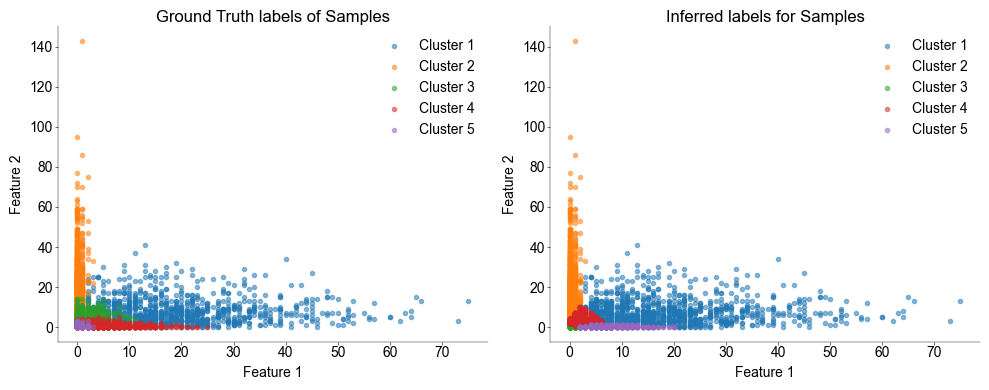

In [ ]:
def sample_bivariate_negative_binomial(n_samples, p1, p2):
    samples_dim1 = np.random.negative_binomial(2, p1, n_samples)
    samples_dim2 = np.random.negative_binomial(2, p2, n_samples)
    samples = np.column_stack((samples_dim1, samples_dim2))
    return samples


# Define parameters
n_samples = 1000
p = [(0.1, 0.2), (0.9, 0.1), (0.5, 0.4), (0.3, 0.8), (0.9, 0.9)]

# Generate samples for the 5 clusters
all_samples = np.zeros((len(p) * 1000, 2))
for idx, (p1, p2) in enumerate(p):
    samples = sample_bivariate_negative_binomial(n_samples, p1, p2)
    if idx < len(p) - 1:
        all_samples[idx * 1000 : (idx + 1) * 1000] = samples
    else:
        all_samples[-1000:] = samples

# Assuming NB_mixture_model is defined elsewhere and returns labels for the samples
labels = NB_mixture_model(all_samples, 100, 5, r=2, random_seed=42)

fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Labels for each cluster
labels_legend = [f"Cluster {i+1}" for i in range(len(p))]

# Ground Truth labels of Samples
for i in range(len(p)):
    if i < len(p) - 1:
        axs[0].scatter(
            all_samples[i * 1000 : (i + 1) * 1000, 0],
            all_samples[i * 1000 : (i + 1) * 1000, 1],
            alpha=0.5,
            label=labels_legend[i],
        )
    else:
        axs[0].scatter(
            all_samples[-1000:, 0],
            all_samples[-1000:, 1],
            alpha=0.5,
            label=labels_legend[i],
        )
axs[0].set_title("Ground Truth labels of Samples")
axs[0].set_xlabel("Feature 1")
axs[0].set_ylabel("Feature 2")
axs[0].legend()

# Inferred labels for Samples
for i in range(len(p)):
    indices = np.where(labels == i)
    cluster_samples = np.take(all_samples, indices, axis=0).reshape(-1, 2)
    axs[1].scatter(
        cluster_samples[:, 0],
        cluster_samples[:, 1],
        label=labels_legend[i],
        alpha=0.5,
    )
axs[1].set_title("Inferred labels for Samples")
axs[1].set_xlabel("Feature 1")
axs[1].set_ylabel("Feature 2")
axs[1].legend()

plt.tight_layout()
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;"><strong>Visual inspection suggests that</strong> our Negative Binomial Mixture Model performs well on the generated toy data with both initialization strategies. This is evidenced by the distinct clustering patterns observed, although the label colors do not consistently match across different plots. We only present the results from the K-means initialization, as there was no observable superiority in performance between the two methods on our toy data. Nonetheless, we proceeded with implementing our NB model on the transcriptomics data using both initialization techniques.</div>

#### 4.1.3.3 Fit Negative Binomial on our Transcriptomics Data

2


Iterations: 100%|##########################| 1000/1000 [00:01<00:00, 674.70it/s]


3


Iterations: 100%|##########################| 1000/1000 [00:01<00:00, 937.86it/s]


4


Iterations: 100%|##########################| 1000/1000 [00:01<00:00, 637.46it/s]


5


Iterations: 100%|##########################| 1000/1000 [00:01<00:00, 648.76it/s]


6


Iterations: 100%|##########################| 1000/1000 [00:01<00:00, 630.60it/s]


7


Iterations: 100%|##########################| 1000/1000 [00:01<00:00, 613.43it/s]


8


Iterations: 100%|##########################| 1000/1000 [00:01<00:00, 576.73it/s]


9


Iterations: 100%|##########################| 1000/1000 [00:01<00:00, 510.39it/s]


10


Iterations: 100%|##########################| 1000/1000 [00:03<00:00, 311.25it/s]


11


Iterations: 100%|##########################| 1000/1000 [00:02<00:00, 334.15it/s]


12


Iterations: 100%|##########################| 1000/1000 [00:03<00:00, 310.66it/s]


13


Iterations: 100%|##########################| 1000/1000 [00:03<00:00, 321.25it/s]


14


Iterations: 100%|##########################| 1000/1000 [00:03<00:00, 322.18it/s]


15


Iterations: 100%|##########################| 1000/1000 [00:03<00:00, 282.94it/s]


16


Iterations: 100%|##########################| 1000/1000 [00:03<00:00, 266.36it/s]


17


Iterations: 100%|##########################| 1000/1000 [00:03<00:00, 263.71it/s]


18


Iterations: 100%|##########################| 1000/1000 [00:04<00:00, 219.19it/s]


19


Iterations: 100%|##########################| 1000/1000 [00:04<00:00, 238.39it/s]


20


Iterations: 100%|##########################| 1000/1000 [00:04<00:00, 226.83it/s]


21


Iterations: 100%|##########################| 1000/1000 [00:05<00:00, 177.16it/s]


22


Iterations: 100%|##########################| 1000/1000 [00:05<00:00, 187.04it/s]


23


Iterations: 100%|##########################| 1000/1000 [00:05<00:00, 197.90it/s]


24


Iterations: 100%|##########################| 1000/1000 [00:05<00:00, 179.60it/s]


25


Iterations: 100%|##########################| 1000/1000 [00:05<00:00, 175.13it/s]


26


Iterations: 100%|##########################| 1000/1000 [00:05<00:00, 176.13it/s]


27


Iterations: 100%|##########################| 1000/1000 [00:05<00:00, 168.46it/s]


28


Iterations: 100%|##########################| 1000/1000 [00:07<00:00, 136.76it/s]


29


Iterations: 100%|##########################| 1000/1000 [00:06<00:00, 149.30it/s]


30


Iterations: 100%|##########################| 1000/1000 [00:06<00:00, 157.37it/s]


31


Iterations: 100%|##########################| 1000/1000 [00:06<00:00, 153.14it/s]


32


Iterations: 100%|##########################| 1000/1000 [00:07<00:00, 137.41it/s]


33


Iterations: 100%|##########################| 1000/1000 [00:07<00:00, 138.36it/s]


34


Iterations: 100%|##########################| 1000/1000 [00:07<00:00, 133.55it/s]


35


Iterations: 100%|##########################| 1000/1000 [00:07<00:00, 135.61it/s]


36


Iterations: 100%|##########################| 1000/1000 [00:07<00:00, 128.81it/s]


37


Iterations: 100%|##########################| 1000/1000 [00:07<00:00, 129.96it/s]


38


Iterations: 100%|##########################| 1000/1000 [00:08<00:00, 120.08it/s]


39


Iterations: 100%|##########################| 1000/1000 [00:08<00:00, 118.05it/s]


40


Iterations: 100%|##########################| 1000/1000 [00:09<00:00, 101.67it/s]


41


Iterations: 100%|###########################| 1000/1000 [00:11<00:00, 90.11it/s]


42


Iterations: 100%|##########################| 1000/1000 [00:08<00:00, 113.57it/s]


43


Iterations: 100%|##########################| 1000/1000 [00:08<00:00, 111.62it/s]


44


Iterations: 100%|##########################| 1000/1000 [00:08<00:00, 113.47it/s]


45


Iterations: 100%|##########################| 1000/1000 [00:09<00:00, 108.44it/s]


46


Iterations: 100%|##########################| 1000/1000 [00:09<00:00, 101.32it/s]


47


Iterations: 100%|###########################| 1000/1000 [00:11<00:00, 87.24it/s]


48


Iterations: 100%|###########################| 1000/1000 [00:12<00:00, 80.99it/s]


49


Iterations: 100%|###########################| 1000/1000 [00:10<00:00, 91.84it/s]


50


Iterations: 100%|###########################| 1000/1000 [00:11<00:00, 90.76it/s]


51


Iterations: 100%|###########################| 1000/1000 [00:11<00:00, 85.70it/s]


52


Iterations: 100%|###########################| 1000/1000 [00:11<00:00, 84.44it/s]


53


Iterations: 100%|###########################| 1000/1000 [00:10<00:00, 91.65it/s]


54


Iterations: 100%|###########################| 1000/1000 [00:14<00:00, 70.32it/s]


55


Iterations: 100%|###########################| 1000/1000 [00:13<00:00, 71.63it/s]


56


Iterations: 100%|###########################| 1000/1000 [00:11<00:00, 83.64it/s]


57


Iterations: 100%|###########################| 1000/1000 [00:11<00:00, 83.46it/s]


58


Iterations: 100%|###########################| 1000/1000 [00:13<00:00, 76.08it/s]


59


Iterations: 100%|###########################| 1000/1000 [00:15<00:00, 65.99it/s]


60


Iterations: 100%|###########################| 1000/1000 [00:16<00:00, 60.66it/s]


61


Iterations: 100%|###########################| 1000/1000 [00:15<00:00, 66.45it/s]


62


Iterations: 100%|###########################| 1000/1000 [00:16<00:00, 61.94it/s]


63


Iterations: 100%|###########################| 1000/1000 [00:14<00:00, 66.97it/s]


64


Iterations: 100%|###########################| 1000/1000 [00:16<00:00, 59.29it/s]


65


Iterations: 100%|###########################| 1000/1000 [00:15<00:00, 62.51it/s]


66


Iterations: 100%|###########################| 1000/1000 [00:17<00:00, 56.13it/s]


67


Iterations: 100%|###########################| 1000/1000 [00:16<00:00, 61.45it/s]


68


Iterations: 100%|###########################| 1000/1000 [00:17<00:00, 56.03it/s]


69


Iterations: 100%|###########################| 1000/1000 [00:17<00:00, 56.12it/s]


70


Iterations: 100%|###########################| 1000/1000 [00:19<00:00, 52.57it/s]


71


Iterations: 100%|###########################| 1000/1000 [00:17<00:00, 55.96it/s]


72


Iterations: 100%|###########################| 1000/1000 [00:13<00:00, 73.02it/s]


73


Iterations: 100%|###########################| 1000/1000 [00:14<00:00, 69.76it/s]


74


Iterations: 100%|###########################| 1000/1000 [00:19<00:00, 52.45it/s]


75


Iterations: 100%|###########################| 1000/1000 [00:16<00:00, 58.86it/s]


76


Iterations: 100%|###########################| 1000/1000 [00:18<00:00, 55.05it/s]


77


Iterations: 100%|###########################| 1000/1000 [00:18<00:00, 52.72it/s]


78


Iterations: 100%|###########################| 1000/1000 [00:19<00:00, 50.35it/s]


79


Iterations: 100%|###########################| 1000/1000 [00:18<00:00, 55.53it/s]


80


Iterations: 100%|###########################| 1000/1000 [00:20<00:00, 49.88it/s]


81


Iterations: 100%|###########################| 1000/1000 [00:19<00:00, 51.49it/s]


82


Iterations: 100%|###########################| 1000/1000 [00:19<00:00, 51.89it/s]


83


Iterations: 100%|###########################| 1000/1000 [00:17<00:00, 58.28it/s]


84


Iterations: 100%|###########################| 1000/1000 [00:18<00:00, 53.93it/s]


85


Iterations: 100%|###########################| 1000/1000 [00:18<00:00, 54.00it/s]


86


Iterations: 100%|###########################| 1000/1000 [00:18<00:00, 55.48it/s]


87


Iterations: 100%|###########################| 1000/1000 [00:18<00:00, 54.76it/s]


88


Iterations: 100%|###########################| 1000/1000 [00:18<00:00, 54.64it/s]


Parameters based on best ARI:
n_components    35.000000
ari              0.157767
nmi              0.226959
Name: 33, dtype: float64
Parameters based on best NMI:
n_components    81.000000
ari              0.127274
nmi              0.254955
Name: 79, dtype: float64


Iterations: 100%|###########################| 1000/1000 [00:14<00:00, 71.38it/s]


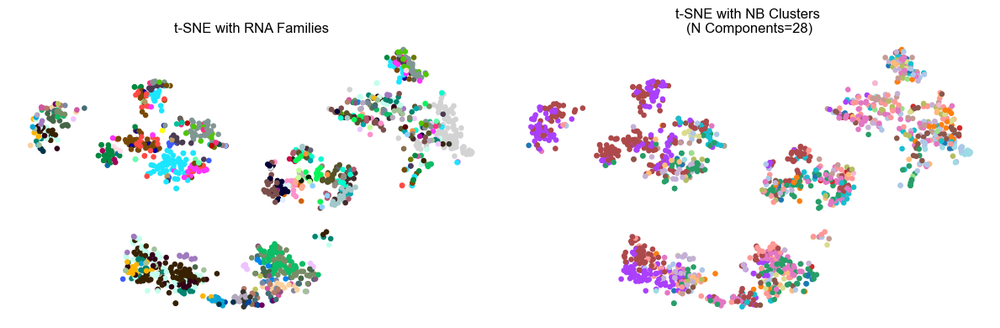

In [ ]:
n_components_list = range(2, 89)  # Since we have 88 RNA families

# Data preparation
adata = sc.AnnData(TMM_log)
adata.obs["rna_type"] = pd.Categorical(rna_type)
adata.obs["rna_family"] = pd.Categorical(meta["RNA family"])

# Perform PCA for GMM input
sc.tl.pca(adata, n_comps=50)
pca_data = adata.obsm["X_pca"]

# Store results
NBmix_results = []

for n_components in n_components_list:
    # Fit GMM
    print(n_components)
    NB_labels = NB_mixture_model(
        pca_data, 1000, n_components, r=2, random_seed=42
    )

    # Compute ARI and NMI
    ari = adjusted_rand_score(adata.obs["rna_family"].cat.codes, NB_labels)
    nmi = normalized_mutual_info_score(
        adata.obs["rna_family"].cat.codes, NB_labels
    )

    # Store results
    NBmix_results.append(
        {"n_components": int(n_components), "ari": ari, "nmi": nmi}
    )

NBmix_results_df = pd.DataFrame(NBmix_results)

# Find the best parameters based on BIC, ARI, and NMI
best_NBmix_ari = NBmix_results_df.loc[NBmix_results_df["ari"].idxmax()]
best_NBmix_nmi = NBmix_results_df.loc[NBmix_results_df["nmi"].idxmax()]

print("Parameters based on best ARI:")
print(best_NBmix_ari)

print("Parameters based on best NMI:")
print(best_NBmix_nmi)

NB_labels = NB_mixture_model(pca_data, 1000, 62, r=2, random_seed=42)

NB_labels = list(map(str, NB_labels))
adata.obs["NB_labels"] = NB_labels

# Perform t-SNE
sc.tl.tsne(adata, perplexity=30, early_exaggeration=1)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot t-SNE with RNA family
sc.pl.tsne(
    adata,
    color="rna_type",
    title="t-SNE with RNA Families",
    ax=axes[0],
    show=False,
)
axes[0].axis("off")
axes[0].get_legend().remove()

# Plot t-SNE with best GMM clusters based on ARI
sc.pl.tsne(
    adata,
    color="NB_labels",
    title=f"t-SNE with NB Clusters \n(N Components=28)",
    ax=axes[1],
    show=False,
)
axes[1].axis("off")
axes[1].get_legend().remove()
plt.tight_layout()
plt.show()

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
<strong>As observed in the ARI and NMI metrics, along with the corresponding plots,</strong> our Negative Binomial (NB) mixture model does not perform as expected on the data. Despite the dataset following a Negative Binomial distribution and testing our two different Initialization strategies, the model's performance issues remain unresolved. This may be due to factors such as suboptimal parameter settings, model specification errors, presence of low quality clusters, or issues with convergence.</div>

### 4.2 Clustering on both Transcriptomic and Ephys Data

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">Nonetheless finally, we wondered if combing both the Transcriptomics data and the Ephys data would affect the clustering results. To combine both datasets, we first standardized the TMM-normalized log-transformed Transcriptomics data then merged it with the Ephys Data (already standardized). We then proceeded to perform both Leiden and GMM clustering.</div>

#### 4.2.1 Leiden Clustering adding the Ephys Features

Genes left: 2710 out of 42466
Ratio: 0.064
Mean of combined data: 0.00036214170282336495
Standard deviation of combined data: 0.9997832147135024
Parameters based on best ARI:
n_neighbors         10.000000
resolution           0.500000
silhouette_score     0.460107
ari                  0.554521
nmi                  0.657007
Name: 2, dtype: float64
Parameters based on worst ARI:
n_neighbors         50.000000
resolution           0.100000
silhouette_score     0.480643
ari                  0.255600
nmi                  0.378991
Name: 24, dtype: float64
Parameters based on best NMI:
n_neighbors         10.000000
resolution           0.500000
silhouette_score     0.460107
ari                  0.554521
nmi                  0.657007
Name: 2, dtype: float64
Parameters based on worst NMI:
n_neighbors         50.000000
resolution           0.100000
silhouette_score     0.480643
ari                  0.255600
nmi                  0.378991
Name: 24, dtype: float64
Parameters based on best silhouette

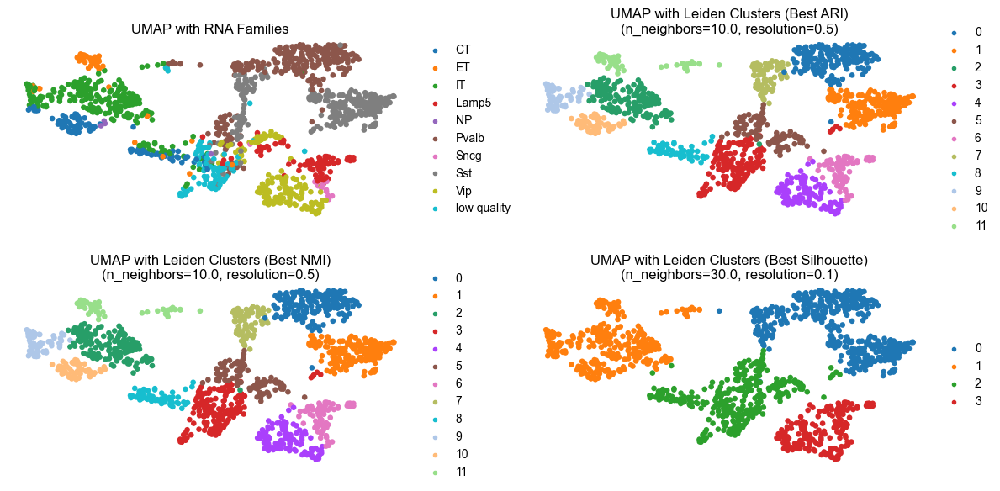

In [ ]:
TMM_log = get_log_transform(TMM_counts, TMM_fano, threshold=400)

# Calculate the mean and standard deviation for each feature (column)
means = np.mean(TMM_log, axis=0)
std_devs = np.std(TMM_log, axis=0)

# Avoid division by zero by ensuring no standard deviation is zero
# std_devs[std_devs == 0] = 1

# Standardize the TMM_log data
TMM_log_standardized = (TMM_log - means) / std_devs

TMM_log_that_has_ephys = TMM_log_standardized[keepcells]

joint_data = np.hstack((TMM_log_that_has_ephys, ephysData_filtered))

# Check scaling
print(f"Mean of combined data: {np.mean(joint_data)}")
print(f"Standard deviation of combined data: {np.std(joint_data)}")

# Define parameter ranges
n_neighbors_list = [10, 20, 30, 40, 50]
resolution_list = [0.1, 0.3, 0.5, 1.0, 1.5, 2.0]

# Data preparation
adata_medo = sc.AnnData(joint_data)
adata_medo.obs["rna_type"] = pd.Categorical(rna_type[keepcells])
adata_medo.obs["rna_family"] = pd.Categorical(meta["RNA family"][keepcells])

# Store results
results = []

for n_neighbors in n_neighbors_list:
    for resolution in resolution_list:
        # Perform PCA
        sc.tl.pca(adata_medo, n_comps=50)

        # Compute neighborhood graph
        sc.pp.neighbors(adata_medo, n_neighbors=int(n_neighbors), n_pcs=50)

        # Perform Leiden clustering
        sc.tl.leiden(adata_medo, resolution=resolution)

        # Compute UMAP for visualization
        sc.tl.umap(adata_medo)

        # Compute silhouette score
        silhouette_avg = silhouette_score(
            adata_medo.obsm["X_umap"], adata_medo.obs["leiden"].astype(int)
        )

        # Compute ARI and NMI
        ari = adjusted_rand_score(
            adata_medo.obs["rna_family"].cat.codes,
            adata_medo.obs["leiden"].astype(int),
        )
        nmi = normalized_mutual_info_score(
            adata_medo.obs["rna_family"].cat.codes,
            adata_medo.obs["leiden"].astype(int),
        )

        # Store results
        results.append(
            {
                "n_neighbors": int(n_neighbors),  # Ensure it's an integer
                "resolution": resolution,
                "silhouette_score": silhouette_avg,
                "ari": ari,
                "nmi": nmi,
            }
        )

# Convert results to DataFrame for easy analysis
results_df = pd.DataFrame(results)

# Find the best and worst parameters based on each metric
best_params_ari = results_df.loc[results_df["ari"].idxmax()]
worst_params_ari = results_df.loc[results_df["ari"].idxmin()]

best_params_silhouette = results_df.loc[
    results_df["silhouette_score"].idxmax()
]
worst_params_silhouette = results_df.loc[
    results_df["silhouette_score"].idxmin()
]

best_params_nmi = results_df.loc[results_df["nmi"].idxmax()]
worst_params_nmi = results_df.loc[results_df["nmi"].idxmin()]

print("Parameters based on best ARI:")
print(best_params_ari)

print("Parameters based on worst ARI:")
print(worst_params_ari)

print("Parameters based on best NMI:")
print(best_params_nmi)

print("Parameters based on worst NMI:")
print(worst_params_nmi)

print("Parameters based on best silhouette:")
print(best_params_silhouette)

print("Parameters based on worst silhouette:")
print(worst_params_silhouette)


def plot_umap_comparison(
    adata_medo,
    params_best_ari,
    params_worst_ari,
    params_best_silhouette,
    params_worst_silhouette,
    params_best_nmi,
    params_worst_nmi,
):
    # Extract the best parameters based on ARI
    n_neighbors_best_ari, resolution_best_ari = params_best_ari
    n_neighbors_worst_ari, resolution_worst_ari = params_worst_ari

    # Extract the best parameters based on Silhouette Score
    n_neighbors_best_silhouette, resolution_best_silhouette = (
        params_best_silhouette
    )
    n_neighbors_worst_silhouette, resolution_worst_silhouette = (
        params_worst_silhouette
    )

    # Extract the best parameters based on NMI
    n_neighbors_best_nmi, resolution_best_nmi = params_best_nmi
    n_neighbors_worst_nmi, resolution_worst_nmi = params_worst_nmi

    # Perform PCA
    sc.tl.pca(adata_medo, n_comps=50)

    # Best ARI parameters
    sc.pp.neighbors(
        adata_medo, n_neighbors=int(n_neighbors_best_ari), n_pcs=50
    )
    sc.tl.leiden(adata_medo, resolution=resolution_best_ari)
    sc.tl.umap(adata_medo)
    adata_medo.obs["leiden_best_ari"] = adata_medo.obs["leiden"]

    # Worst ARI parameters
    sc.pp.neighbors(
        adata_medo, n_neighbors=int(n_neighbors_worst_ari), n_pcs=50
    )
    sc.tl.leiden(adata_medo, resolution=resolution_worst_ari)
    sc.tl.umap(adata_medo)
    adata_medo.obs["leiden_worst_ari"] = adata_medo.obs["leiden"]

    # Best Silhouette parameters
    sc.pp.neighbors(
        adata_medo, n_neighbors=int(n_neighbors_best_silhouette), n_pcs=50
    )
    sc.tl.leiden(adata_medo, resolution=resolution_best_silhouette)
    sc.tl.umap(adata_medo)
    adata_medo.obs["leiden_best_silhouette"] = adata_medo.obs["leiden"]

    # Worst Silhouette parameters
    sc.pp.neighbors(
        adata_medo, n_neighbors=int(n_neighbors_worst_silhouette), n_pcs=50
    )

    # Best NMI parameters
    sc.pp.neighbors(
        adata_medo, n_neighbors=int(n_neighbors_best_nmi), n_pcs=50
    )
    sc.tl.leiden(adata_medo, resolution=resolution_best_nmi)
    sc.tl.umap(adata_medo)
    adata_medo.obs["leiden_best_nmi"] = adata_medo.obs["leiden"]

    # Worst NMI parameters
    sc.pp.neighbors(
        adata_medo, n_neighbors=int(n_neighbors_worst_nmi), n_pcs=50
    )

    # Create a figure with four subplots
    fig, axes = plt.subplots(2, 2, figsize=(12, 6))

    # Plot UMAP with RNA family
    sc.pl.umap(
        adata_medo,
        color=["rna_family"],
        title="UMAP with RNA Families",
        ax=axes[0, 0],
        show=False,
    )
    axes[0, 0].axis("off")

    # Plot UMAP with best ARI Leiden clusters
    sc.pl.umap(
        adata_medo,
        color=["leiden_best_ari"],
        title=f"UMAP with Leiden Clusters (Best ARI)\n(n_neighbors={n_neighbors_best_ari}, resolution={resolution_best_ari})",
        ax=axes[0, 1],
        show=False,
    )
    axes[0, 1].axis("off")

    # Plot UMAP with best NMI Leiden clusters
    sc.pl.umap(
        adata_medo,
        color=["leiden_best_nmi"],
        title=f"UMAP with Leiden Clusters (Best NMI)\n(n_neighbors={n_neighbors_best_nmi}, resolution={resolution_best_nmi})",
        ax=axes[1, 0],
        show=False,
    )
    axes[1, 0].axis("off")

    # Plot UMAP with best Silhouette Leiden clusters
    sc.pl.umap(
        adata_medo,
        color=["leiden_best_silhouette"],
        title=f"UMAP with Leiden Clusters (Best Silhouette)\n(n_neighbors={n_neighbors_best_silhouette}, resolution={resolution_best_silhouette})",
        ax=axes[1, 1],
        show=False,
    )
    axes[1, 1].axis("off")

    # Adjust layout to make room for titles
    plt.tight_layout()
    plt.show()


# Plot the UMAP visualizations for the best and worst parameter settings based on ARI and Silhouette Score
plot_umap_comparison(
    adata_medo,
    (best_params_ari["n_neighbors"], best_params_ari["resolution"]),
    (worst_params_ari["n_neighbors"], worst_params_ari["resolution"]),
    (
        best_params_silhouette["n_neighbors"],
        best_params_silhouette["resolution"],
    ),
    (
        worst_params_silhouette["n_neighbors"],
        worst_params_silhouette["resolution"],
    ),
    (best_params_nmi["n_neighbors"], best_params_nmi["resolution"]),
    (worst_params_nmi["n_neighbors"], worst_params_nmi["resolution"]),
)

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;"> <strong>We observe that</strong> adding electrophysiological features to the transcriptomics data does not significantly alter the clustering performance in terms of ARI, NMI, and silhouette scores. The slight decrease in NMI and silhouette score when combining data suggests that the electrophysiological features might introduce some noise or complexity that does not necessarily contribute to better-defined clusters. Therefore we conclude that the transcriptomics data alone is sufficient to capture the main structure of the data in terms of clustering.</div>

## Task 5: Correlation in between electrophysiological features and genes/PCs.

              Feature vs PC  Correlation            Feature   PC
0  AP amplitude (mV) vs PC1     0.076925  AP amplitude (mV)  PC1
1  AP amplitude (mV) vs PC2     0.077476  AP amplitude (mV)  PC2
2  AP amplitude (mV) vs PC3     0.510072  AP amplitude (mV)  PC3
3  AP amplitude (mV) vs PC4    -0.342919  AP amplitude (mV)  PC4
4  AP amplitude (mV) vs PC5     0.170199  AP amplitude (mV)  PC5
Number of NaN:  0


Text(0, 0.5, 'PCA Components')

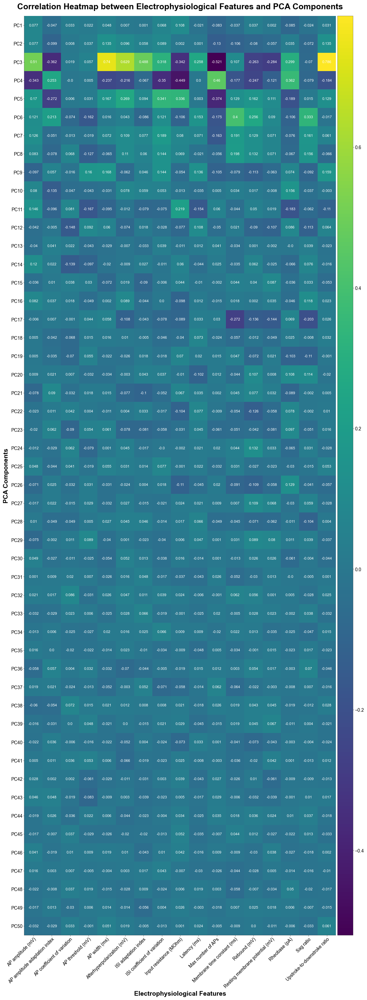

In [ ]:
# Identify Common Cells
common_cells = np.intersect1d(cells[keepcells], cells)

# Filter for common cells only
common_cells_filter = np.isin(cells, common_cells)

# Filter and Reorder PCA Data
pca_df = pd.DataFrame(
    PC_TMM_log[common_cells_filter],  # Filter rows based on common cells
    index=np.array(cells)[common_cells_filter],  # Filter cells
    columns=[f"PC{i+1}" for i in range(PC_TMM_log.shape[1])],
)

# Filter and Reorder Electrophysiological Data
ephys_common_cells_filter = np.isin(cells[keepcells], common_cells)
ephys_df = pd.DataFrame(
    ephysData_filtered[
        ephys_common_cells_filter
    ],  # Filter rows based on common cells
    index=np.array(cells)[keepcells][
        ephys_common_cells_filter
    ],  # Filter cells
    columns=filtered_ephysNames,
)

# Ensure alignment
assert np.all(
    pca_df.index == ephys_df.index
), "Cells are not aligned between PCA and electrophysiological data"

# Compute Correlations between PCA Components and Electrophysiological Features
correlations_pca = {}
for feature in ephys_df.columns:
    for pc in pca_df.columns:
        corr, _ = pearsonr(ephys_df[feature], pca_df[pc])
        correlations_pca[f"{feature} vs {pc}"] = corr

# Convert to DataFrame for easy viewing
correlation_pca_df = pd.DataFrame(
    list(correlations_pca.items()), columns=["Feature vs PC", "Correlation"]
)


# Split the "Feature vs PC" column into separate "Feature" and "PC" columns
correlation_pca_df[["Feature", "PC"]] = correlation_pca_df[
    "Feature vs PC"
].str.split(" vs ", expand=True)

# Verify the split
print(correlation_pca_df.head())

# Check for NaN values and shape
print("Number of NaN: ", correlation_pca_df.isna().sum().sum())

# Pivot the DataFrame to create a correlation matrix
correlation_matrix = correlation_pca_df.pivot(
    index="Feature", columns="PC", values="Correlation"
)

pc_labels = list(correlation_pca_df.to_dict()["PC"].values())[:50]
epyhs_labels = np.unique(
    list(correlation_pca_df.to_dict()["Feature"].values())
)
correlations = np.array(
    list((correlation_pca_df.to_dict()["Correlation"].values()))
).reshape(len(epyhs_labels), len(pc_labels))
fig, ax = plt.subplots(figsize=(30, 30))
im = ax.imshow(correlations.T, cmap="viridis")
ax.set_yticks(np.arange(len(pc_labels)), labels=pc_labels)
ax.set_xticks(np.arange(len(epyhs_labels)), labels=epyhs_labels)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

for j in range(len(epyhs_labels)):
    for i in range(len(pc_labels)):

        text = ax.text(
            j,
            i,
            np.round(correlations.T[i, j], decimals=3),
            ha="center",
            va="center",
            color="w",
            fontsize=8,
        )

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

ax.figure.colorbar(im, cax=cax, pad=0.5)
# cbar = ax.figure.colorbar(im, ax=ax)
ax.set_title(
    "Correlation Heatmap between Electrophysiological Features and PCA Components",
    fontsize=18,
    pad=15,
    fontweight="bold",
)
ax.set_xlabel("Electrophysiological Features", fontsize=14, fontweight="bold")
ax.set_ylabel("PCA Components", fontsize=14, fontweight="bold")

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">
    <strong> We observe</strong> a strong positive correlation between PC3 and both <strong>AP width</strong> (0.74) and the <strong>upstroke-to-downstroke ratio</strong> (0.79), while there is a strong negative correlation between PC3 and the <strong>maximum number of APs</strong> (-0.52). Additionally, moderate correlations are observed between PC3 and <strong>afterhyperpolarization</strong> (0.63), <strong>AP amplitude</strong> (0.51), and the <strong>ISI adaptation index</strong> (0.49).
</div>


<div style="background-color: yellow; color: black; padding: 2px; border-radius: 5px; font-size: 20px;"><strong>APPENDIX</strong></div>

#### 1.3.1A Asses for the presence of Heterscedacity

In [ ]:
# Add a constant to the independent variable for the intercept
X = sm.add_constant(average_expression)
Y = expression_variance

# Fit an OLS regression model
model = sm.OLS(Y, X).fit()

# Perform the Breusch-Pagan test
bp_test = het_breuschpagan(model.resid, model.model.exog)

labels = ["Lagrange multiplier statistic", "p-value", "f-value", "f p-value"]
result = dict(zip(labels, bp_test))

print("Breusch-Pagan Test Results:")
for key in result:
    print(f"{key}: {result[key]:.4f}")

Breusch-Pagan Test Results:
Lagrange multiplier statistic: 25477.8357
p-value: 0.0000
f-value: 63684.9745
f p-value: 0.0000


#### 2.2.1A Find optimum threshold for top genes

<div style="background-color: #FFD580; padding: 10px; border-radius: 5px;">To identify the optimal gene selection threshold that improves the performance of t-SNE and UMAP dimensionality reduction techniques in Task 3, we initially manually tested various thresholds and visually assessed their impact on data clustering, we concluded that a threshold of 400-500 is reasonalbe. However to validate our decision, we conducted a more rigorous analysis by performing cross-validation. This approach use an average score based on three different metrics: distance correlation, as well as kNN accuracy and recall, at different thresholds using our TMM log-transformed gene expression data.</div>

Best threshold for TMM (log-transformed) (t-SNE): 400.0
Best threshold for TMM (log-transformed) (UMAP): 600.0
Best threshold for CPM (log-transformed) (t-SNE): 400.0
Best threshold for CPM (log-transformed) (UMAP): 500.0


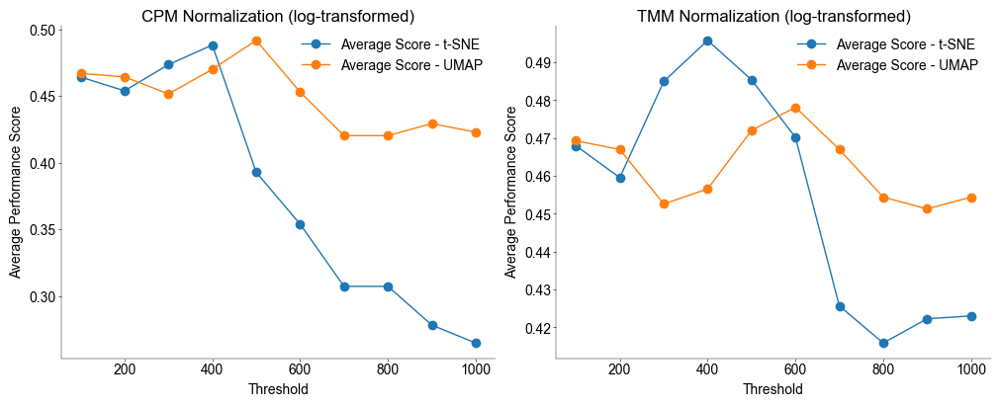

In [ ]:
# Distance Correlation Function
def distance_correlation(X, Y):
    def distance_covariance(X, Y):
        n = X.shape[0]
        a = squareform(pdist(X, "euclidean"))
        b = squareform(pdist(Y, "euclidean"))
        A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
        B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()
        return np.sqrt((A * B).sum() / (n * n))

    d_cov_XY = distance_covariance(X, Y)
    d_cov_XX = distance_covariance(X, X)
    d_cov_YY = distance_covariance(Y, Y)
    return d_cov_XY / np.sqrt(d_cov_XX * d_cov_YY)


# kNN Accuracy and Recall Function
def knn_accuracy_recall(high_dim_data, low_dim_data, labels, n_neighbors=5):
    knn_high = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn_low = KNeighborsClassifier(n_neighbors=n_neighbors)

    knn_high.fit(high_dim_data, labels)
    knn_low.fit(low_dim_data, labels)

    high_dim_pred = knn_high.predict(high_dim_data)
    low_dim_pred = knn_low.predict(low_dim_data)

    accuracy_high = accuracy_score(labels, high_dim_pred)
    accuracy_low = accuracy_score(labels, low_dim_pred)

    recall_high = recall_score(labels, high_dim_pred, average="weighted")
    recall_low = recall_score(labels, low_dim_pred, average="weighted")

    return accuracy_high, accuracy_low, recall_high, recall_low


# Evaluation Function with Cross-Validation
def evaluate_tsne_umap(counts, fano, labels, thresholds, n_PCs=50, n_splits=5):
    results = []
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    for threshold in thresholds:
        avg_score_tsne_list = []
        avg_score_umap_list = []

        for train_index, test_index in kf.split(counts):
            train_counts, test_counts = counts[train_index], counts[test_index]
            train_fano, test_fano = fano[train_index], fano[test_index]
            train_labels, test_labels = labels[train_index], labels[test_index]

            top_genes_indices = np.where(train_fano > threshold)
            top_genes_train = train_counts[:, top_genes_indices].reshape(
                train_counts.shape[0], -1
            )
            if top_genes_train.shape[1] < 2:
                continue

            # Adjust n_components to be within the valid range
            n_components = min(
                n_PCs, min(top_genes_train.shape[0], top_genes_train.shape[1])
            )

            pca = PCA(n_components=n_components)
            pc_train = pca.fit_transform(top_genes_train)

            tsne = TSNE(n_components=2, random_state=42)
            tsne_results_train = tsne.fit_transform(pc_train)

            umap_reducer = umap.UMAP(n_components=2, random_state=42, n_jobs=1)
            umap_results_train = umap_reducer.fit_transform(pc_train)

            # Apply PCA to test data
            top_genes_test = test_counts[:, top_genes_indices].reshape(
                test_counts.shape[0], -1
            )
            pc_test = pca.transform(top_genes_test)
            tsne_results_test = tsne.fit_transform(pc_test)
            umap_results_test = umap_reducer.fit_transform(pc_test)

            # Distance correlation
            dc_tsne = distance_correlation(pc_test, tsne_results_test)
            dc_umap = distance_correlation(pc_test, umap_results_test)

            # kNN accuracy and recall
            _, acc_tsne, _, recall_tsne = knn_accuracy_recall(
                pc_test, tsne_results_test, test_labels
            )
            _, acc_umap, _, recall_umap = knn_accuracy_recall(
                pc_test, umap_results_test, test_labels
            )

            avg_score_tsne = (dc_tsne + acc_tsne + recall_tsne) / 3
            avg_score_umap = (dc_umap + acc_umap + recall_umap) / 3

            avg_score_tsne_list.append(avg_score_tsne)
            avg_score_umap_list.append(avg_score_umap)

        results.append(
            (
                threshold,
                np.mean(avg_score_tsne_list),
                np.mean(avg_score_umap_list),
            )
        )

    best_threshold_tsne = max(results, key=lambda x: x[1])[0]
    best_threshold_umap = max(results, key=lambda x: x[2])[0]

    return best_threshold_tsne, best_threshold_umap, results


# Define thresholds range
thresholds = np.linspace(100, 1000, 10)

# Apply log transformation to TMM-normalized counts
TMM_counts_log = np.log1p(TMM_counts)  # np.log1p is used to compute log(1 + x)

# Update the evaluation with log-transformed TMM counts
best_threshold_tmm_log_tsne, best_threshold_tmm_log_umap, results_tmm_log = (
    evaluate_tsne_umap(TMM_counts_log, TMM_fano, cluster_colors, thresholds)
)
print(
    f"Best threshold for TMM (log-transformed) (t-SNE): {best_threshold_tmm_log_tsne}"
)
print(
    f"Best threshold for TMM (log-transformed) (UMAP): {best_threshold_tmm_log_umap}"
)

# Apply log transformation to CPM-normalized counts
CPM_counts_log = np.log1p(CPM_counts)

# Evaluate with log-transformed CPM counts
best_threshold_cpm_log_tsne, best_threshold_cpm_log_umap, results_cpm_log = (
    evaluate_tsne_umap(CPM_counts_log, CPM_fano, cluster_colors, thresholds)
)
print(
    f"Best threshold for CPM (log-transformed) (t-SNE): {best_threshold_cpm_log_tsne}"
)
print(
    f"Best threshold for CPM (log-transformed) (UMAP): {best_threshold_cpm_log_umap}"
)


# Plotting the evaluation results
def plot_evaluation_results(results, title, ax):
    thresholds, avg_score_tsne, avg_score_umap = zip(*results)

    ax.plot(
        thresholds, avg_score_tsne, marker="o", label="Average Score - t-SNE"
    )
    ax.plot(
        thresholds, avg_score_umap, marker="o", label="Average Score - UMAP"
    )

    ax.set_xlabel("Threshold")
    ax.set_ylabel("Average Performance Score")
    ax.set_title(title)
    ax.legend()
    ax.grid(False)


# Plot results for log-transformed TMM and CPM normalization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
plot_evaluation_results(
    results_cpm_log, "CPM Normalization (log-transformed)", ax1
)
plot_evaluation_results(
    results_tmm_log, "TMM Normalization (log-transformed)", ax2
)
# plt.tight_layout()
plt.show()

<div style="background-color: blue; color: yellow; padding: 2px; border-radius: 5px; text-align: center; font-size: 24px;"><strong>End of Project Solutions</strong></div>